<a href="https://colab.research.google.com/github/AndreiAf02/Transfer_Learning_Fine_Tuning_Update/blob/main/Bank_Marketing_Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Bank Marketing - Predicting Previous Term Deposit Outcomes from current Term Deposit Outcomes

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from time import perf_counter



from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
# !pip install pytorch-tabnet

# from pytorch_tabnet.tab_model import TabNetClassifier
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay



## Data taken from the UCI Machine Learning repository [here](https://doi.org/10.24432/C5K306):

In [2]:
pip install ucimlrepo

In [3]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
bank_marketing = fetch_ucirepo(id=222)

# data (as pandas dataframes)
X = bank_marketing.data.features
y = bank_marketing.data.targets

# metadata
print(bank_marketing.metadata)

# variable information
print(bank_marketing.variables)

{'uci_id': 222, 'name': 'Bank Marketing', 'repository_url': 'https://archive.ics.uci.edu/dataset/222/bank+marketing', 'data_url': 'https://archive.ics.uci.edu/static/public/222/data.csv', 'abstract': 'The data is related with direct marketing campaigns (phone calls) of a Portuguese banking institution. The classification goal is to predict if the client will subscribe a term deposit (variable y).', 'area': 'Business', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 45211, 'num_features': 16, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Occupation', 'Marital Status', 'Education Level'], 'target_col': ['y'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 2014, 'last_updated': 'Fri Aug 18 2023', 'dataset_doi': '10.24432/C5K306', 'creators': ['S. Moro', 'P. Rita', 'P. Cortez'], 'intro_paper': {'ID': 277, 'type': 'NATIVE', 'title': 'A data-driven approach to predict the s

In [4]:
X

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,NaN
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,NaN
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,NaN


In [5]:
X.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day_of_week', 'month', 'duration', 'campaign',
       'pdays', 'previous', 'poutcome'],
      dtype='object')

In [6]:
X_numeric = pd.DataFrame()

## Age:
X_numeric['age'] = X['age']

## Working class:
X_numeric['job'] = X['job']
X_numeric['job'].replace(['management', 'technician', 'entrepreneur', 'blue-collar', 'retired',
 'admin.', 'services', 'self-employed', 'unemployed', 'housemaid', 'student'],
                                [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], inplace=True)


## Marital:
X_numeric['marital'] = X['marital']
X_numeric['marital'].replace(['single', 'married', 'divorced'],
                                    [0, 1, 2], inplace=True)

## Education:
X_numeric['education'] = X['education']
X_numeric['education'].replace(['primary', 'secondary', 'tertiary'],
                                    [0, 1, 2], inplace=True)


## Credit Default:
X_numeric['default'] = X['default']
X_numeric['default'].replace(['no', 'yes'],
                                    [0, 1], inplace=True)



## Balance:
X_numeric['balance'] = X['balance']


## Housing:
X_numeric['housing'] = X['housing']
X_numeric['housing'].replace(['no', 'yes'],
                                    [0, 1], inplace=True)


## Loan:
X_numeric['loan'] = X['loan']
X_numeric['loan'].replace(['no', 'yes'],
                                    [0, 1], inplace=True)



## Contact:
X_numeric['contact'] = X['contact']
X_numeric['contact'].replace([np.nan, 'cellular', 'telephone'],
                                    [0, 1, 2], inplace=True)


## Day of week:
X_numeric['day_of_week'] = X['day_of_week']


## Month:
X_numeric['month'] = X['month']
X_numeric['month'].replace(['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'],
                                    [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], inplace=True)


## Duration:
X_numeric['duration'] = X['duration']

## Campaign:
X_numeric['campaign'] = X['campaign']


## Pdays:
X_numeric['pdays'] = X['pdays']
# X_numeric['pdays'].replace([-1], [np.nan], inplace=True)

## Previous:
X_numeric['previous'] = X['previous']

# ## Poutcome:
# X_numeric['poutcome'] = X['poutcome']
# X_numeric['poutcome'].replace([np.nan, 'failure', 'success', 'other'],
#                                     [np.nan, 0, 1, 0], inplace=True)  ## For training the source data, we drop all datapoints without previous interaction


## Poutcome (new target predictor Y):
X_numeric['Y'] = X['poutcome']
X_numeric['Y'].replace([np.nan, 'failure', 'success', 'other'],
                                    [np.nan, 0, 1, 0], inplace=True)  ## For training the source data, we drop all datapoints without previous interaction





## ---------------------- Response variable y: --------------------

## Income:
y_numeric = pd.DataFrame()
y_numeric['Y2'] = y['y']
y_numeric['Y2'].replace(['no', 'yes'],
                          [0, 1], inplace=True)

X_numeric


<ipython-input-6-ff88b314d7d9>:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_numeric['job'].replace(['management', 'technician', 'entrepreneur', 'blue-collar', 'retired',
<ipython-input-6-ff88b314d7d9>:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X_numeric['job'].replace(['management', 'tec

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,Y
0,58,0.0,1,2.0,0,2143,1,0,0,5,4,261,1,-1,0,NaN
1,44,1.0,0,1.0,0,29,1,0,0,5,4,151,1,-1,0,NaN
2,33,2.0,1,1.0,0,2,1,1,0,5,4,76,1,-1,0,NaN
3,47,3.0,1,NaN,0,1506,1,0,0,5,4,92,1,-1,0,NaN
4,33,NaN,0,NaN,0,1,0,0,0,5,4,198,1,-1,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,1.0,1,2.0,0,825,0,0,1,17,10,977,3,-1,0,NaN
45207,71,4.0,2,0.0,0,1729,0,0,1,17,10,456,2,-1,0,NaN
45208,72,4.0,1,1.0,0,5715,0,0,1,17,10,1127,5,184,3,1.0
45209,57,3.0,1,1.0,0,668,0,0,2,17,10,508,4,-1,0,NaN


In [7]:
y_numeric.value_counts()

,count
Y2,
0,39922
1,5289


In [8]:
X['poutcome'].value_counts()

,count
poutcome,
failure,4901
other,1840
success,1511


In [9]:
X_numeric['Y'].value_counts()

,count
Y,
0.0,6741
1.0,1511


In [10]:
X_numeric['Y']

,Y
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
45206,NaN
45207,NaN
45208,1.0
45209,NaN


In [11]:
data_total = pd.concat([X_numeric, y_numeric], axis=1)

data_total

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,Y,Y2
0,58,0.0,1,2.0,0,2143,1,0,0,5,4,261,1,-1,0,NaN,0
1,44,1.0,0,1.0,0,29,1,0,0,5,4,151,1,-1,0,NaN,0
2,33,2.0,1,1.0,0,2,1,1,0,5,4,76,1,-1,0,NaN,0
3,47,3.0,1,NaN,0,1506,1,0,0,5,4,92,1,-1,0,NaN,0
4,33,NaN,0,NaN,0,1,0,0,0,5,4,198,1,-1,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,1.0,1,2.0,0,825,0,0,1,17,10,977,3,-1,0,NaN,1
45207,71,4.0,2,0.0,0,1729,0,0,1,17,10,456,2,-1,0,NaN,1
45208,72,4.0,1,1.0,0,5715,0,0,1,17,10,1127,5,184,3,1.0,1
45209,57,3.0,1,1.0,0,668,0,0,2,17,10,508,4,-1,0,NaN,0


In [12]:
data_total['Y2'].value_counts()

,count
Y2,
0,39922
1,5289


In [13]:
data_total['Y'].value_counts()

,count
Y,
0.0,6741
1.0,1511


In [14]:
X = data_total.iloc[:, :-2]
y = data_total.iloc[:,-2]
y2 = data_total.iloc[:,-1]
y

,Y
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
45206,NaN
45207,NaN
45208,1.0
45209,NaN


In [15]:
y2

,Y2
0,0
1,0
2,0
3,0
4,0
...,...
45206,1
45207,1
45208,1
45209,0


In [16]:
X

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous
0,58,0.0,1,2.0,0,2143,1,0,0,5,4,261,1,-1,0
1,44,1.0,0,1.0,0,29,1,0,0,5,4,151,1,-1,0
2,33,2.0,1,1.0,0,2,1,1,0,5,4,76,1,-1,0
3,47,3.0,1,NaN,0,1506,1,0,0,5,4,92,1,-1,0
4,33,NaN,0,NaN,0,1,0,0,0,5,4,198,1,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,1.0,1,2.0,0,825,0,0,1,17,10,977,3,-1,0
45207,71,4.0,2,0.0,0,1729,0,0,1,17,10,456,2,-1,0
45208,72,4.0,1,1.0,0,5715,0,0,1,17,10,1127,5,184,3
45209,57,3.0,1,1.0,0,668,0,0,2,17,10,508,4,-1,0


In [17]:
y.value_counts()

,count
Y,
0.0,6741
1.0,1511


In [18]:
y2.value_counts()

,count
Y2,
0,39922
1,5289


In [19]:
## Scaling the predictive data

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled = pd.DataFrame(X_scaled)

In [20]:
data2 = pd.concat([X_scaled, y, y2], axis=1)
data2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y,Y2
0,0.519481,0.0,0.5,1.0,0.0,0.092259,1.0,0.0,0.0,0.133333,0.363636,0.053070,0.000000,0.000000,0.000000,NaN,0
1,0.337662,0.1,0.0,0.5,0.0,0.073067,1.0,0.0,0.0,0.133333,0.363636,0.030704,0.000000,0.000000,0.000000,NaN,0
2,0.194805,0.2,0.5,0.5,0.0,0.072822,1.0,1.0,0.0,0.133333,0.363636,0.015453,0.000000,0.000000,0.000000,NaN,0
3,0.376623,0.3,0.5,NaN,0.0,0.086476,1.0,0.0,0.0,0.133333,0.363636,0.018707,0.000000,0.000000,0.000000,NaN,0
4,0.194805,NaN,0.0,NaN,0.0,0.072812,0.0,0.0,0.0,0.133333,0.363636,0.040260,0.000000,0.000000,0.000000,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.428571,0.1,0.5,1.0,0.0,0.080293,0.0,0.0,0.5,0.533333,0.909091,0.198658,0.032258,0.000000,0.000000,NaN,1
45207,0.688312,0.4,1.0,0.0,0.0,0.088501,0.0,0.0,0.5,0.533333,0.909091,0.092721,0.016129,0.000000,0.000000,NaN,1
45208,0.701299,0.4,0.5,0.5,0.0,0.124689,0.0,0.0,0.5,0.533333,0.909091,0.229158,0.064516,0.212156,0.010909,1.0,1
45209,0.506494,0.3,0.5,0.5,0.0,0.078868,0.0,0.0,1.0,0.533333,0.909091,0.103294,0.048387,0.000000,0.000000,NaN,0


In [21]:
data_total

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,Y,Y2
0,58,0.0,1,2.0,0,2143,1,0,0,5,4,261,1,-1,0,NaN,0
1,44,1.0,0,1.0,0,29,1,0,0,5,4,151,1,-1,0,NaN,0
2,33,2.0,1,1.0,0,2,1,1,0,5,4,76,1,-1,0,NaN,0
3,47,3.0,1,NaN,0,1506,1,0,0,5,4,92,1,-1,0,NaN,0
4,33,NaN,0,NaN,0,1,0,0,0,5,4,198,1,-1,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,1.0,1,2.0,0,825,0,0,1,17,10,977,3,-1,0,NaN,1
45207,71,4.0,2,0.0,0,1729,0,0,1,17,10,456,2,-1,0,NaN,1
45208,72,4.0,1,1.0,0,5715,0,0,1,17,10,1127,5,184,3,1.0,1
45209,57,3.0,1,1.0,0,668,0,0,2,17,10,508,4,-1,0,NaN,0


In [22]:
y.value_counts()

,count
Y,
0.0,6741
1.0,1511


In [23]:
y2.value_counts()

,count
Y2,
0,39922
1,5289


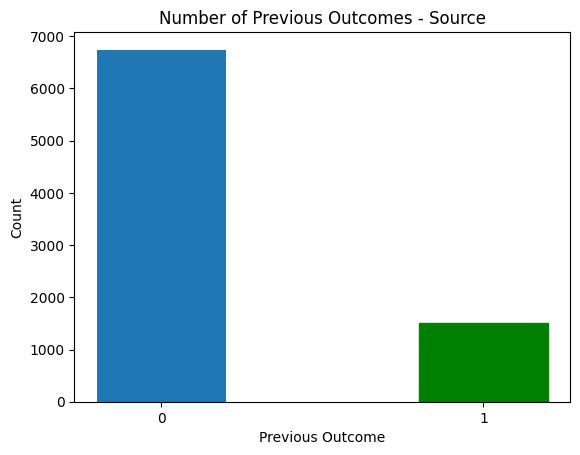

In [24]:
barlist = plt.bar([str(0),str(1)], y.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Previous Outcome")
plt.ylabel("Count")
plt.title("Number of Previous Outcomes - Source")
plt.show()

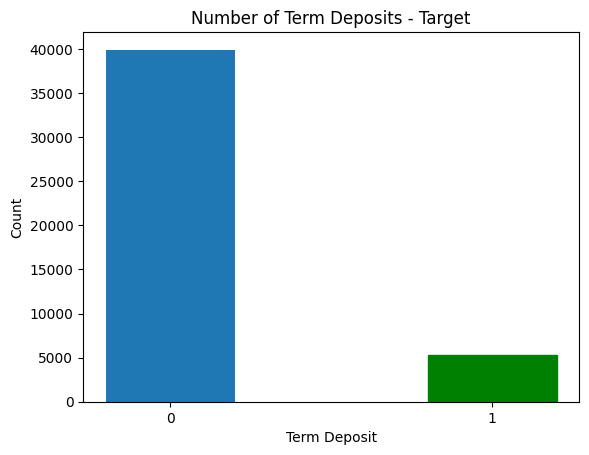

In [25]:
barlist = plt.bar([str(0),str(1)], y2.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Term Deposit")
plt.ylabel("Count")
plt.title("Number of Term Deposits - Target")
plt.show()

# Splitting for Source and Target Domains:


# Full Dataset:

For the Heart Disease prediction, we split the dataset between low education level (**now including high-school dropouts**) and the high education level. The high-education data (with diabetes as response variable/label) becomes the source data and the low-education data (with Heart Disease as response variable/label) is the target data.

In [26]:
data2[data2['Y'].isna()==1]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y,Y2
0,0.519481,0.0,0.5,1.0,0.0,0.092259,1.0,0.0,0.0,0.133333,0.363636,0.053070,0.000000,0.0,0.0,NaN,0
1,0.337662,0.1,0.0,0.5,0.0,0.073067,1.0,0.0,0.0,0.133333,0.363636,0.030704,0.000000,0.0,0.0,NaN,0
2,0.194805,0.2,0.5,0.5,0.0,0.072822,1.0,1.0,0.0,0.133333,0.363636,0.015453,0.000000,0.0,0.0,NaN,0
3,0.376623,0.3,0.5,NaN,0.0,0.086476,1.0,0.0,0.0,0.133333,0.363636,0.018707,0.000000,0.0,0.0,NaN,0
4,0.194805,NaN,0.0,NaN,0.0,0.072812,0.0,0.0,0.0,0.133333,0.363636,0.040260,0.000000,0.0,0.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45203,0.064935,1.0,0.0,1.0,0.0,0.073829,0.0,0.0,0.5,0.533333,0.909091,0.054087,0.000000,0.0,0.0,NaN,1
45205,0.090909,0.1,0.0,0.5,0.0,0.077388,0.0,1.0,0.5,0.533333,0.909091,0.078487,0.016129,0.0,0.0,NaN,1
45206,0.428571,0.1,0.5,1.0,0.0,0.080293,0.0,0.0,0.5,0.533333,0.909091,0.198658,0.032258,0.0,0.0,NaN,1
45207,0.688312,0.4,1.0,0.0,0.0,0.088501,0.0,0.0,0.5,0.533333,0.909091,0.092721,0.016129,0.0,0.0,NaN,1


In [27]:
## Filtering data without any previous contact:
data_S = data2[data2['Y'].isna()==1].reset_index(drop=True) ## Source domain and classification - No previous contact
data_S_X = data_S.iloc[:,:-2]
data_S_y = data_S.iloc[:, -1]
data_S_full = pd.concat([data_S_X, data_S_y], axis=1).dropna().reset_index(drop=True)


## Filtering data with previous contact as target data:
data_T = data2[data2['Y2'].isna() !=1].reset_index(drop=True) ## Target domain and classification - Previous contact
data_T_X = data_T.iloc[:,:-2]
data_T_y = data_T.iloc[:, -2]    ## Response variable of interest in Default
data_T_full = pd.concat([data_T_X, data_T_y], axis=1).dropna().reset_index(drop=True)

In [28]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y2
0,0.519481,0.0,0.5,1.0,0.0,0.092259,1.0,0.0,0.0,0.133333,0.363636,0.053070,0.000000,0.0,0.0,0
1,0.337662,0.1,0.0,0.5,0.0,0.073067,1.0,0.0,0.0,0.133333,0.363636,0.030704,0.000000,0.0,0.0,0
2,0.194805,0.2,0.5,0.5,0.0,0.072822,1.0,1.0,0.0,0.133333,0.363636,0.015453,0.000000,0.0,0.0,0
3,0.220779,0.0,0.5,1.0,0.0,0.074901,1.0,0.0,0.0,0.133333,0.363636,0.028264,0.000000,0.0,0.0,0
4,0.129870,0.0,0.0,1.0,0.0,0.076862,1.0,1.0,0.0,0.133333,0.363636,0.044124,0.000000,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35281,0.064935,1.0,0.0,1.0,0.0,0.073829,0.0,0.0,0.5,0.533333,0.909091,0.054087,0.000000,0.0,0.0,1
35282,0.090909,0.1,0.0,0.5,0.0,0.077388,0.0,1.0,0.5,0.533333,0.909091,0.078487,0.016129,0.0,0.0,1
35283,0.428571,0.1,0.5,1.0,0.0,0.080293,0.0,0.0,0.5,0.533333,0.909091,0.198658,0.032258,0.0,0.0,1
35284,0.688312,0.4,1.0,0.0,0.0,0.088501,0.0,0.0,0.5,0.533333,0.909091,0.092721,0.016129,0.0,0.0,1


In [29]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y
0,0.194805,0.5,0.5,1.0,0.0,0.080811,0.0,0.0,1.0,0.666667,0.818182,0.007930,0.000000,0.174312,0.010909,0.0
1,0.311688,0.5,0.0,0.5,0.0,0.070561,1.0,1.0,1.0,0.666667,0.818182,0.105531,0.000000,0.191514,0.003636,0.0
2,0.194805,0.6,0.5,0.5,0.0,0.104071,1.0,0.0,1.0,0.666667,0.818182,0.029280,0.000000,0.105505,0.014545,0.0
3,0.233766,0.0,0.5,1.0,0.0,0.094729,1.0,0.0,1.0,0.700000,0.818182,0.014843,0.000000,0.099771,0.014545,0.0
4,0.233766,0.0,0.5,1.0,0.0,0.072803,1.0,0.0,1.0,0.733333,0.818182,0.028467,0.000000,0.165138,0.010909,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,0.207792,0.3,0.0,0.5,0.0,0.086195,1.0,0.0,0.5,0.500000,0.909091,0.237088,0.032258,0.608945,0.043636,0.0
7903,0.454545,0.0,0.5,1.0,0.0,0.078096,0.0,0.0,0.5,0.533333,0.909091,0.045954,0.000000,0.212156,0.014545,1.0
7904,0.714286,0.4,0.5,0.5,0.0,0.098678,0.0,0.0,0.5,0.533333,0.909091,0.061000,0.000000,0.047018,0.029091,0.0
7905,0.701299,0.4,0.5,0.5,0.0,0.124689,0.0,0.0,0.5,0.533333,0.909091,0.229158,0.064516,0.212156,0.010909,1.0


In [30]:
data_S_X = data_S_full.iloc[:, :-1]
data_S_y = data_S_full.iloc[:, -1]

data_T_X = data_T_full.iloc[:, :-1]
data_T_y = data_T_full.iloc[:, -1]

In [31]:
data_S_full['Y2'].value_counts()

,count
Y2,
0,32062
1,3224


In [32]:
data_T_full['Y'].value_counts()

,count
Y,
0.0,6483
1.0,1424


In [33]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y2
0,0.519481,0.0,0.5,1.0,0.0,0.092259,1.0,0.0,0.0,0.133333,0.363636,0.053070,0.000000,0.0,0.0,0
1,0.337662,0.1,0.0,0.5,0.0,0.073067,1.0,0.0,0.0,0.133333,0.363636,0.030704,0.000000,0.0,0.0,0
2,0.194805,0.2,0.5,0.5,0.0,0.072822,1.0,1.0,0.0,0.133333,0.363636,0.015453,0.000000,0.0,0.0,0
3,0.220779,0.0,0.5,1.0,0.0,0.074901,1.0,0.0,0.0,0.133333,0.363636,0.028264,0.000000,0.0,0.0,0
4,0.129870,0.0,0.0,1.0,0.0,0.076862,1.0,1.0,0.0,0.133333,0.363636,0.044124,0.000000,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35281,0.064935,1.0,0.0,1.0,0.0,0.073829,0.0,0.0,0.5,0.533333,0.909091,0.054087,0.000000,0.0,0.0,1
35282,0.090909,0.1,0.0,0.5,0.0,0.077388,0.0,1.0,0.5,0.533333,0.909091,0.078487,0.016129,0.0,0.0,1
35283,0.428571,0.1,0.5,1.0,0.0,0.080293,0.0,0.0,0.5,0.533333,0.909091,0.198658,0.032258,0.0,0.0,1
35284,0.688312,0.4,1.0,0.0,0.0,0.088501,0.0,0.0,0.5,0.533333,0.909091,0.092721,0.016129,0.0,0.0,1


In [34]:
data_S_X

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.519481,0.0,0.5,1.0,0.0,0.092259,1.0,0.0,0.0,0.133333,0.363636,0.053070,0.000000,0.0,0.0
1,0.337662,0.1,0.0,0.5,0.0,0.073067,1.0,0.0,0.0,0.133333,0.363636,0.030704,0.000000,0.0,0.0
2,0.194805,0.2,0.5,0.5,0.0,0.072822,1.0,1.0,0.0,0.133333,0.363636,0.015453,0.000000,0.0,0.0
3,0.220779,0.0,0.5,1.0,0.0,0.074901,1.0,0.0,0.0,0.133333,0.363636,0.028264,0.000000,0.0,0.0
4,0.129870,0.0,0.0,1.0,0.0,0.076862,1.0,1.0,0.0,0.133333,0.363636,0.044124,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35281,0.064935,1.0,0.0,1.0,0.0,0.073829,0.0,0.0,0.5,0.533333,0.909091,0.054087,0.000000,0.0,0.0
35282,0.090909,0.1,0.0,0.5,0.0,0.077388,0.0,1.0,0.5,0.533333,0.909091,0.078487,0.016129,0.0,0.0
35283,0.428571,0.1,0.5,1.0,0.0,0.080293,0.0,0.0,0.5,0.533333,0.909091,0.198658,0.032258,0.0,0.0
35284,0.688312,0.4,1.0,0.0,0.0,0.088501,0.0,0.0,0.5,0.533333,0.909091,0.092721,0.016129,0.0,0.0


In [35]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y
0,0.194805,0.5,0.5,1.0,0.0,0.080811,0.0,0.0,1.0,0.666667,0.818182,0.007930,0.000000,0.174312,0.010909,0.0
1,0.311688,0.5,0.0,0.5,0.0,0.070561,1.0,1.0,1.0,0.666667,0.818182,0.105531,0.000000,0.191514,0.003636,0.0
2,0.194805,0.6,0.5,0.5,0.0,0.104071,1.0,0.0,1.0,0.666667,0.818182,0.029280,0.000000,0.105505,0.014545,0.0
3,0.233766,0.0,0.5,1.0,0.0,0.094729,1.0,0.0,1.0,0.700000,0.818182,0.014843,0.000000,0.099771,0.014545,0.0
4,0.233766,0.0,0.5,1.0,0.0,0.072803,1.0,0.0,1.0,0.733333,0.818182,0.028467,0.000000,0.165138,0.010909,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,0.207792,0.3,0.0,0.5,0.0,0.086195,1.0,0.0,0.5,0.500000,0.909091,0.237088,0.032258,0.608945,0.043636,0.0
7903,0.454545,0.0,0.5,1.0,0.0,0.078096,0.0,0.0,0.5,0.533333,0.909091,0.045954,0.000000,0.212156,0.014545,1.0
7904,0.714286,0.4,0.5,0.5,0.0,0.098678,0.0,0.0,0.5,0.533333,0.909091,0.061000,0.000000,0.047018,0.029091,0.0
7905,0.701299,0.4,0.5,0.5,0.0,0.124689,0.0,0.0,0.5,0.533333,0.909091,0.229158,0.064516,0.212156,0.010909,1.0


## Source domain and task labels:

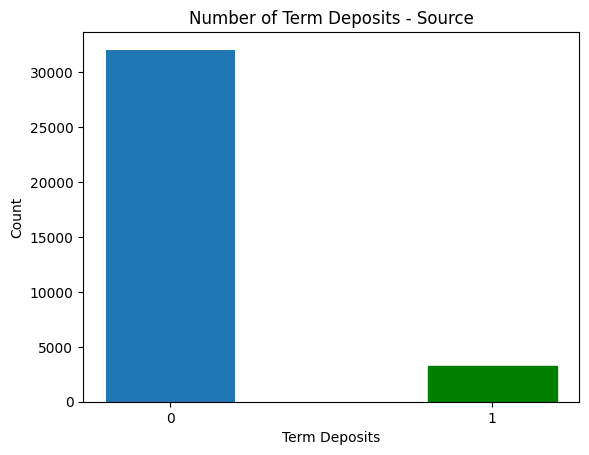

In [36]:
barlist_S = plt.bar([str(0),str(1)], data_S_y.value_counts(), width = 0.4)
barlist_S[1].set_color('g')

plt.xlabel("Term Deposits")
plt.ylabel("Count")
plt.title("Number of Term Deposits - Source")
plt.show()

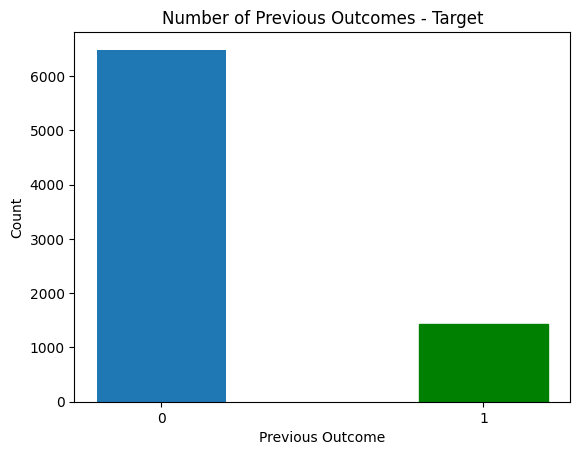

In [37]:
barlist_T = plt.bar([str(0),str(1)], data_T_y.value_counts(), width = 0.4)
barlist_T[1].set_color('g')

plt.xlabel("Previous Outcome")
plt.ylabel("Count")
plt.title("Number of Previous Outcomes - Target")
plt.show()

## Updated Code (Modified from Shreya's code):

In [38]:
def create_dnn_model(input_shape):
  model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
    ])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

  model.summary()
  print(len(model.layers))

  return model

# def create_dnn_model(input_shape):
#   model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
#         layers.Dense(32, activation='relu'),
#         layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
#     ])

#   model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

#   return model



def train_and_evaluate(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    model.save('model.h5')
    model.save_weights('model_wt.weights.h5')

    return model


In [39]:
def train_and_evaluate_nosave(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])

    print(fpr)
    print(fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    return fpr, fnr


In [40]:
def fine_tuning(X_train, X_test, y_train, y_test, llim, ulim):
    new_model = create_dnn_model(X_S_train.shape[1])
    # new_model = tf.keras.models.load_model('model.h5')
    new_model.load_weights('model_wt.weights.h5')

    for layer in new_model.layers[llim:ulim]:
        layer.trainable = False
    for layer in new_model.layers[-1:]:
        layer.trainable = False

    for layer in new_model.layers:
        if layer.trainable == True:
          print("Trainable")
        else:
          print("Not Trainable")

    fpr, fnr = train_and_evaluate_nosave(new_model, X_train, X_test, y_train, y_test, "Target")
    return fpr, fnr

In [41]:
def Transductive_TL(model, X_test, y_test, domain):

    time_start = perf_counter()

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    # print('Confusion matrix:', conf_matrix)
    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    tnr = 1-fpr

    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])
    tpr = 1 - fnr
    print('FPR', fpr, 'TPR:', tpr, 'FNR:', fnr, 'TNR:', tnr)
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")
    print('False Negative Rate:', fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

# Over/undersampling functions:

## Undersampling functions:

In [42]:
import random

def SRS_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=False)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def SRSwR_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=True)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def systematic_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.randint(1, int(k))
    print(start)
    Row = []
    for i in range(undersample_size):
      row = start+int(k*i)-1
      Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy



def multi_systematic_undersampler(data, data_column, m):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.sample(range(1, int(k*m)), m)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/m)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy

## Oversampling functions:

In [43]:
def SRSwR_oversampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_min_ros = data_minority.sample(n=oversample_size - undersample_size, replace=True)
    data_SRS_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_SRS = data_SRS_ROS.iloc[:, :-1]
    y_SRS = data_SRS_ROS.iloc[:, -1]

    return X_SRS, y_SRS

# data_S_min_ros = data_S_minority.sample(n=oversample_size - undersample_size, replace=True)


def systematic_resampler(data, data_column, k):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    Nsamples = k*(oversample_size-undersample_size)/undersample_size
    print('Nsamples=', Nsamples)

    np.random.seed(123)
    start = np.random.choice(int(k), int(Nsamples), replace=True)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/k)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    data_min_ros = pd.DataFrame()
    data_min_ros = data_minority.iloc[Row]

    data_Sy_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_Sy = data_Sy_ROS.iloc[:, :-1]
    y_Sy = data_Sy_ROS.iloc[:, -1]

    return X_Sy, y_Sy

# k = 48

# Nsamples = k*(oversample_size-undersample_size)/undersample_size
# # print(Nsamples)

# np.random.seed(123)
# start = np.random.choice(int(k), int(Nsamples), replace=True)
# # print(start)


# Row = []

# for j in range(len(start)):
#   for i in range(int(undersample_size/k)):
#     row = start[j]+int(k*i)-1
#     Row.append(row)

In [44]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(data_S_X, data_S_y, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)

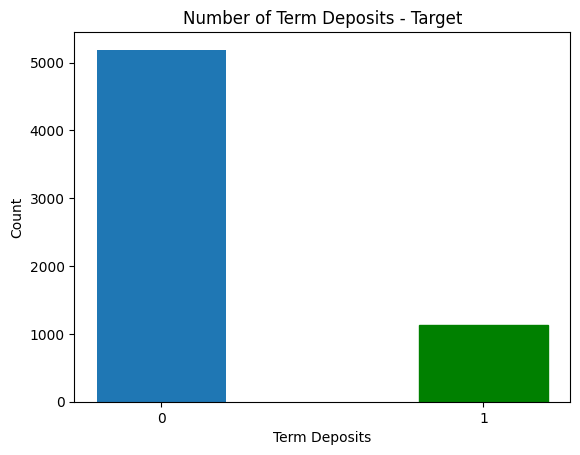

In [45]:
barlist = plt.bar([str(0),str(1)], y_T_train.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Term Deposits")
plt.ylabel("Count")
plt.title("Number of Term Deposits - Target")
plt.show()

In [46]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (28228, 15)
y_S_train: (28228,)
X_S_test: (7058, 15)
y_S_test: (7058,)


# Original (Imbalanced) dataset:



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.6469 - loss: 0.3257 - val_AUC: 0.8825 - val_loss: 0.2160
Epoch 2/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - AUC: 0.8805 - loss: 0.2128 - val_AUC: 0.8889 - val_loss: 0.2105
Epoch 3/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8907 - loss: 0.2037 - val_AUC: 0.8926 - val_loss: 0.2102
Epoch 4/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8937 - loss: 0.2043 - val_AUC: 0.8932 - val_loss: 0.2086
Epoch 5/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.9043 - loss: 0.1916 - val_AUC: 0.8961 - val_loss: 0.2084
Epoch 6/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9030 - loss: 0.1958 - val_AUC: 0.8948 - val_loss: 0.2099
Epoch 7/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.9033 - loss: 0.1960 - val_AUC: 0.8925 - val_loss: 0.2090
Epoch 8/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - AUC: 0.9039 - loss: 0.1960 - val_AUC: 0.8985 - val_loss: 0.2041
Epoch 9/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - 

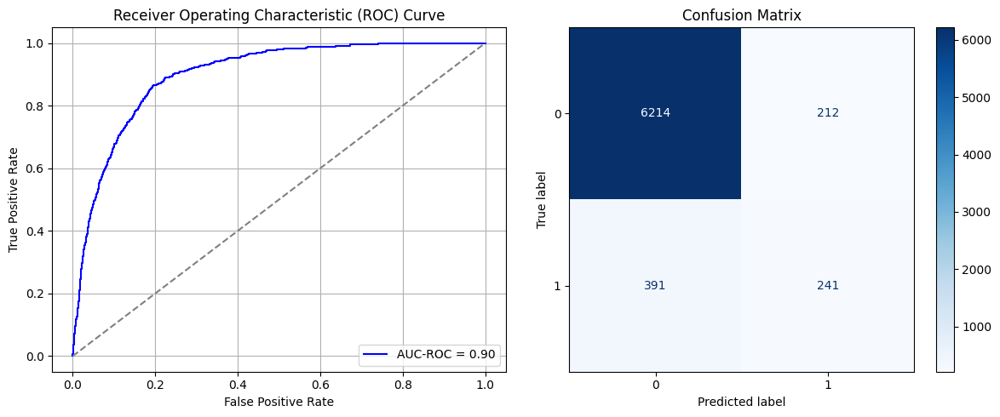

Best threshold based on F1-score: 0.32685235142707825
Time elapsed (performance): 60.29482674200017


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - AUC: 0.6931 - loss: 0.4712 - val_AUC: 0.6749 - val_loss: 0.4457
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.4345 - val_AUC: 0.6980 - val_loss: 0.4324
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.4290 - val_AUC: 0.7158 - val_loss: 0.4253
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7440 - loss: 0.4201 - val_AUC: 0.7204 - val_loss: 0.4224
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7430 - loss: 0.4142 - val_AUC: 0.7254 - val_loss: 0.4200
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.4260 - val_AUC: 0.7252 - val_loss: 0.4212
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7567 - loss: 0.4126 - val_AUC: 0.7281 - val_loss: 0.4193
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.4177 - val_AUC: 0.7312 - val_loss: 0.4185
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7551 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.6837 - loss: 0.4710 - val_AUC: 0.6757 - val_loss: 0.4462
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.4230 - val_AUC: 0.6971 - val_loss: 0.4330
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7436 - loss: 0.4022 - val_AUC: 0.7140 - val_loss: 0.4254
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7490 - loss: 0.4076 - val_AUC: 0.7225 - val_loss: 0.4222
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7397 - loss: 0.4174 - val_AUC: 0.7256 - val_loss: 0.4200
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7465 - loss: 0.4151 - val_AUC: 0.7282 - val_loss: 0.4189
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.3947 - val_AUC: 0.7305 - val_loss: 0.4203
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7529 - loss: 0.3970 - val_AUC: 0.7312 - val_loss: 0.4198
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7619 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6951 - loss: 0.4510 - val_AUC: 0.6768 - val_loss: 0.4451
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7130 - loss: 0.4261 - val_AUC: 0.6990 - val_loss: 0.4321
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7342 - loss: 0.4147 - val_AUC: 0.7137 - val_loss: 0.4263
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7409 - loss: 0.4019 - val_AUC: 0.7224 - val_loss: 0.4220
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7433 - loss: 0.4126 - val_AUC: 0.7239 - val_loss: 0.4213
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7377 - loss: 0.4120 - val_AUC: 0.7257 - val_loss: 0.4201
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7659 - loss: 0.4029 - val_AUC: 0.7286 - val_loss: 0.4182
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7399 - loss: 0.4125 - val_AUC: 0.7280 - val_loss: 0.4201
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7606 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7035 - loss: 0.4561 - val_AUC: 0.6757 - val_loss: 0.4464
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7278 - loss: 0.4231 - val_AUC: 0.6993 - val_loss: 0.4316
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7334 - loss: 0.4215 - val_AUC: 0.7162 - val_loss: 0.4242
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7467 - loss: 0.4170 - val_AUC: 0.7224 - val_loss: 0.4219
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.4157 - val_AUC: 0.7238 - val_loss: 0.4220
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7463 - loss: 0.4224 - val_AUC: 0.7266 - val_loss: 0.4203
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7458 - loss: 0.3964 - val_AUC: 0.7291 - val_loss: 0.4192
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7598 - loss: 0.4041 - val_AUC: 0.7284 - val_loss: 0.4186
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7492 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6853 - loss: 0.4755 - val_AUC: 0.6774 - val_loss: 0.4461
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7273 - loss: 0.4229 - val_AUC: 0.7024 - val_loss: 0.4303
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7441 - loss: 0.4193 - val_AUC: 0.7144 - val_loss: 0.4263
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.4308 - val_AUC: 0.7216 - val_loss: 0.4220
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7447 - loss: 0.4115 - val_AUC: 0.7217 - val_loss: 0.4237
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7595 - loss: 0.4058 - val_AUC: 0.7258 - val_loss: 0.4200
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7567 - loss: 0.4084 - val_AUC: 0.7280 - val_loss: 0.4189
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7525 - loss: 0.4133 - val_AUC: 0.7334 - val_loss: 0.4195
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - A

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6968 - loss: 0.4372 - val_AUC: 0.6806 - val_loss: 0.4432
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7239 - loss: 0.4274 - val_AUC: 0.7063 - val_loss: 0.4291
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7278 - loss: 0.4204 - val_AUC: 0.7186 - val_loss: 0.4238
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 - loss: 0.4103 - val_AUC: 0.7249 - val_loss: 0.4204
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7495 - loss: 0.4067 - val_AUC: 0.7265 - val_loss: 0.4204
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7562 - loss: 0.4199 - val_AUC: 0.7265 - val_loss: 0.4218
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7544 - loss: 0.3994 - val_AUC: 0.7304 - val_loss: 0.4189
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7476 - loss: 0.4036 - val_AUC: 0.7305 - val_loss: 0.4180
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7689 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7085 - loss: 0.4539 - val_AUC: 0.6763 - val_loss: 0.4455
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7207 - loss: 0.4129 - val_AUC: 0.7018 - val_loss: 0.4309
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7429 - loss: 0.4197 - val_AUC: 0.7161 - val_loss: 0.4263
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7432 - loss: 0.4208 - val_AUC: 0.7214 - val_loss: 0.4227
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7522 - loss: 0.4138 - val_AUC: 0.7261 - val_loss: 0.4197
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7501 - loss: 0.4070 - val_AUC: 0.7292 - val_loss: 0.4193
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7681 - loss: 0.4044 - val_AUC: 0.7285 - val_loss: 0.4182
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7710 - loss: 0.4020 - val_AUC: 0.7286 - val_loss: 0.4187
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7633 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6998 - loss: 0.4525 - val_AUC: 0.6773 - val_loss: 0.4451
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7257 - loss: 0.4150 - val_AUC: 0.6996 - val_loss: 0.4314
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7456 - loss: 0.3972 - val_AUC: 0.7152 - val_loss: 0.4259
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7389 - loss: 0.4117 - val_AUC: 0.7203 - val_loss: 0.4225
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7610 - loss: 0.4086 - val_AUC: 0.7244 - val_loss: 0.4205
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7608 - loss: 0.4040 - val_AUC: 0.7281 - val_loss: 0.4189
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7423 - loss: 0.4096 - val_AUC: 0.7247 - val_loss: 0.4229
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7612 - loss: 0.4125 - val_AUC: 0.7276 - val_loss: 0.4191
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7588 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6970 - loss: 0.4491 - val_AUC: 0.6763 - val_loss: 0.4453
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.4271 - val_AUC: 0.7001 - val_loss: 0.4315
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7282 - loss: 0.4161 - val_AUC: 0.7182 - val_loss: 0.4235
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4156 - val_AUC: 0.7243 - val_loss: 0.4211
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7502 - loss: 0.4161 - val_AUC: 0.7262 - val_loss: 0.4204
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7546 - loss: 0.4125 - val_AUC: 0.7260 - val_loss: 0.4220
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7424 - loss: 0.4254 - val_AUC: 0.7298 - val_loss: 0.4179
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7461 - loss: 0.4012 - val_AUC: 0.7256 - val_loss: 0.4263
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7527 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6782 - loss: 0.4565 - val_AUC: 0.6756 - val_loss: 0.4467
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7071 - loss: 0.4354 - val_AUC: 0.7016 - val_loss: 0.4313
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7198 - loss: 0.4340 - val_AUC: 0.7115 - val_loss: 0.4310
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7530 - loss: 0.3981 - val_AUC: 0.7228 - val_loss: 0.4215
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7424 - loss: 0.4081 - val_AUC: 0.7251 - val_loss: 0.4203
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7516 - loss: 0.4072 - val_AUC: 0.7258 - val_loss: 0.4201
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7582 - loss: 0.3983 - val_AUC: 0.7297 - val_loss: 0.4201
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7577 - loss: 0.4303 - val_AUC: 0.7273 - val_loss: 0.4212
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7524 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7000 - loss: 0.4640 - val_AUC: 0.6768 - val_loss: 0.4449
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7263 - loss: 0.4318 - val_AUC: 0.7072 - val_loss: 0.4284
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7391 - loss: 0.4056 - val_AUC: 0.7168 - val_loss: 0.4249
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7637 - loss: 0.3956 - val_AUC: 0.7224 - val_loss: 0.4226
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7455 - loss: 0.4104 - val_AUC: 0.7279 - val_loss: 0.4190
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7647 - loss: 0.4089 - val_AUC: 0.7301 - val_loss: 0.4175
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7558 - loss: 0.4070 - val_AUC: 0.7307 - val_loss: 0.4183
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7603 - loss: 0.4097 - val_AUC: 0.7301 - val_loss: 0.4183
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7581 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7013 - loss: 0.4562 - val_AUC: 0.6813 - val_loss: 0.4432
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7145 - loss: 0.4381 - val_AUC: 0.7034 - val_loss: 0.4315
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7426 - loss: 0.4265 - val_AUC: 0.7165 - val_loss: 0.4257
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7618 - loss: 0.3954 - val_AUC: 0.7254 - val_loss: 0.4210
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7592 - loss: 0.4027 - val_AUC: 0.7263 - val_loss: 0.4197
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7573 - loss: 0.4068 - val_AUC: 0.7257 - val_loss: 0.4200
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.4244 - val_AUC: 0.7269 - val_loss: 0.4197
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7675 - loss: 0.4036 - val_AUC: 0.7300 - val_loss: 0.4179
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7689 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6955 - loss: 0.4589 - val_AUC: 0.6759 - val_loss: 0.4459
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7173 - loss: 0.4290 - val_AUC: 0.6967 - val_loss: 0.4334
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7389 - loss: 0.4232 - val_AUC: 0.7137 - val_loss: 0.4255
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7433 - loss: 0.4247 - val_AUC: 0.7202 - val_loss: 0.4221
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7412 - loss: 0.4058 - val_AUC: 0.7242 - val_loss: 0.4204
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7460 - loss: 0.4265 - val_AUC: 0.7234 - val_loss: 0.4229
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7491 - loss: 0.4124 - val_AUC: 0.7270 - val_loss: 0.4200
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7539 - loss: 0.4204 - val_AUC: 0.7313 - val_loss: 0.4174
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7626 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6892 - loss: 0.4715 - val_AUC: 0.6744 - val_loss: 0.4469
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7200 - loss: 0.4342 - val_AUC: 0.7013 - val_loss: 0.4321
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7277 - loss: 0.4354 - val_AUC: 0.7150 - val_loss: 0.4253
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7390 - loss: 0.4150 - val_AUC: 0.7226 - val_loss: 0.4223
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7582 - loss: 0.4212 - val_AUC: 0.7248 - val_loss: 0.4211
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7619 - loss: 0.4044 - val_AUC: 0.7297 - val_loss: 0.4194
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7685 - loss: 0.4060 - val_AUC: 0.7277 - val_loss: 0.4192
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.4130 - val_AUC: 0.7294 - val_loss: 0.4182
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7664 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6935 - loss: 0.4673 - val_AUC: 0.6768 - val_loss: 0.4459
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.4193 - val_AUC: 0.6988 - val_loss: 0.4321
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7172 - loss: 0.4239 - val_AUC: 0.7138 - val_loss: 0.4256
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7422 - loss: 0.4077 - val_AUC: 0.7206 - val_loss: 0.4230
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7492 - loss: 0.4110 - val_AUC: 0.7221 - val_loss: 0.4213
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7456 - loss: 0.4163 - val_AUC: 0.7251 - val_loss: 0.4200
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7340 - loss: 0.4135 - val_AUC: 0.7256 - val_loss: 0.4209
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7591 - loss: 0.3993 - val_AUC: 0.7278 - val_loss: 0.4191
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7597 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - AUC: 0.6962 - loss: 0.4594 - val_AUC: 0.6824 - val_loss: 0.4436
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7232 - loss: 0.4259 - val_AUC: 0.7054 - val_loss: 0.4294
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7275 - loss: 0.4185 - val_AUC: 0.7169 - val_loss: 0.4244
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7467 - loss: 0.4158 - val_AUC: 0.7238 - val_loss: 0.4218
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7551 - loss: 0.4103 - val_AUC: 0.7229 - val_loss: 0.4237
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7656 - loss: 0.3970 - val_AUC: 0.7289 - val_loss: 0.4185
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7608 - loss: 0.4146 - val_AUC: 0.7292 - val_loss: 0.4196
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7625 - loss: 0.4082 - val_AUC: 0.7295 - val_loss: 0.4210
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.6938 - loss: 0.4519 - val_AUC: 0.6839 - val_loss: 0.4430
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7277 - loss: 0.4196 - val_AUC: 0.7103 - val_loss: 0.4279
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7307 - loss: 0.4149 - val_AUC: 0.7194 - val_loss: 0.4234
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.4134 - val_AUC: 0.7250 - val_loss: 0.4211
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7538 - loss: 0.4089 - val_AUC: 0.7235 - val_loss: 0.4217
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7533 - loss: 0.4088 - val_AUC: 0.7239 - val_loss: 0.4221
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7495 - loss: 0.4166 - val_AUC: 0.7290 - val_loss: 0.4185
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7493 - loss: 0.4042 - val_AUC: 0.7328 - val_loss: 0.4192
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - A

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - AUC: 0.6907 - loss: 0.4680 - val_AUC: 0.6805 - val_loss: 0.4458
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7187 - loss: 0.4398 - val_AUC: 0.7042 - val_loss: 0.4295
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7342 - loss: 0.4281 - val_AUC: 0.7142 - val_loss: 0.4288
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7335 - loss: 0.4189 - val_AUC: 0.7244 - val_loss: 0.4240
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7549 - loss: 0.4029 - val_AUC: 0.7274 - val_loss: 0.4199
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7552 - loss: 0.4073 - val_AUC: 0.7276 - val_loss: 0.4188
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7584 - loss: 0.4129 - val_AUC: 0.7288 - val_loss: 0.4189
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7640 - loss: 0.4027 - val_AUC: 0.7314 - val_loss: 0.4173
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7666

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - AUC: 0.7024 - loss: 0.4542 - val_AUC: 0.6789 - val_loss: 0.4444
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.4182 - val_AUC: 0.7055 - val_loss: 0.4290
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7364 - loss: 0.4113 - val_AUC: 0.7166 - val_loss: 0.4246
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7474 - loss: 0.4206 - val_AUC: 0.7235 - val_loss: 0.4208
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7367 - loss: 0.4204 - val_AUC: 0.7264 - val_loss: 0.4199
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7558 - loss: 0.4077 - val_AUC: 0.7279 - val_loss: 0.4197
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7442 - loss: 0.4209 - val_AUC: 0.7280 - val_loss: 0.4191
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7573 - loss: 0.4075 - val_AUC: 0.7278 - val_loss: 0.4192
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7495 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6971 - loss: 0.4602 - val_AUC: 0.6801 - val_loss: 0.4462
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.4403 - val_AUC: 0.7076 - val_loss: 0.4283
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7396 - loss: 0.4121 - val_AUC: 0.7172 - val_loss: 0.4261
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7461 - loss: 0.4170 - val_AUC: 0.7229 - val_loss: 0.4225
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7662 - loss: 0.4092 - val_AUC: 0.7265 - val_loss: 0.4195
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7494 - loss: 0.3976 - val_AUC: 0.7270 - val_loss: 0.4193
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7469 - loss: 0.4176 - val_AUC: 0.7282 - val_loss: 0.4191
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7686 - loss: 0.4068 - val_AUC: 0.7304 - val_loss: 0.4179
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7604 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - AUC: 0.6535 - loss: 0.3261 - val_AUC: 0.8797 - val_loss: 0.2173
Epoch 2/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8828 - loss: 0.2151 - val_AUC: 0.8878 - val_loss: 0.2121
Epoch 3/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.8920 - loss: 0.2079 - val_AUC: 0.8874 - val_loss: 0.2110
Epoch 4/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8940 - loss: 0.2044 - val_AUC: 0.8932 - val_loss: 0.2076
Epoch 5/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8984 - loss: 0.1992 - val_AUC: 0.8924 - val_loss: 0.2082
Epoch 6/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9017 - loss: 0.1974 - val_AUC: 0.8972 - val_loss: 0.2272
Epoch 7/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8978 - loss: 0.1988 - val_AUC: 0.8979 - val_loss: 0.2094
Epoch 8/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9061 - loss: 0.1954 - val_AUC: 0.8972 - val_loss: 0.2110
Epoch 9/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step 

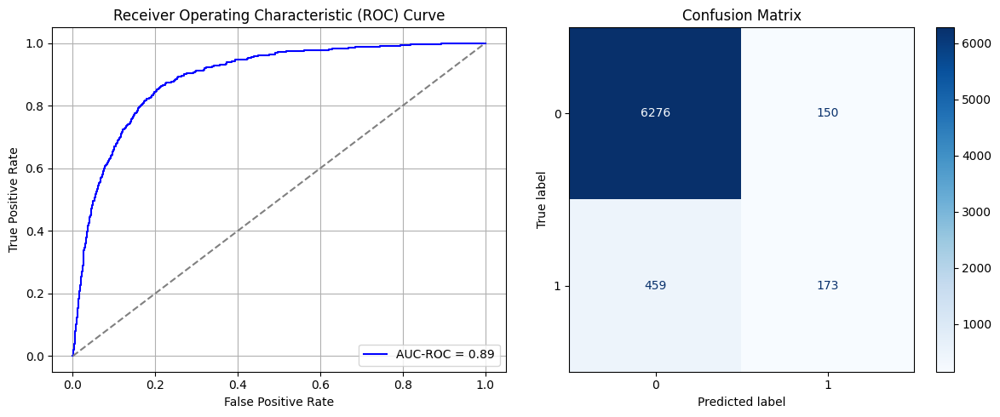

<ipython-input-38-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.7717514634132385
Time elapsed (performance): 46.95085247499992


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6847 - loss: 0.4678 - val_AUC: 0.6745 - val_loss: 0.4468
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6866 - loss: 0.4378 - val_AUC: 0.6800 - val_loss: 0.4423
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6966 - loss: 0.4393 - val_AUC: 0.6859 - val_loss: 0.4373
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7049 - loss: 0.4206 - val_AUC: 0.6923 - val_loss: 0.4386
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7069 - loss: 0.4379 - val_AUC: 0.6952 - val_loss: 0.4339
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7361 - loss: 0.4081 - val_AUC: 0.7024 - val_loss: 0.4315
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7138 - loss: 0.4338 - val_AUC: 0.7041 - val_loss: 0.4316
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7149 - loss: 0.4301 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.6855 - loss: 0.4612 - val_AUC: 0.6730 - val_loss: 0.4468
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7056 - loss: 0.4300 - val_AUC: 0.6823 - val_loss: 0.4398
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7156 - loss: 0.4350 - val_AUC: 0.6884 - val_loss: 0.4364
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7193 - loss: 0.4315 - val_AUC: 0.6940 - val_loss: 0.4341
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7118 - loss: 0.4360 - val_AUC: 0.6982 - val_loss: 0.4327
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7110 - loss: 0.4337 - val_AUC: 0.7040 - val_loss: 0.4309
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7284 - loss: 0.4216 - val_AUC: 0.7106 - val_loss: 0.4299
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7362 - loss: 0.4227 - val_AUC: 0.7153 - val_loss: 0.4293
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7219

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - AUC: 0.6792 - loss: 0.4733 - val_AUC: 0.6733 - val_loss: 0.4475
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6966 - loss: 0.4280 - val_AUC: 0.6779 - val_loss: 0.4420
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6971 - loss: 0.4324 - val_AUC: 0.6843 - val_loss: 0.4405
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7133 - loss: 0.4254 - val_AUC: 0.6899 - val_loss: 0.4363
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6956 - loss: 0.4469 - val_AUC: 0.6946 - val_loss: 0.4338
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7177 - loss: 0.4378 - val_AUC: 0.6978 - val_loss: 0.4367
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7018 - loss: 0.4363 - val_AUC: 0.7024 - val_loss: 0.4313
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7046 - loss: 0.4252 - val_AUC: 0.7085 - val_loss: 0.4291
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7257 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - AUC: 0.6812 - loss: 0.4616 - val_AUC: 0.6733 - val_loss: 0.4494
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7003 - loss: 0.4366 - val_AUC: 0.6786 - val_loss: 0.4405
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7087 - loss: 0.4292 - val_AUC: 0.6837 - val_loss: 0.4381
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7002 - loss: 0.4475 - val_AUC: 0.6873 - val_loss: 0.4374
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7057 - loss: 0.4378 - val_AUC: 0.6920 - val_loss: 0.4350
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7064 - loss: 0.4204 - val_AUC: 0.6980 - val_loss: 0.4332
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6979 - loss: 0.4368 - val_AUC: 0.6991 - val_loss: 0.4333
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7103 - loss: 0.4236 - val_AUC: 0.7067 - val_loss: 0.4339
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7250 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6996 - loss: 0.4585 - val_AUC: 0.6728 - val_loss: 0.4475
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7077 - loss: 0.4342 - val_AUC: 0.6778 - val_loss: 0.4407
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6881 - loss: 0.4448 - val_AUC: 0.6845 - val_loss: 0.4381
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7145 - loss: 0.4410 - val_AUC: 0.6898 - val_loss: 0.4356
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7128 - loss: 0.4281 - val_AUC: 0.6936 - val_loss: 0.4342
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.4384 - val_AUC: 0.6994 - val_loss: 0.4324
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7246 - loss: 0.4218 - val_AUC: 0.7037 - val_loss: 0.4305
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7092 - loss: 0.4305 - val_AUC: 0.7064 - val_loss: 0.4294
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7179 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.7006 - loss: 0.4605 - val_AUC: 0.6729 - val_loss: 0.4468
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6732 - loss: 0.4577 - val_AUC: 0.6790 - val_loss: 0.4403
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7043 - loss: 0.4373 - val_AUC: 0.6856 - val_loss: 0.4375
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7015 - loss: 0.4420 - val_AUC: 0.6900 - val_loss: 0.4364
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6926 - loss: 0.4356 - val_AUC: 0.6942 - val_loss: 0.4340
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7143 - loss: 0.4159 - val_AUC: 0.7005 - val_loss: 0.4330
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7299 - loss: 0.4231 - val_AUC: 0.7058 - val_loss: 0.4308
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7196 - loss: 0.4150 - val_AUC: 0.7075 - val_loss: 0.4293
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7225 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - AUC: 0.6874 - loss: 0.4747 - val_AUC: 0.6734 - val_loss: 0.4471
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6967 - loss: 0.4393 - val_AUC: 0.6798 - val_loss: 0.4414
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6923 - loss: 0.4395 - val_AUC: 0.6851 - val_loss: 0.4388
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.4294 - val_AUC: 0.6911 - val_loss: 0.4351
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7142 - loss: 0.4341 - val_AUC: 0.6938 - val_loss: 0.4345
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7097 - loss: 0.4369 - val_AUC: 0.6998 - val_loss: 0.4320
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7248 - loss: 0.4238 - val_AUC: 0.7048 - val_loss: 0.4301
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.4220 - val_AUC: 0.7109 - val_loss: 0.4296
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - AUC: 0.7021 - loss: 0.4454 - val_AUC: 0.6740 - val_loss: 0.4460
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6855 - loss: 0.4413 - val_AUC: 0.6808 - val_loss: 0.4398
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7073 - loss: 0.4314 - val_AUC: 0.6856 - val_loss: 0.4400
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7100 - loss: 0.4184 - val_AUC: 0.6908 - val_loss: 0.4355
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7141 - loss: 0.4295 - val_AUC: 0.6978 - val_loss: 0.4333
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7082 - loss: 0.4342 - val_AUC: 0.7041 - val_loss: 0.4321
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7041 - loss: 0.4355 - val_AUC: 0.7026 - val_loss: 0.4339
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.4250 - val_AUC: 0.7059 - val_loss: 0.4312
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - AUC: 0.6898 - loss: 0.4601 - val_AUC: 0.6729 - val_loss: 0.4465
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6878 - loss: 0.4475 - val_AUC: 0.6797 - val_loss: 0.4403
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7057 - loss: 0.4421 - val_AUC: 0.6853 - val_loss: 0.4376
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7119 - loss: 0.4267 - val_AUC: 0.6911 - val_loss: 0.4358
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7210 - loss: 0.4256 - val_AUC: 0.6959 - val_loss: 0.4334
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7016 - loss: 0.4420 - val_AUC: 0.6984 - val_loss: 0.4329
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - AUC: 0.7297 - loss: 0.4146 - val_AUC: 0.7094 - val_loss: 0.4340
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7218 - loss: 0.4249 - val_AUC: 0.7079 - val_loss: 0.4292
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7426

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - AUC: 0.6937 - loss: 0.4652 - val_AUC: 0.6741 - val_loss: 0.4465
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6966 - loss: 0.4315 - val_AUC: 0.6805 - val_loss: 0.4411
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6924 - loss: 0.4431 - val_AUC: 0.6860 - val_loss: 0.4371
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7005 - loss: 0.4213 - val_AUC: 0.6909 - val_loss: 0.4350
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7115 - loss: 0.4268 - val_AUC: 0.6948 - val_loss: 0.4349
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7153 - loss: 0.4254 - val_AUC: 0.7019 - val_loss: 0.4324
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7120 - loss: 0.4183 - val_AUC: 0.7071 - val_loss: 0.4345
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7224 - loss: 0.4415 - val_AUC: 0.7045 - val_loss: 0.4321
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7343

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - AUC: 0.6921 - loss: 0.4512 - val_AUC: 0.6730 - val_loss: 0.4480
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6992 - loss: 0.4352 - val_AUC: 0.6808 - val_loss: 0.4402
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7029 - loss: 0.4263 - val_AUC: 0.6872 - val_loss: 0.4371
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7263 - loss: 0.4240 - val_AUC: 0.6916 - val_loss: 0.4358
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7078 - loss: 0.4340 - val_AUC: 0.6960 - val_loss: 0.4334
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.4381 - val_AUC: 0.7009 - val_loss: 0.4322
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7290 - loss: 0.4218 - val_AUC: 0.7100 - val_loss: 0.4331
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.4270 - val_AUC: 0.7097 - val_loss: 0.4285
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6970 - loss: 0.4483 - val_AUC: 0.6729 - val_loss: 0.4463
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6892 - loss: 0.4364 - val_AUC: 0.6794 - val_loss: 0.4409
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6985 - loss: 0.4245 - val_AUC: 0.6867 - val_loss: 0.4377
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7086 - loss: 0.4420 - val_AUC: 0.6928 - val_loss: 0.4344
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7089 - loss: 0.4277 - val_AUC: 0.6977 - val_loss: 0.4327
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7003 - loss: 0.4358 - val_AUC: 0.7005 - val_loss: 0.4320
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.4315 - val_AUC: 0.7044 - val_loss: 0.4303
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7134 - loss: 0.4322 - val_AUC: 0.7069 - val_loss: 0.4308
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7215 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - AUC: 0.6751 - loss: 0.4786 - val_AUC: 0.6727 - val_loss: 0.4487
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6947 - loss: 0.4385 - val_AUC: 0.6788 - val_loss: 0.4410
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7031 - loss: 0.4414 - val_AUC: 0.6826 - val_loss: 0.4396
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7164 - loss: 0.4316 - val_AUC: 0.6893 - val_loss: 0.4361
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.4299 - val_AUC: 0.6946 - val_loss: 0.4339
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7293 - loss: 0.4242 - val_AUC: 0.6980 - val_loss: 0.4335
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7161 - loss: 0.4261 - val_AUC: 0.7046 - val_loss: 0.4306
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7191 - loss: 0.4286 - val_AUC: 0.7055 - val_loss: 0.4305
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - AUC: 0.6953 - loss: 0.4623 - val_AUC: 0.6728 - val_loss: 0.4469
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7051 - loss: 0.4253 - val_AUC: 0.6802 - val_loss: 0.4399
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7022 - loss: 0.4347 - val_AUC: 0.6855 - val_loss: 0.4394
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7041 - loss: 0.4165 - val_AUC: 0.6927 - val_loss: 0.4367
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7057 - loss: 0.4222 - val_AUC: 0.6981 - val_loss: 0.4332
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7109 - loss: 0.4293 - val_AUC: 0.7002 - val_loss: 0.4318
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7107 - loss: 0.4435 - val_AUC: 0.7044 - val_loss: 0.4312
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.4186 - val_AUC: 0.7096 - val_loss: 0.4284
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6725 - loss: 0.4740 - val_AUC: 0.6723 - val_loss: 0.4494
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6950 - loss: 0.4319 - val_AUC: 0.6779 - val_loss: 0.4414
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6887 - loss: 0.4353 - val_AUC: 0.6828 - val_loss: 0.4393
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7108 - loss: 0.4267 - val_AUC: 0.6894 - val_loss: 0.4360
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7072 - loss: 0.4289 - val_AUC: 0.6938 - val_loss: 0.4339
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7015 - loss: 0.4423 - val_AUC: 0.7006 - val_loss: 0.4344
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7071 - loss: 0.4345 - val_AUC: 0.7014 - val_loss: 0.4329
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.4262 - val_AUC: 0.7056 - val_loss: 0.4297
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7213 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6983 - loss: 0.4535 - val_AUC: 0.6734 - val_loss: 0.4488
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6913 - loss: 0.4332 - val_AUC: 0.6799 - val_loss: 0.4407
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6933 - loss: 0.4386 - val_AUC: 0.6848 - val_loss: 0.4382
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7110 - loss: 0.4345 - val_AUC: 0.6910 - val_loss: 0.4351
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7060 - loss: 0.4206 - val_AUC: 0.6950 - val_loss: 0.4335
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7030 - loss: 0.4318 - val_AUC: 0.6990 - val_loss: 0.4331
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7209 - loss: 0.4251 - val_AUC: 0.7038 - val_loss: 0.4305
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7030 - loss: 0.4319 - val_AUC: 0.7077 - val_loss: 0.4294
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7208 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6756 - loss: 0.4715 - val_AUC: 0.6725 - val_loss: 0.4482
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6746 - loss: 0.4453 - val_AUC: 0.6784 - val_loss: 0.4424
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7014 - loss: 0.4224 - val_AUC: 0.6834 - val_loss: 0.4384
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7066 - loss: 0.4319 - val_AUC: 0.6889 - val_loss: 0.4364
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6887 - loss: 0.4348 - val_AUC: 0.6934 - val_loss: 0.4380
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7139 - loss: 0.4362 - val_AUC: 0.7000 - val_loss: 0.4318
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7179 - loss: 0.4194 - val_AUC: 0.7049 - val_loss: 0.4304
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.4280 - val_AUC: 0.7067 - val_loss: 0.4297
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7139 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - AUC: 0.6867 - loss: 0.4508 - val_AUC: 0.6738 - val_loss: 0.4467
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7080 - loss: 0.4326 - val_AUC: 0.6811 - val_loss: 0.4398
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6906 - loss: 0.4336 - val_AUC: 0.6853 - val_loss: 0.4383
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6990 - loss: 0.4461 - val_AUC: 0.6909 - val_loss: 0.4361
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.4293 - val_AUC: 0.6945 - val_loss: 0.4338
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7123 - loss: 0.4474 - val_AUC: 0.7006 - val_loss: 0.4318
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.4341 - val_AUC: 0.7036 - val_loss: 0.4313
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.4141 - val_AUC: 0.7102 - val_loss: 0.4304
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6870 - loss: 0.4581 - val_AUC: 0.6734 - val_loss: 0.4468
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6893 - loss: 0.4420 - val_AUC: 0.6794 - val_loss: 0.4406
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7049 - loss: 0.4272 - val_AUC: 0.6838 - val_loss: 0.4382
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7010 - loss: 0.4377 - val_AUC: 0.6897 - val_loss: 0.4357
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.4087 - val_AUC: 0.6953 - val_loss: 0.4341
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.4296 - val_AUC: 0.6997 - val_loss: 0.4330
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7246 - loss: 0.4097 - val_AUC: 0.7049 - val_loss: 0.4317
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.4284 - val_AUC: 0.7057 - val_loss: 0.4306
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7288 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6899 - loss: 0.4560 - val_AUC: 0.6734 - val_loss: 0.4461
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6703 - loss: 0.4403 - val_AUC: 0.6798 - val_loss: 0.4426
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.4240 - val_AUC: 0.6873 - val_loss: 0.4375
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7019 - loss: 0.4140 - val_AUC: 0.6925 - val_loss: 0.4345
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7211 - loss: 0.4275 - val_AUC: 0.6977 - val_loss: 0.4327
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6936 - loss: 0.4364 - val_AUC: 0.7019 - val_loss: 0.4313
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7110 - loss: 0.4347 - val_AUC: 0.7065 - val_loss: 0.4295
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7317 - loss: 0.4199 - val_AUC: 0.7088 - val_loss: 0.4302
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7237 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.6370 - loss: 0.3352 - val_AUC: 0.8785 - val_loss: 0.2179
Epoch 2/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8774 - loss: 0.2112 - val_AUC: 0.8887 - val_loss: 0.2110
Epoch 3/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8926 - loss: 0.2052 - val_AUC: 0.8890 - val_loss: 0.2106
Epoch 4/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8913 - loss: 0.2035 - val_AUC: 0.8894 - val_loss: 0.2103
Epoch 5/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8892 - loss: 0.2105 - val_AUC: 0.8890 - val_loss: 0.2199
Epoch 6/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9031 - loss: 0.2000 - val_AUC: 0.8954 - val_loss: 0.2060
Epoch 7/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9002 - loss: 0.1994 - val_AUC: 0.8943 - val_loss: 0.2067
Epoch 8/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9038 - loss: 0.1961 - val_AUC: 0.8925 - val_loss: 0.2176
Epoch 9/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

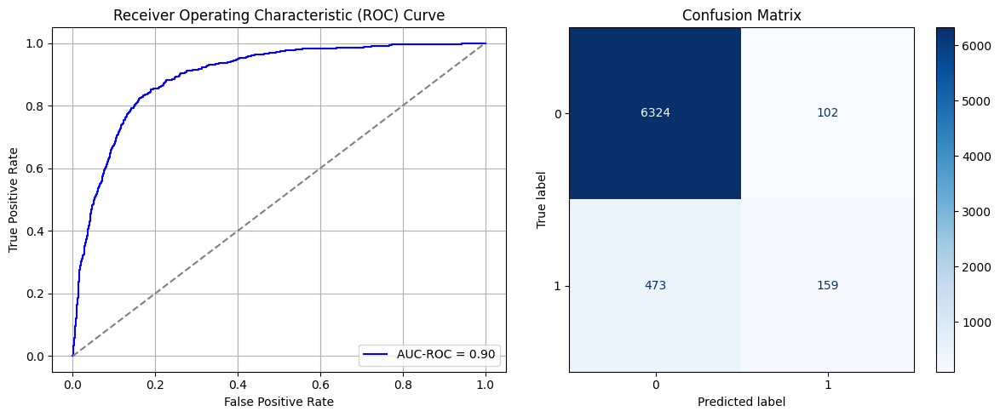

<ipython-input-38-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.7085245251655579
Time elapsed (performance): 37.05630089400029


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.7415 - loss: 0.4426 - val_AUC: 0.7127 - val_loss: 0.4310
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.4241 - val_AUC: 0.7180 - val_loss: 0.4261
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4174 - val_AUC: 0.7212 - val_loss: 0.4242
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7455 - loss: 0.4075 - val_AUC: 0.7251 - val_loss: 0.4221
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.4045 - val_AUC: 0.7275 - val_loss: 0.4205
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7506 - loss: 0.4201 - val_AUC: 0.7291 - val_loss: 0.4215
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7589 - loss: 0.4091 - val_AUC: 0.7316 - val_loss: 0.4181
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7551 - loss: 0.4032 - val_AUC: 0.7325 - val_loss: 0.4184
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7580 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - AUC: 0.7270 - loss: 0.4709 - val_AUC: 0.7133 - val_loss: 0.4316
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7315 - loss: 0.4292 - val_AUC: 0.7182 - val_loss: 0.4272
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7501 - loss: 0.4163 - val_AUC: 0.7212 - val_loss: 0.4248
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7477 - loss: 0.4169 - val_AUC: 0.7246 - val_loss: 0.4227
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7647 - loss: 0.4027 - val_AUC: 0.7274 - val_loss: 0.4209
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7807 - loss: 0.4043 - val_AUC: 0.7292 - val_loss: 0.4193
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7606 - loss: 0.4133 - val_AUC: 0.7312 - val_loss: 0.4180
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7482 - loss: 0.4232 - val_AUC: 0.7323 - val_loss: 0.4198
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7532 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - AUC: 0.7226 - loss: 0.4676 - val_AUC: 0.7129 - val_loss: 0.4310
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.4157 - val_AUC: 0.7177 - val_loss: 0.4266
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.4156 - val_AUC: 0.7217 - val_loss: 0.4245
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.4085 - val_AUC: 0.7246 - val_loss: 0.4226
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7552 - loss: 0.4127 - val_AUC: 0.7274 - val_loss: 0.4216
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7577 - loss: 0.4148 - val_AUC: 0.7290 - val_loss: 0.4235
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7647 - loss: 0.3993 - val_AUC: 0.7304 - val_loss: 0.4196
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7604 - loss: 0.4042 - val_AUC: 0.7321 - val_loss: 0.4188
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7618 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.7132 - loss: 0.4873 - val_AUC: 0.7124 - val_loss: 0.4309
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7524 - loss: 0.4194 - val_AUC: 0.7182 - val_loss: 0.4270
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7363 - loss: 0.4191 - val_AUC: 0.7213 - val_loss: 0.4244
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7443 - loss: 0.4320 - val_AUC: 0.7239 - val_loss: 0.4249
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7567 - loss: 0.4152 - val_AUC: 0.7269 - val_loss: 0.4210
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7570 - loss: 0.4158 - val_AUC: 0.7286 - val_loss: 0.4210
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7657 - loss: 0.4123 - val_AUC: 0.7305 - val_loss: 0.4210
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7730 - loss: 0.4077 - val_AUC: 0.7318 - val_loss: 0.4184
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7654 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - AUC: 0.7109 - loss: 0.4782 - val_AUC: 0.7127 - val_loss: 0.4311
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7444 - loss: 0.4145 - val_AUC: 0.7174 - val_loss: 0.4275
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7427 - loss: 0.4170 - val_AUC: 0.7217 - val_loss: 0.4243
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7599 - loss: 0.4073 - val_AUC: 0.7250 - val_loss: 0.4223
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7733 - loss: 0.4030 - val_AUC: 0.7274 - val_loss: 0.4207
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7445 - loss: 0.4101 - val_AUC: 0.7296 - val_loss: 0.4196
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7605 - loss: 0.4075 - val_AUC: 0.7312 - val_loss: 0.4189
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 - loss: 0.4074 - val_AUC: 0.7307 - val_loss: 0.4196
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7656 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7281 - loss: 0.4974 - val_AUC: 0.7123 - val_loss: 0.4309
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7381 - loss: 0.4129 - val_AUC: 0.7173 - val_loss: 0.4268
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7512 - loss: 0.4180 - val_AUC: 0.7213 - val_loss: 0.4245
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 - loss: 0.4049 - val_AUC: 0.7243 - val_loss: 0.4226
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7501 - loss: 0.4222 - val_AUC: 0.7259 - val_loss: 0.4215
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7603 - loss: 0.4076 - val_AUC: 0.7287 - val_loss: 0.4204
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7673 - loss: 0.3917 - val_AUC: 0.7302 - val_loss: 0.4195
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7547 - loss: 0.4135 - val_AUC: 0.7309 - val_loss: 0.4245
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7550 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.7093 - loss: 0.5051 - val_AUC: 0.7126 - val_loss: 0.4308
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7463 - loss: 0.4090 - val_AUC: 0.7175 - val_loss: 0.4270
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7453 - loss: 0.4225 - val_AUC: 0.7213 - val_loss: 0.4252
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7472 - loss: 0.4150 - val_AUC: 0.7241 - val_loss: 0.4227
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7576 - loss: 0.4200 - val_AUC: 0.7267 - val_loss: 0.4213
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7636 - loss: 0.4061 - val_AUC: 0.7292 - val_loss: 0.4198
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7559 - loss: 0.4148 - val_AUC: 0.7311 - val_loss: 0.4190
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7526 - loss: 0.4115 - val_AUC: 0.7315 - val_loss: 0.4177
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.7305 - loss: 0.4686 - val_AUC: 0.7132 - val_loss: 0.4329
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7390 - loss: 0.4190 - val_AUC: 0.7182 - val_loss: 0.4268
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7489 - loss: 0.4160 - val_AUC: 0.7212 - val_loss: 0.4247
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7655 - loss: 0.4012 - val_AUC: 0.7250 - val_loss: 0.4224
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7417 - loss: 0.4163 - val_AUC: 0.7272 - val_loss: 0.4214
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 - loss: 0.4029 - val_AUC: 0.7293 - val_loss: 0.4197
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7487 - loss: 0.4260 - val_AUC: 0.7302 - val_loss: 0.4223
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7590 - loss: 0.3935 - val_AUC: 0.7315 - val_loss: 0.4188
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7656 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - AUC: 0.7207 - loss: 0.4797 - val_AUC: 0.7128 - val_loss: 0.4312
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7446 - loss: 0.4285 - val_AUC: 0.7181 - val_loss: 0.4281
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7419 - loss: 0.4238 - val_AUC: 0.7214 - val_loss: 0.4236
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7585 - loss: 0.4138 - val_AUC: 0.7254 - val_loss: 0.4218
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7696 - loss: 0.4033 - val_AUC: 0.7277 - val_loss: 0.4201
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7662 - loss: 0.4067 - val_AUC: 0.7302 - val_loss: 0.4189
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7717 - loss: 0.3919 - val_AUC: 0.7322 - val_loss: 0.4184
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7564 - loss: 0.4030 - val_AUC: 0.7327 - val_loss: 0.4180
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7603 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - AUC: 0.7229 - loss: 0.4799 - val_AUC: 0.7133 - val_loss: 0.4339
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7318 - loss: 0.4355 - val_AUC: 0.7183 - val_loss: 0.4300
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7508 - loss: 0.4044 - val_AUC: 0.7214 - val_loss: 0.4241
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7452 - loss: 0.4158 - val_AUC: 0.7249 - val_loss: 0.4230
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.4194 - val_AUC: 0.7277 - val_loss: 0.4212
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7441 - loss: 0.4136 - val_AUC: 0.7287 - val_loss: 0.4208
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7615 - loss: 0.4159 - val_AUC: 0.7308 - val_loss: 0.4192
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7483 - loss: 0.4152 - val_AUC: 0.7321 - val_loss: 0.4183
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7680 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.7382 - loss: 0.4509 - val_AUC: 0.7135 - val_loss: 0.4307
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7346 - loss: 0.4190 - val_AUC: 0.7181 - val_loss: 0.4279
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7489 - loss: 0.4161 - val_AUC: 0.7216 - val_loss: 0.4246
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7517 - loss: 0.4162 - val_AUC: 0.7247 - val_loss: 0.4232
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7433 - loss: 0.4044 - val_AUC: 0.7269 - val_loss: 0.4215
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7574 - loss: 0.3997 - val_AUC: 0.7290 - val_loss: 0.4200
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7646 - loss: 0.4019 - val_AUC: 0.7307 - val_loss: 0.4187
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7570 - loss: 0.4220 - val_AUC: 0.7308 - val_loss: 0.4223
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7542 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.7294 - loss: 0.4687 - val_AUC: 0.7127 - val_loss: 0.4307
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7512 - loss: 0.4190 - val_AUC: 0.7178 - val_loss: 0.4286
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7646 - loss: 0.3884 - val_AUC: 0.7215 - val_loss: 0.4240
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7590 - loss: 0.4043 - val_AUC: 0.7249 - val_loss: 0.4223
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7499 - loss: 0.4096 - val_AUC: 0.7270 - val_loss: 0.4209
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7662 - loss: 0.3922 - val_AUC: 0.7292 - val_loss: 0.4199
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7659 - loss: 0.4089 - val_AUC: 0.7308 - val_loss: 0.4189
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7630 - loss: 0.3990 - val_AUC: 0.7318 - val_loss: 0.4185
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.7241 - loss: 0.4714 - val_AUC: 0.7136 - val_loss: 0.4326
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.4272 - val_AUC: 0.7176 - val_loss: 0.4275
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.4172 - val_AUC: 0.7212 - val_loss: 0.4244
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7530 - loss: 0.4154 - val_AUC: 0.7249 - val_loss: 0.4221
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7481 - loss: 0.4167 - val_AUC: 0.7271 - val_loss: 0.4208
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7649 - loss: 0.4086 - val_AUC: 0.7292 - val_loss: 0.4198
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7511 - loss: 0.4170 - val_AUC: 0.7307 - val_loss: 0.4194
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7487 - loss: 0.4166 - val_AUC: 0.7317 - val_loss: 0.4184
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7554 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.7298 - loss: 0.4420 - val_AUC: 0.7130 - val_loss: 0.4305
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7557 - loss: 0.4185 - val_AUC: 0.7183 - val_loss: 0.4265
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.4159 - val_AUC: 0.7214 - val_loss: 0.4239
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7442 - loss: 0.4159 - val_AUC: 0.7252 - val_loss: 0.4220
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.4049 - val_AUC: 0.7268 - val_loss: 0.4214
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7759 - loss: 0.4013 - val_AUC: 0.7299 - val_loss: 0.4194
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7423 - loss: 0.4246 - val_AUC: 0.7307 - val_loss: 0.4186
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7730 - loss: 0.3893 - val_AUC: 0.7316 - val_loss: 0.4186
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7494 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.7428 - loss: 0.4440 - val_AUC: 0.7129 - val_loss: 0.4310
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7619 - loss: 0.4090 - val_AUC: 0.7176 - val_loss: 0.4271
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7465 - loss: 0.4188 - val_AUC: 0.7216 - val_loss: 0.4242
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7470 - loss: 0.4133 - val_AUC: 0.7245 - val_loss: 0.4245
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7637 - loss: 0.3971 - val_AUC: 0.7270 - val_loss: 0.4210
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 - loss: 0.4179 - val_AUC: 0.7292 - val_loss: 0.4200
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7430 - loss: 0.4141 - val_AUC: 0.7309 - val_loss: 0.4189
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.4085 - val_AUC: 0.7320 - val_loss: 0.4180
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7630 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.7127 - loss: 0.4925 - val_AUC: 0.7137 - val_loss: 0.4310
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7423 - loss: 0.4207 - val_AUC: 0.7185 - val_loss: 0.4270
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7475 - loss: 0.4166 - val_AUC: 0.7220 - val_loss: 0.4240
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7389 - loss: 0.4329 - val_AUC: 0.7252 - val_loss: 0.4224
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7557 - loss: 0.4132 - val_AUC: 0.7269 - val_loss: 0.4217
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.4126 - val_AUC: 0.7293 - val_loss: 0.4203
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7678 - loss: 0.4038 - val_AUC: 0.7312 - val_loss: 0.4184
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7712 - loss: 0.3931 - val_AUC: 0.7325 - val_loss: 0.4181
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7570 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7383 - loss: 0.4401 - val_AUC: 0.7130 - val_loss: 0.4307
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.4239 - val_AUC: 0.7183 - val_loss: 0.4266
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7386 - loss: 0.4153 - val_AUC: 0.7211 - val_loss: 0.4248
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7705 - loss: 0.4001 - val_AUC: 0.7248 - val_loss: 0.4237
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7525 - loss: 0.4180 - val_AUC: 0.7271 - val_loss: 0.4216
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7386 - loss: 0.3995 - val_AUC: 0.7302 - val_loss: 0.4207
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7519 - loss: 0.4113 - val_AUC: 0.7306 - val_loss: 0.4191
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4078 - val_AUC: 0.7319 - val_loss: 0.4185
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7630 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7155 - loss: 0.4898 - val_AUC: 0.7125 - val_loss: 0.4312
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.4240 - val_AUC: 0.7179 - val_loss: 0.4286
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7519 - loss: 0.4195 - val_AUC: 0.7208 - val_loss: 0.4271
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7501 - loss: 0.4092 - val_AUC: 0.7242 - val_loss: 0.4227
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7481 - loss: 0.4161 - val_AUC: 0.7275 - val_loss: 0.4209
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7515 - loss: 0.4228 - val_AUC: 0.7292 - val_loss: 0.4207
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7542 - loss: 0.4168 - val_AUC: 0.7313 - val_loss: 0.4190
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7772 - loss: 0.3976 - val_AUC: 0.7318 - val_loss: 0.4185
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7751 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.7280 - loss: 0.4647 - val_AUC: 0.7123 - val_loss: 0.4309
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7607 - loss: 0.4026 - val_AUC: 0.7177 - val_loss: 0.4268
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7529 - loss: 0.4093 - val_AUC: 0.7218 - val_loss: 0.4242
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7538 - loss: 0.4089 - val_AUC: 0.7245 - val_loss: 0.4224
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7575 - loss: 0.3992 - val_AUC: 0.7274 - val_loss: 0.4209
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7708 - loss: 0.4057 - val_AUC: 0.7287 - val_loss: 0.4214
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7567 - loss: 0.4117 - val_AUC: 0.7310 - val_loss: 0.4191
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7721 - loss: 0.4034 - val_AUC: 0.7312 - val_loss: 0.4188
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7660 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6993 - loss: 0.4977 - val_AUC: 0.7133 - val_loss: 0.4332
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7391 - loss: 0.4244 - val_AUC: 0.7178 - val_loss: 0.4280
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7415 - loss: 0.4274 - val_AUC: 0.7210 - val_loss: 0.4266
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7536 - loss: 0.4085 - val_AUC: 0.7242 - val_loss: 0.4232
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7589 - loss: 0.3966 - val_AUC: 0.7266 - val_loss: 0.4220
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7528 - loss: 0.4095 - val_AUC: 0.7289 - val_loss: 0.4201
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7518 - loss: 0.4104 - val_AUC: 0.7311 - val_loss: 0.4193
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7548 - loss: 0.4146 - val_AUC: 0.7316 - val_loss: 0.4182
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7591 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.6719 - loss: 0.3172 - val_AUC: 0.8856 - val_loss: 0.2468
Epoch 2/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8783 - loss: 0.2073 - val_AUC: 0.8932 - val_loss: 0.2092
Epoch 3/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8896 - loss: 0.2038 - val_AUC: 0.8916 - val_loss: 0.2127
Epoch 4/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8954 - loss: 0.2026 - val_AUC: 0.8950 - val_loss: 0.2070
Epoch 5/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9020 - loss: 0.1945 - val_AUC: 0.9007 - val_loss: 0.2016
Epoch 6/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - AUC: 0.9107 - loss: 0.1956 - val_AUC: 0.9035 - val_loss: 0.2008
Epoch 7/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9115 - loss: 0.1915 - val_AUC: 0.8976 - val_loss: 0.2217
Epoch 8/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.9119 - loss: 0.1911 - val_AUC: 0.9063 - val_loss: 0.1985
Epoch 9/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

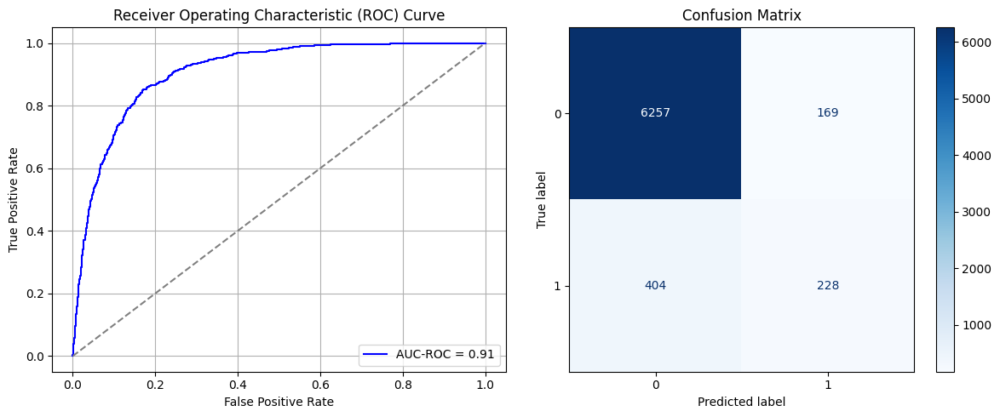

Best threshold based on F1-score: 0.28208720684051514
Time elapsed (performance): 46.83955878799998


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - AUC: 0.6846 - loss: 0.4659 - val_AUC: 0.6431 - val_loss: 0.4566
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6847 - loss: 0.4388 - val_AUC: 0.6644 - val_loss: 0.4441
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7010 - loss: 0.4308 - val_AUC: 0.6868 - val_loss: 0.4356
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7140 - loss: 0.4328 - val_AUC: 0.7005 - val_loss: 0.4321
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7122 - loss: 0.4331 - val_AUC: 0.7107 - val_loss: 0.4274
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7372 - loss: 0.4221 - val_AUC: 0.7173 - val_loss: 0.4247
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7469 - loss: 0.4123 - val_AUC: 0.7210 - val_loss: 0.4226
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.4244 - val_AUC: 0.7245 - val_loss: 0.4208
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.6688 - loss: 0.4801 - val_AUC: 0.6434 - val_loss: 0.4547
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6753 - loss: 0.4389 - val_AUC: 0.6697 - val_loss: 0.4414
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7090 - loss: 0.4346 - val_AUC: 0.6961 - val_loss: 0.4330
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.4247 - val_AUC: 0.7063 - val_loss: 0.4290
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7151 - loss: 0.4378 - val_AUC: 0.7162 - val_loss: 0.4264
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.4283 - val_AUC: 0.7197 - val_loss: 0.4232
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.4243 - val_AUC: 0.7293 - val_loss: 0.4197
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7489 - loss: 0.4219 - val_AUC: 0.7295 - val_loss: 0.4190
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7426 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - AUC: 0.6663 - loss: 0.4975 - val_AUC: 0.6412 - val_loss: 0.4588
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6735 - loss: 0.4579 - val_AUC: 0.6640 - val_loss: 0.4434
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7065 - loss: 0.4478 - val_AUC: 0.6896 - val_loss: 0.4362
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7134 - loss: 0.4362 - val_AUC: 0.6992 - val_loss: 0.4320
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7254 - loss: 0.4317 - val_AUC: 0.7034 - val_loss: 0.4324
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.4322 - val_AUC: 0.7154 - val_loss: 0.4252
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7364 - loss: 0.4273 - val_AUC: 0.7198 - val_loss: 0.4231
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7672 - loss: 0.3921 - val_AUC: 0.7257 - val_loss: 0.4214
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7554 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - AUC: 0.6435 - loss: 0.5074 - val_AUC: 0.6418 - val_loss: 0.4579
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6826 - loss: 0.4371 - val_AUC: 0.6664 - val_loss: 0.4427
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.4244 - val_AUC: 0.6911 - val_loss: 0.4360
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7090 - loss: 0.4310 - val_AUC: 0.7063 - val_loss: 0.4288
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7424 - loss: 0.4098 - val_AUC: 0.7154 - val_loss: 0.4265
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7387 - loss: 0.4239 - val_AUC: 0.7192 - val_loss: 0.4234
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7369 - loss: 0.4184 - val_AUC: 0.7250 - val_loss: 0.4217
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7548 - loss: 0.3994 - val_AUC: 0.7291 - val_loss: 0.4210
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7582 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6669 - loss: 0.4759 - val_AUC: 0.6432 - val_loss: 0.4555
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6850 - loss: 0.4388 - val_AUC: 0.6645 - val_loss: 0.4430
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.4335 - val_AUC: 0.6885 - val_loss: 0.4363
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7260 - loss: 0.4264 - val_AUC: 0.7062 - val_loss: 0.4289
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7304 - loss: 0.4279 - val_AUC: 0.7097 - val_loss: 0.4285
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7369 - loss: 0.4217 - val_AUC: 0.7199 - val_loss: 0.4246
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7354 - loss: 0.4347 - val_AUC: 0.7160 - val_loss: 0.4263
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7518 - loss: 0.4083 - val_AUC: 0.7239 - val_loss: 0.4210
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6730 - loss: 0.4861 - val_AUC: 0.6447 - val_loss: 0.4532
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6842 - loss: 0.4450 - val_AUC: 0.6734 - val_loss: 0.4400
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.4290 - val_AUC: 0.6938 - val_loss: 0.4335
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.4235 - val_AUC: 0.7021 - val_loss: 0.4310
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7362 - loss: 0.4240 - val_AUC: 0.7181 - val_loss: 0.4246
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7396 - loss: 0.4119 - val_AUC: 0.7206 - val_loss: 0.4236
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.4306 - val_AUC: 0.7202 - val_loss: 0.4223
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7309 - loss: 0.4096 - val_AUC: 0.7258 - val_loss: 0.4211
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7450 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6750 - loss: 0.4690 - val_AUC: 0.6457 - val_loss: 0.4527
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6836 - loss: 0.4453 - val_AUC: 0.6756 - val_loss: 0.4407
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7122 - loss: 0.4278 - val_AUC: 0.6991 - val_loss: 0.4336
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7229 - loss: 0.4172 - val_AUC: 0.7090 - val_loss: 0.4292
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7252 - loss: 0.4253 - val_AUC: 0.7183 - val_loss: 0.4269
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7368 - loss: 0.4343 - val_AUC: 0.7194 - val_loss: 0.4241
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7386 - loss: 0.4206 - val_AUC: 0.7225 - val_loss: 0.4214
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7383 - loss: 0.4096 - val_AUC: 0.7231 - val_loss: 0.4212
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7509 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6632 - loss: 0.4862 - val_AUC: 0.6431 - val_loss: 0.4553
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6843 - loss: 0.4455 - val_AUC: 0.6613 - val_loss: 0.4439
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7020 - loss: 0.4269 - val_AUC: 0.6879 - val_loss: 0.4359
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.4331 - val_AUC: 0.7037 - val_loss: 0.4299
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.4222 - val_AUC: 0.7162 - val_loss: 0.4259
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.4141 - val_AUC: 0.7201 - val_loss: 0.4311
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7553 - loss: 0.4210 - val_AUC: 0.7201 - val_loss: 0.4227
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7469 - loss: 0.4170 - val_AUC: 0.7263 - val_loss: 0.4204
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7645 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6640 - loss: 0.4709 - val_AUC: 0.6438 - val_loss: 0.4539
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6922 - loss: 0.4415 - val_AUC: 0.6795 - val_loss: 0.4386
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.4173 - val_AUC: 0.7005 - val_loss: 0.4326
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7391 - loss: 0.4173 - val_AUC: 0.7091 - val_loss: 0.4277
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.4393 - val_AUC: 0.7150 - val_loss: 0.4264
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7363 - loss: 0.4235 - val_AUC: 0.7217 - val_loss: 0.4229
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7440 - loss: 0.4146 - val_AUC: 0.7242 - val_loss: 0.4208
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 - loss: 0.4178 - val_AUC: 0.7236 - val_loss: 0.4216
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7653 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.6589 - loss: 0.4839 - val_AUC: 0.6434 - val_loss: 0.4561
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6800 - loss: 0.4435 - val_AUC: 0.6719 - val_loss: 0.4410
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7052 - loss: 0.4421 - val_AUC: 0.7021 - val_loss: 0.4308
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.4187 - val_AUC: 0.7149 - val_loss: 0.4294
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7187 - loss: 0.4163 - val_AUC: 0.7130 - val_loss: 0.4257
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.4120 - val_AUC: 0.7248 - val_loss: 0.4250
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7485 - loss: 0.4106 - val_AUC: 0.7254 - val_loss: 0.4206
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7532 - loss: 0.4218 - val_AUC: 0.7294 - val_loss: 0.4205
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7386 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6635 - loss: 0.4913 - val_AUC: 0.6429 - val_loss: 0.4564
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7014 - loss: 0.4433 - val_AUC: 0.6664 - val_loss: 0.4419
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7017 - loss: 0.4476 - val_AUC: 0.6926 - val_loss: 0.4340
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.4261 - val_AUC: 0.7038 - val_loss: 0.4298
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7287 - loss: 0.4206 - val_AUC: 0.7120 - val_loss: 0.4266
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7494 - loss: 0.4134 - val_AUC: 0.7157 - val_loss: 0.4248
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7426 - loss: 0.4185 - val_AUC: 0.7250 - val_loss: 0.4224
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7373 - loss: 0.4150 - val_AUC: 0.7224 - val_loss: 0.4217
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7551 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6450 - loss: 0.5073 - val_AUC: 0.6423 - val_loss: 0.4590
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6965 - loss: 0.4319 - val_AUC: 0.6644 - val_loss: 0.4434
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6919 - loss: 0.4363 - val_AUC: 0.6859 - val_loss: 0.4354
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.4259 - val_AUC: 0.7026 - val_loss: 0.4300
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.4380 - val_AUC: 0.7084 - val_loss: 0.4284
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.4136 - val_AUC: 0.7151 - val_loss: 0.4259
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7544 - loss: 0.4047 - val_AUC: 0.7245 - val_loss: 0.4236
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.3990 - val_AUC: 0.7259 - val_loss: 0.4232
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7466 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6815 - loss: 0.4587 - val_AUC: 0.6440 - val_loss: 0.4540
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6954 - loss: 0.4428 - val_AUC: 0.6753 - val_loss: 0.4393
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.4420 - val_AUC: 0.6969 - val_loss: 0.4326
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7236 - loss: 0.4209 - val_AUC: 0.7047 - val_loss: 0.4300
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.4261 - val_AUC: 0.7164 - val_loss: 0.4260
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7595 - loss: 0.4114 - val_AUC: 0.7180 - val_loss: 0.4243
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7458 - loss: 0.4036 - val_AUC: 0.7231 - val_loss: 0.4214
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7421 - loss: 0.4012 - val_AUC: 0.7258 - val_loss: 0.4207
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7495 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6671 - loss: 0.4764 - val_AUC: 0.6462 - val_loss: 0.4527
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6805 - loss: 0.4454 - val_AUC: 0.6774 - val_loss: 0.4411
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.4318 - val_AUC: 0.7009 - val_loss: 0.4313
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.4337 - val_AUC: 0.7039 - val_loss: 0.4307
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7403 - loss: 0.4263 - val_AUC: 0.7185 - val_loss: 0.4247
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.4174 - val_AUC: 0.7239 - val_loss: 0.4227
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7474 - loss: 0.4195 - val_AUC: 0.7204 - val_loss: 0.4223
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4156 - val_AUC: 0.7209 - val_loss: 0.4218
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6743 - loss: 0.4793 - val_AUC: 0.6426 - val_loss: 0.4559
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6834 - loss: 0.4445 - val_AUC: 0.6684 - val_loss: 0.4419
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6992 - loss: 0.4443 - val_AUC: 0.6896 - val_loss: 0.4345
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7205 - loss: 0.4244 - val_AUC: 0.7012 - val_loss: 0.4306
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7252 - loss: 0.4147 - val_AUC: 0.7152 - val_loss: 0.4284
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7388 - loss: 0.4187 - val_AUC: 0.7195 - val_loss: 0.4239
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.4155 - val_AUC: 0.7233 - val_loss: 0.4220
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7510 - loss: 0.4088 - val_AUC: 0.7277 - val_loss: 0.4210
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6578 - loss: 0.4838 - val_AUC: 0.6452 - val_loss: 0.4559
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6744 - loss: 0.4549 - val_AUC: 0.6662 - val_loss: 0.4426
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7032 - loss: 0.4419 - val_AUC: 0.6885 - val_loss: 0.4351
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.4268 - val_AUC: 0.7038 - val_loss: 0.4347
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7333 - loss: 0.4252 - val_AUC: 0.7176 - val_loss: 0.4255
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7366 - loss: 0.4272 - val_AUC: 0.7181 - val_loss: 0.4242
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7293 - loss: 0.4092 - val_AUC: 0.7256 - val_loss: 0.4239
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7389 - loss: 0.4175 - val_AUC: 0.7273 - val_loss: 0.4197
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6791 - loss: 0.4787 - val_AUC: 0.6445 - val_loss: 0.4538
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6705 - loss: 0.4436 - val_AUC: 0.6674 - val_loss: 0.4418
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6933 - loss: 0.4402 - val_AUC: 0.6888 - val_loss: 0.4365
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.4384 - val_AUC: 0.7020 - val_loss: 0.4306
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.4336 - val_AUC: 0.7125 - val_loss: 0.4278
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7464 - loss: 0.4068 - val_AUC: 0.7162 - val_loss: 0.4248
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7474 - loss: 0.4104 - val_AUC: 0.7220 - val_loss: 0.4223
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.4240 - val_AUC: 0.7234 - val_loss: 0.4211
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7621 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6671 - loss: 0.4768 - val_AUC: 0.6449 - val_loss: 0.4531
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6787 - loss: 0.4533 - val_AUC: 0.6708 - val_loss: 0.4413
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6978 - loss: 0.4344 - val_AUC: 0.6896 - val_loss: 0.4361
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7351 - loss: 0.4200 - val_AUC: 0.7093 - val_loss: 0.4310
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.4169 - val_AUC: 0.7136 - val_loss: 0.4261
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7309 - loss: 0.4165 - val_AUC: 0.7205 - val_loss: 0.4247
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7454 - loss: 0.4293 - val_AUC: 0.7234 - val_loss: 0.4215
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7437 - loss: 0.4131 - val_AUC: 0.7245 - val_loss: 0.4205
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7555 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6623 - loss: 0.4863 - val_AUC: 0.6424 - val_loss: 0.4571
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6828 - loss: 0.4482 - val_AUC: 0.6673 - val_loss: 0.4423
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7117 - loss: 0.4252 - val_AUC: 0.6927 - val_loss: 0.4338
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.4281 - val_AUC: 0.7067 - val_loss: 0.4290
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7256 - loss: 0.4138 - val_AUC: 0.7142 - val_loss: 0.4263
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7444 - loss: 0.4019 - val_AUC: 0.7241 - val_loss: 0.4224
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7487 - loss: 0.4140 - val_AUC: 0.7220 - val_loss: 0.4214
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7509 - loss: 0.4209 - val_AUC: 0.7280 - val_loss: 0.4202
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6856 - loss: 0.4709 - val_AUC: 0.6428 - val_loss: 0.4559
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6871 - loss: 0.4357 - val_AUC: 0.6649 - val_loss: 0.4428
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7066 - loss: 0.4306 - val_AUC: 0.6890 - val_loss: 0.4372
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.4173 - val_AUC: 0.7049 - val_loss: 0.4299
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7429 - loss: 0.4083 - val_AUC: 0.7170 - val_loss: 0.4299
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7455 - loss: 0.4174 - val_AUC: 0.7201 - val_loss: 0.4240
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.4147 - val_AUC: 0.7183 - val_loss: 0.4245
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7366 - loss: 0.4178 - val_AUC: 0.7212 - val_loss: 0.4225
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7630 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.6514 - loss: 0.3189 - val_AUC: 0.8811 - val_loss: 0.2179
Epoch 2/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - AUC: 0.8848 - loss: 0.2079 - val_AUC: 0.8893 - val_loss: 0.2137
Epoch 3/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8858 - loss: 0.2097 - val_AUC: 0.8887 - val_loss: 0.2102
Epoch 4/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8936 - loss: 0.2078 - val_AUC: 0.8966 - val_loss: 0.2097
Epoch 5/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9023 - loss: 0.1958 - val_AUC: 0.8943 - val_loss: 0.2072
Epoch 6/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9079 - loss: 0.1988 - val_AUC: 0.8941 - val_loss: 0.2146
Epoch 7/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9094 - loss: 0.1867 - val_AUC: 0.8968 - val_loss: 0.2094
Epoch 8/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9095 - loss: 0.1941 - val_AUC: 0.9012 - val_loss: 0.2061
Epoch 9/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

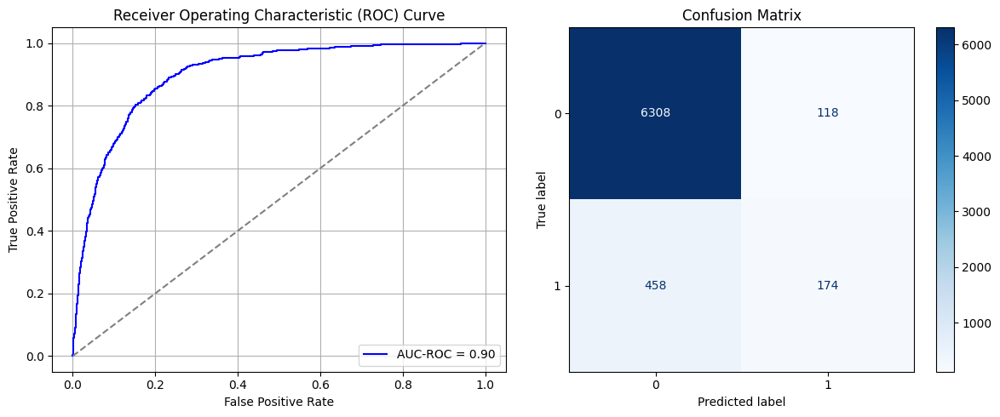

Best threshold based on F1-score: 0.21973885595798492
Time elapsed (performance): 41.95883428699972


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.6927 - loss: 0.4858 - val_AUC: 0.6890 - val_loss: 0.4394
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.4226 - val_AUC: 0.7029 - val_loss: 0.4304
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.4111 - val_AUC: 0.7089 - val_loss: 0.4276
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7480 - loss: 0.4048 - val_AUC: 0.7130 - val_loss: 0.4260
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7392 - loss: 0.4206 - val_AUC: 0.7146 - val_loss: 0.4248
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.4113 - val_AUC: 0.7170 - val_loss: 0.4235
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.4130 - val_AUC: 0.7201 - val_loss: 0.4245
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7637 - loss: 0.4071 - val_AUC: 0.7209 - val_loss: 0.4220
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.7055 - loss: 0.4625 - val_AUC: 0.6920 - val_loss: 0.4360
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7208 - loss: 0.4368 - val_AUC: 0.7027 - val_loss: 0.4302
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7334 - loss: 0.4163 - val_AUC: 0.7114 - val_loss: 0.4266
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.4151 - val_AUC: 0.7128 - val_loss: 0.4285
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7292 - loss: 0.4296 - val_AUC: 0.7150 - val_loss: 0.4256
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.3925 - val_AUC: 0.7192 - val_loss: 0.4233
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7564 - loss: 0.4119 - val_AUC: 0.7203 - val_loss: 0.4222
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7590 - loss: 0.4103 - val_AUC: 0.7219 - val_loss: 0.4224
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6945 - loss: 0.4909 - val_AUC: 0.6895 - val_loss: 0.4380
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7439 - loss: 0.4265 - val_AUC: 0.7020 - val_loss: 0.4313
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.4393 - val_AUC: 0.7089 - val_loss: 0.4277
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.4062 - val_AUC: 0.7130 - val_loss: 0.4255
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7456 - loss: 0.4177 - val_AUC: 0.7174 - val_loss: 0.4238
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7528 - loss: 0.3934 - val_AUC: 0.7200 - val_loss: 0.4230
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7654 - loss: 0.4006 - val_AUC: 0.7212 - val_loss: 0.4215
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7560 - loss: 0.4098 - val_AUC: 0.7225 - val_loss: 0.4236
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.7058 - loss: 0.4633 - val_AUC: 0.6901 - val_loss: 0.4381
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.4233 - val_AUC: 0.7040 - val_loss: 0.4300
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7417 - loss: 0.4179 - val_AUC: 0.7103 - val_loss: 0.4270
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.4231 - val_AUC: 0.7153 - val_loss: 0.4245
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7618 - loss: 0.4021 - val_AUC: 0.7171 - val_loss: 0.4233
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4135 - val_AUC: 0.7179 - val_loss: 0.4237
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7424 - loss: 0.4235 - val_AUC: 0.7181 - val_loss: 0.4249
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7574 - loss: 0.4219 - val_AUC: 0.7206 - val_loss: 0.4220
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.7029 - loss: 0.4615 - val_AUC: 0.6874 - val_loss: 0.4382
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7215 - loss: 0.4149 - val_AUC: 0.7028 - val_loss: 0.4304
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7506 - loss: 0.4138 - val_AUC: 0.7096 - val_loss: 0.4284
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7483 - loss: 0.4097 - val_AUC: 0.7154 - val_loss: 0.4248
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7484 - loss: 0.4155 - val_AUC: 0.7166 - val_loss: 0.4242
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7593 - loss: 0.4194 - val_AUC: 0.7184 - val_loss: 0.4239
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7417 - loss: 0.4077 - val_AUC: 0.7202 - val_loss: 0.4245
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7380 - loss: 0.4277 - val_AUC: 0.7193 - val_loss: 0.4256
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6948 - loss: 0.4781 - val_AUC: 0.6903 - val_loss: 0.4376
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7243 - loss: 0.4328 - val_AUC: 0.7050 - val_loss: 0.4293
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7441 - loss: 0.4121 - val_AUC: 0.7135 - val_loss: 0.4274
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7465 - loss: 0.4166 - val_AUC: 0.7157 - val_loss: 0.4238
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7397 - loss: 0.4194 - val_AUC: 0.7178 - val_loss: 0.4239
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7620 - loss: 0.4078 - val_AUC: 0.7176 - val_loss: 0.4239
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7489 - loss: 0.4146 - val_AUC: 0.7208 - val_loss: 0.4221
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7397 - loss: 0.4237 - val_AUC: 0.7210 - val_loss: 0.4219
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7452 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6951 - loss: 0.4655 - val_AUC: 0.6885 - val_loss: 0.4387
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7165 - loss: 0.4288 - val_AUC: 0.7017 - val_loss: 0.4339
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7385 - loss: 0.4149 - val_AUC: 0.7096 - val_loss: 0.4271
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.4307 - val_AUC: 0.7154 - val_loss: 0.4244
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7538 - loss: 0.4146 - val_AUC: 0.7171 - val_loss: 0.4236
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7498 - loss: 0.4089 - val_AUC: 0.7189 - val_loss: 0.4228
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7587 - loss: 0.4080 - val_AUC: 0.7193 - val_loss: 0.4226
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7501 - loss: 0.4059 - val_AUC: 0.7186 - val_loss: 0.4248
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7446 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.7030 - loss: 0.4730 - val_AUC: 0.6899 - val_loss: 0.4374
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7235 - loss: 0.4265 - val_AUC: 0.7040 - val_loss: 0.4300
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7391 - loss: 0.4187 - val_AUC: 0.7093 - val_loss: 0.4287
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7445 - loss: 0.4127 - val_AUC: 0.7127 - val_loss: 0.4307
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7413 - loss: 0.4177 - val_AUC: 0.7176 - val_loss: 0.4233
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7343 - loss: 0.4238 - val_AUC: 0.7187 - val_loss: 0.4226
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7527 - loss: 0.4139 - val_AUC: 0.7205 - val_loss: 0.4216
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7487 - loss: 0.4043 - val_AUC: 0.7198 - val_loss: 0.4230
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.7119 - loss: 0.4689 - val_AUC: 0.6902 - val_loss: 0.4368
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.4283 - val_AUC: 0.7050 - val_loss: 0.4315
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7446 - loss: 0.4083 - val_AUC: 0.7112 - val_loss: 0.4267
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7436 - loss: 0.4260 - val_AUC: 0.7135 - val_loss: 0.4280
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7429 - loss: 0.4248 - val_AUC: 0.7174 - val_loss: 0.4235
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.4339 - val_AUC: 0.7180 - val_loss: 0.4260
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7507 - loss: 0.4200 - val_AUC: 0.7207 - val_loss: 0.4223
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7725 - loss: 0.3941 - val_AUC: 0.7218 - val_loss: 0.4221
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7436 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7040 - loss: 0.4680 - val_AUC: 0.6902 - val_loss: 0.4376
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.4271 - val_AUC: 0.7035 - val_loss: 0.4313
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.4131 - val_AUC: 0.7121 - val_loss: 0.4260
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7483 - loss: 0.4160 - val_AUC: 0.7155 - val_loss: 0.4242
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7416 - loss: 0.4143 - val_AUC: 0.7184 - val_loss: 0.4240
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7582 - loss: 0.4033 - val_AUC: 0.7175 - val_loss: 0.4240
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7434 - loss: 0.4010 - val_AUC: 0.7199 - val_loss: 0.4221
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7621 - loss: 0.3999 - val_AUC: 0.7207 - val_loss: 0.4218
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7508 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6982 - loss: 0.4916 - val_AUC: 0.6891 - val_loss: 0.4404
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7237 - loss: 0.4255 - val_AUC: 0.7033 - val_loss: 0.4301
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7448 - loss: 0.4075 - val_AUC: 0.7106 - val_loss: 0.4267
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4219 - val_AUC: 0.7144 - val_loss: 0.4248
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7473 - loss: 0.4179 - val_AUC: 0.7182 - val_loss: 0.4233
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7439 - loss: 0.4074 - val_AUC: 0.7186 - val_loss: 0.4229
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7530 - loss: 0.4031 - val_AUC: 0.7194 - val_loss: 0.4231
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7549 - loss: 0.4181 - val_AUC: 0.7194 - val_loss: 0.4247
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7501 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7027 - loss: 0.4691 - val_AUC: 0.6882 - val_loss: 0.4373
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.4214 - val_AUC: 0.7053 - val_loss: 0.4294
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4248 - val_AUC: 0.7108 - val_loss: 0.4270
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7423 - loss: 0.4098 - val_AUC: 0.7147 - val_loss: 0.4252
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7220 - loss: 0.4250 - val_AUC: 0.7155 - val_loss: 0.4273
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7576 - loss: 0.4089 - val_AUC: 0.7190 - val_loss: 0.4226
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7439 - loss: 0.4120 - val_AUC: 0.7196 - val_loss: 0.4223
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7579 - loss: 0.4018 - val_AUC: 0.7209 - val_loss: 0.4220
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6957 - loss: 0.4739 - val_AUC: 0.6906 - val_loss: 0.4372
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7250 - loss: 0.4164 - val_AUC: 0.7032 - val_loss: 0.4300
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7340 - loss: 0.4272 - val_AUC: 0.7092 - val_loss: 0.4276
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7614 - loss: 0.4074 - val_AUC: 0.7148 - val_loss: 0.4248
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7410 - loss: 0.4097 - val_AUC: 0.7173 - val_loss: 0.4232
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7441 - loss: 0.4200 - val_AUC: 0.7181 - val_loss: 0.4231
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4120 - val_AUC: 0.7202 - val_loss: 0.4223
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.4105 - val_AUC: 0.7191 - val_loss: 0.4229
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7358 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.6922 - loss: 0.4814 - val_AUC: 0.6895 - val_loss: 0.4387
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7203 - loss: 0.4242 - val_AUC: 0.7044 - val_loss: 0.4301
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.4250 - val_AUC: 0.7110 - val_loss: 0.4265
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7436 - loss: 0.4138 - val_AUC: 0.7158 - val_loss: 0.4241
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7439 - loss: 0.4158 - val_AUC: 0.7189 - val_loss: 0.4235
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7641 - loss: 0.4082 - val_AUC: 0.7202 - val_loss: 0.4226
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.4126 - val_AUC: 0.7191 - val_loss: 0.4238
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7595 - loss: 0.4065 - val_AUC: 0.7217 - val_loss: 0.4261
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7639 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.7034 - loss: 0.4728 - val_AUC: 0.6908 - val_loss: 0.4366
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 - loss: 0.4373 - val_AUC: 0.7051 - val_loss: 0.4292
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.4164 - val_AUC: 0.7104 - val_loss: 0.4267
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7558 - loss: 0.4070 - val_AUC: 0.7150 - val_loss: 0.4245
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7656 - loss: 0.4075 - val_AUC: 0.7176 - val_loss: 0.4234
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7596 - loss: 0.4158 - val_AUC: 0.7189 - val_loss: 0.4225
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7458 - loss: 0.4171 - val_AUC: 0.7203 - val_loss: 0.4232
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 - loss: 0.4079 - val_AUC: 0.7202 - val_loss: 0.4232
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.6953 - loss: 0.4668 - val_AUC: 0.6888 - val_loss: 0.4375
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.4229 - val_AUC: 0.7043 - val_loss: 0.4306
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7364 - loss: 0.4347 - val_AUC: 0.7116 - val_loss: 0.4262
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.4072 - val_AUC: 0.7163 - val_loss: 0.4240
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.4210 - val_AUC: 0.7156 - val_loss: 0.4279
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7461 - loss: 0.4127 - val_AUC: 0.7202 - val_loss: 0.4231
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 - loss: 0.4279 - val_AUC: 0.7171 - val_loss: 0.4293
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7582 - loss: 0.4143 - val_AUC: 0.7211 - val_loss: 0.4220
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7591 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.7124 - loss: 0.4819 - val_AUC: 0.6916 - val_loss: 0.4391
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7191 - loss: 0.4203 - val_AUC: 0.7027 - val_loss: 0.4309
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.4367 - val_AUC: 0.7088 - val_loss: 0.4277
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7387 - loss: 0.4215 - val_AUC: 0.7136 - val_loss: 0.4257
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.4193 - val_AUC: 0.7162 - val_loss: 0.4241
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7485 - loss: 0.4048 - val_AUC: 0.7188 - val_loss: 0.4238
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7645 - loss: 0.4005 - val_AUC: 0.7198 - val_loss: 0.4221
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7593 - loss: 0.4109 - val_AUC: 0.7215 - val_loss: 0.4221
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7629 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.7125 - loss: 0.4457 - val_AUC: 0.6895 - val_loss: 0.4369
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7264 - loss: 0.4177 - val_AUC: 0.7013 - val_loss: 0.4308
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7377 - loss: 0.4115 - val_AUC: 0.7103 - val_loss: 0.4269
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7422 - loss: 0.4184 - val_AUC: 0.7144 - val_loss: 0.4247
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7507 - loss: 0.4046 - val_AUC: 0.7168 - val_loss: 0.4233
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7429 - loss: 0.4163 - val_AUC: 0.7186 - val_loss: 0.4230
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7595 - loss: 0.4100 - val_AUC: 0.7206 - val_loss: 0.4224
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7675 - loss: 0.4146 - val_AUC: 0.7215 - val_loss: 0.4212
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - AUC: 0.7100 - loss: 0.4778 - val_AUC: 0.6905 - val_loss: 0.4363
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7246 - loss: 0.4213 - val_AUC: 0.7045 - val_loss: 0.4302
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7193 - loss: 0.4341 - val_AUC: 0.7104 - val_loss: 0.4277
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7366 - loss: 0.4230 - val_AUC: 0.7156 - val_loss: 0.4249
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7303 - loss: 0.4170 - val_AUC: 0.7169 - val_loss: 0.4238
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7543 - loss: 0.4061 - val_AUC: 0.7179 - val_loss: 0.4237
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7562 - loss: 0.4056 - val_AUC: 0.7198 - val_loss: 0.4227
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.4180 - val_AUC: 0.7193 - val_loss: 0.4274
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7493 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


159/159 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.6966 - loss: 0.4805 - val_AUC: 0.6914 - val_loss: 0.4394
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.4247 - val_AUC: 0.7048 - val_loss: 0.4295
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.4186 - val_AUC: 0.7107 - val_loss: 0.4266
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4034 - val_AUC: 0.7155 - val_loss: 0.4246
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7424 - loss: 0.4167 - val_AUC: 0.7172 - val_loss: 0.4237
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7533 - loss: 0.4180 - val_AUC: 0.7199 - val_loss: 0.4223
Epoch 7/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.4213 - val_AUC: 0.7195 - val_loss: 0.4242
Epoch 8/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7593 - loss: 0.3928 - val_AUC: 0.7220 - val_loss: 0.4278
Epoch 9/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7428 

In [47]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train, X_T_test, y_T_train, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

In [50]:
print(ParamFit)
ParamFit.to_csv('Imbalanced_Fine_Tuning.csv')

         FPR       FNR
0   0.000000  1.000000
1   0.000000  1.000000
2   0.000000  1.000000
3   0.000000  1.000000
4   0.000000  1.000000
..       ...       ...
95  0.005414  0.989619
96  0.000773  0.993080
97  0.006187  0.986159
98  0.005414  0.989619
99  0.005414  0.989619

[100 rows x 2 columns]


In [49]:
ParamFit['FNR'].mean()

np.float64(0.9908304498269895)

# Random Undersampling (RUS) to balance Dataset:

## SRS Sample without Replacement:

In [184]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y2
0,0.519481,0.0,0.5,1.0,0.0,0.092259,1.0,0.0,0.0,0.133333,0.363636,0.053070,0.000000,0.0,0.0,0
1,0.337662,0.1,0.0,0.5,0.0,0.073067,1.0,0.0,0.0,0.133333,0.363636,0.030704,0.000000,0.0,0.0,0
2,0.194805,0.2,0.5,0.5,0.0,0.072822,1.0,1.0,0.0,0.133333,0.363636,0.015453,0.000000,0.0,0.0,0
3,0.220779,0.0,0.5,1.0,0.0,0.074901,1.0,0.0,0.0,0.133333,0.363636,0.028264,0.000000,0.0,0.0,0
4,0.129870,0.0,0.0,1.0,0.0,0.076862,1.0,1.0,0.0,0.133333,0.363636,0.044124,0.000000,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35281,0.064935,1.0,0.0,1.0,0.0,0.073829,0.0,0.0,0.5,0.533333,0.909091,0.054087,0.000000,0.0,0.0,1
35282,0.090909,0.1,0.0,0.5,0.0,0.077388,0.0,1.0,0.5,0.533333,0.909091,0.078487,0.016129,0.0,0.0,1
35283,0.428571,0.1,0.5,1.0,0.0,0.080293,0.0,0.0,0.5,0.533333,0.909091,0.198658,0.032258,0.0,0.0,1
35284,0.688312,0.4,1.0,0.0,0.0,0.088501,0.0,0.0,0.5,0.533333,0.909091,0.092721,0.016129,0.0,0.0,1


In [185]:
X_S_SRS, y_S_SRS = SRS_undersampler(data_S_full, data_S_full['Y2'])
print(y_S_SRS)

3224
32062
28610    0
9418     0
7668     0
3608     0
6093     0
        ..
35280    1
35281    1
35282    1
35283    1
35284    1
Name: Y2, Length: 6448, dtype: int64


In [186]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

T_train['Y'].value_counts()

X_T_train_SRS, y_T_train_SRS = SRS_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRS)

1135
5190
1327    0.0
23      0.0
691     0.0
458     0.0
5510    0.0
       ... 
7640    1.0
6743    1.0
7891    1.0
7527    1.0
5827    1.0
Name: Y, Length: 2270, dtype: float64


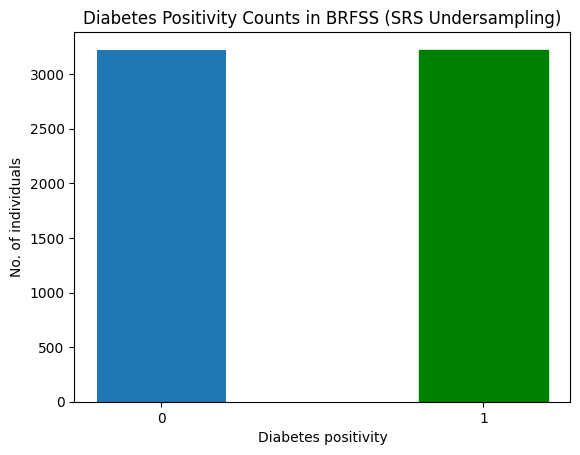

In [187]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Undersampling)")
plt.show()

In [188]:
data_T_y.value_counts()

,count
Y,
0.0,6483
1.0,1424


In [189]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (5158, 15)
y_S_train: (5158,)
X_S_test: (1290, 15)
y_S_test: (1290,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_557"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3899 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3900 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3904 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3905 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6259 - loss: 0.6762 - val_AUC: 0.8151 - val_loss: 0.5345
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8388 - loss: 0.4984 - val_AUC: 0.8979 - val_loss: 0.4165
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8712 - loss: 0.4509 - val_AUC: 0.9006 - val_loss: 0.4144
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8874 - loss: 0.4230 - val_AUC: 0.9028 - val_loss: 0.4353
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8884 - loss: 0.4202 - val_AUC: 0.9048 - val_loss: 0.3916
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8913 - loss: 0.4151 - val_AUC: 0.9067 - val_loss: 0.3946
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.8946 - loss: 0.4047 - val_AUC: 0.9045 - val_loss: 0.3938
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9010 - loss: 0.3922 - val_AUC: 0.9075 - val_loss: 0.3837
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

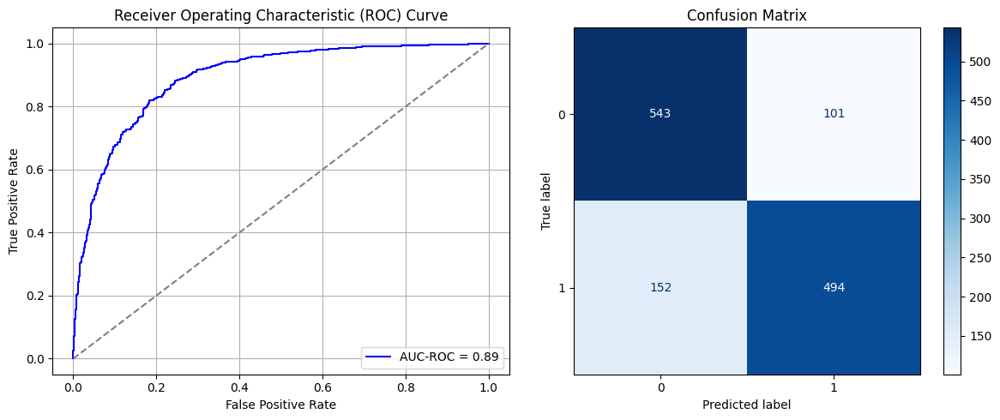

Best threshold based on F1-score: 0.23314327001571655
Time elapsed (performance): 13.013690412999495


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_558"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3906 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3907 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3911 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3912 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6974 - loss: 0.7734 - val_AUC: 0.0000e+00 - val_loss: 0.9504
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7064 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9773
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7342 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7298 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7234 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9708
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7264 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_559"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3913 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3914 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3918 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3919 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6881 - loss: 0.7690 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7447 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7295 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7262 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.9481
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7215 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9257
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_560"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3920 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3921 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3925 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3926 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7116 - loss: 0.7369 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7070 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7327 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9263
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7036 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9945
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7220 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_561"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3927 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3928 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3932 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3933 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - AUC: 0.7169 - loss: 0.7385 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7103 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7308 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7339 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9022
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7221 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9594
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7361 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - AUC: 0.7410 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7271 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_562"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3934 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3935 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3939 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3940 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7189 - loss: 0.7210 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7133 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7194 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9801
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7176 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7239 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9352
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7050 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.9903
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7320 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9660
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_563"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3941 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3942 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3945 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3946 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3947 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6991 - loss: 0.7763 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7078 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9264
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7195 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9820
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7339 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7432 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7330 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7443 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 1.0314
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_564"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3948 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3949 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3952 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3953 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3954 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7265 - loss: 0.6843 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6910 - loss: 0.6230 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7377 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7395 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9177
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7228 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.9537
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7341 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7411 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_565"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3955 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3956 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3959 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3960 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3961 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7068 - loss: 0.7188 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7062 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7263 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7414 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9598
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7450 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 1.0068
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7186 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7076 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_566"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3962 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3963 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3966 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3967 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3968 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7059 - loss: 0.7466 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7389 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6918 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7331 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7136 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9569
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7168 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7549 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7220 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9717
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_567"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3969 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3970 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3973 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3974 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3975 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7212 - loss: 0.7150 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7187 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9584
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7118 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7219 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9422
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7095 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7411 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.9315
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_568"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3976 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3977 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3980 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3981 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3982 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7169 - loss: 0.7115 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9131
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7108 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9494
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7059 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7164 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6879 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.9524
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7358 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_569"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3983 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3984 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3987 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3988 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3989 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7012 - loss: 0.7421 - val_AUC: 0.0000e+00 - val_loss: 0.8127
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7243 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7134 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7287 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7345 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8328
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7126 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9939
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_570"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3990 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3991 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3994 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3995 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3996 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6847 - loss: 0.7859 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7417 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7261 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7258 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7250 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9200
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7359 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_571"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3997 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3998 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4001 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4002 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4003 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7175 - loss: 0.7516 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7236 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.9165
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7253 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9777
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7515 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7331 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7390 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7452 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_572"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4004 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4005 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4008 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4009 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4010 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7032 - loss: 0.7365 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9173
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7257 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9039
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7285 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7191 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7587 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7156 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7326 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_573"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4011 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4012 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4015 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4016 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4017 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7238 - loss: 0.7369 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7062 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7201 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7187 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7418 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.9608
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7233 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7351 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7193 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_574"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4018 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4019 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4022 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4023 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4024 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6876 - loss: 0.7675 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7064 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7060 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9726
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7246 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7179 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7314 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_575"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4025 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4026 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4029 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4030 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4031 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7176 - loss: 0.7146 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7354 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6962 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7345 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7358 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9395
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7249 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_576"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4032 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4033 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4036 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4037 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4038 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7241 - loss: 0.7101 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7284 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9561
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6891 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9331
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7117 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.9351
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7415 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_577"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4039 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4040 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4043 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4044 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4045 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7018 - loss: 0.7707 - val_AUC: 0.0000e+00 - val_loss: 0.9401
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7197 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7106 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9541
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7214 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7227 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7178 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9758
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7262 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9384
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_578"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4046 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4047 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4050 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4051 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4052 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6409 - loss: 0.6660 - val_AUC: 0.8395 - val_loss: 0.5513
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8352 - loss: 0.5022 - val_AUC: 0.8991 - val_loss: 0.4096
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8749 - loss: 0.4433 - val_AUC: 0.8974 - val_loss: 0.4342
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8829 - loss: 0.4328 - val_AUC: 0.9045 - val_loss: 0.4000
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8999 - loss: 0.3986 - val_AUC: 0.9062 - val_loss: 0.3970
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8979 - loss: 0.4015 - val_AUC: 0.9056 - val_loss: 0.3902
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8848 - loss: 0.4247 - val_AUC: 0.9016 - val_loss: 0.4062
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9037 - loss: 0.3893 - val_AUC: 0.9066 - val_loss: 0.3876
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

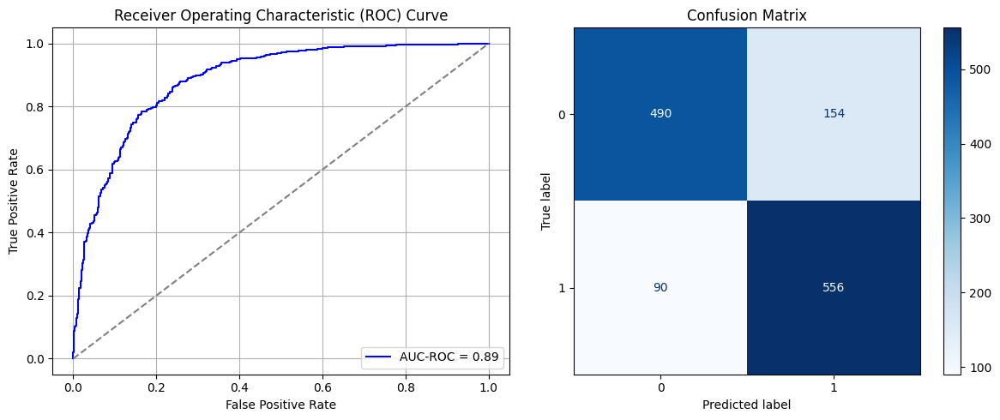

Best threshold based on F1-score: 0.4773135483264923
Time elapsed (performance): 11.890393622999909


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_579"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4053 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4054 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4057 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4058 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4059 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7133 - loss: 0.6646 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7084 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7293 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7132 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7434 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9437
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7576 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7526 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_580"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4060 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4061 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4064 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4065 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4066 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6926 - loss: 0.7128 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7151 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.9240
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7186 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7251 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7379 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7445 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8389
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7268 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_581"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4067 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4068 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4071 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4072 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4073 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6872 - loss: 0.6985 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7324 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 1.0073
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7436 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7420 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9344
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7359 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7480 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7552 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_582"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4074 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4075 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4078 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4079 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4080 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6848 - loss: 0.7152 - val_AUC: 0.0000e+00 - val_loss: 0.9700
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7377 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9351
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7265 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9936
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7299 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.9645
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7291 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7629 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_583"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4081 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4082 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4085 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4086 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4087 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7136 - loss: 0.6712 - val_AUC: 0.0000e+00 - val_loss: 0.9270
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7221 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.9080
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7448 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9304
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7222 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7532 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7666 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.7370
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_584"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4088 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4089 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4092 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4093 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4094 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7256 - loss: 0.6480 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7223 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7229 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7176 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9377
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7370 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7418 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_585"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4095 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4096 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4099 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4100 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4101 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7184 - loss: 0.6693 - val_AUC: 0.0000e+00 - val_loss: 0.9638
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7241 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9485
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9753
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7540 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7647 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7692 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_586"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4102 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4103 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4106 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4107 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4108 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6800 - loss: 0.7017 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6988 - loss: 0.6187 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7197 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 1.0020
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7479 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7445 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7568 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7378 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_587"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4109 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4110 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4113 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4114 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4115 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6777 - loss: 0.7269 - val_AUC: 0.0000e+00 - val_loss: 0.9758
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7145 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.9421
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7084 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7301 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7189 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.9554
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7425 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7342 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 1.0033
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7544 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_588"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4116 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4117 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4120 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4121 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4122 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.7075 - loss: 0.6763 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7143 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7365 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7381 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7393 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7221 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7474 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.9478
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_589"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4123 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4124 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4127 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4128 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4129 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7184 - loss: 0.6564 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7160 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7148 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7390 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7364 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7384 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9544
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7527 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7573 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.9198
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_590"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4130 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4131 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4134 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4135 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4136 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6961 - loss: 0.6885 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7048 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7150 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7182 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7514 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9600
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7327 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7217 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_591"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4137 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4138 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4141 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4142 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4143 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7038 - loss: 0.6966 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7045 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7311 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7124 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9230
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7359 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7494 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7304 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_592"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4144 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4145 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4148 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4149 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4150 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7083 - loss: 0.6728 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7347 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7155 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9418
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7605 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7485 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7594 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_593"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4151 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4152 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4155 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4156 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4157 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7101 - loss: 0.6588 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7069 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.9446
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7238 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9436
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7526 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7732 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7565 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_594"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4158 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4159 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4162 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4163 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4164 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7342 - loss: 0.6413 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9794
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7401 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9238
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7220 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9202
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7342 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7455 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7632 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_595"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4165 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4166 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4169 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4170 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4171 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7038 - loss: 0.6746 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7289 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9473
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7226 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9574
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7206 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9570
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9301
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7291 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9577
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7518 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7491 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8589
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_596"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4172 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4173 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4176 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4177 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4178 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7083 - loss: 0.6709 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7283 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7259 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9905
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7209 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7532 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7721 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7593 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 1.0899
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_597"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4179 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4180 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4183 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4184 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4185 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7039 - loss: 0.6674 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7173 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7321 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7253 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7289 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7312 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9199
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7545 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7400 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_598"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4186 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4187 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4190 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4191 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4192 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6834 - loss: 0.7155 - val_AUC: 0.0000e+00 - val_loss: 0.9588
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7170 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7035 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7281 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9876
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7461 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_599"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4193 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4194 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4197 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4198 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4199 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6103 - loss: 0.6764 - val_AUC: 0.8226 - val_loss: 0.5318
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8270 - loss: 0.5146 - val_AUC: 0.8967 - val_loss: 0.4131
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8775 - loss: 0.4407 - val_AUC: 0.8947 - val_loss: 0.4421
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8850 - loss: 0.4254 - val_AUC: 0.9070 - val_loss: 0.3892
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8957 - loss: 0.4063 - val_AUC: 0.9017 - val_loss: 0.4085
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9011 - loss: 0.3937 - val_AUC: 0.9062 - val_loss: 0.3966
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8953 - loss: 0.4067 - val_AUC: 0.9091 - val_loss: 0.3827
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8958 - loss: 0.4048 - val_AUC: 0.9081 - val_loss: 0.3949
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

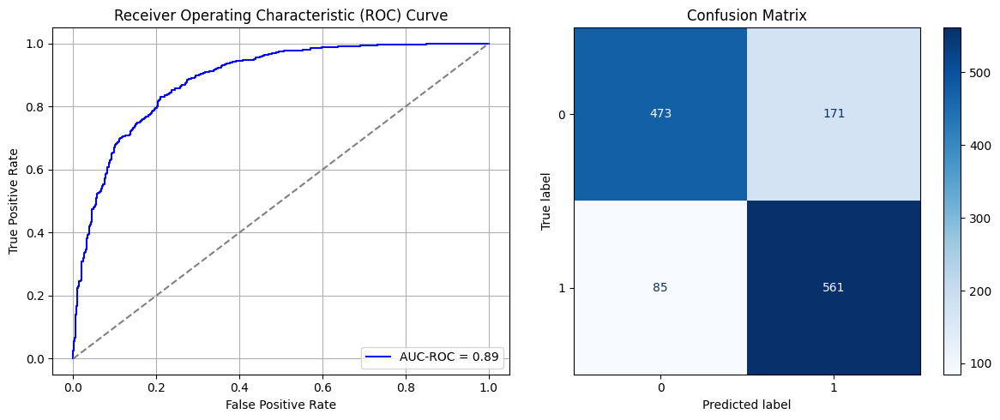

Best threshold based on F1-score: 0.4699729084968567
Time elapsed (performance): 12.630590592998487


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_600"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4200 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4201 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4204 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4205 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4206 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7043 - loss: 0.6924 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7220 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7177 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7129 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7291 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7518 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9484
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_601"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4207 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4208 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4211 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4212 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4213 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7330 - loss: 0.6435 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7065 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7076 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9322
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7205 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 1.0156
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7335 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9389
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7402 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_602"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4214 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4215 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4218 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4219 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4220 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7186 - loss: 0.6783 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7183 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7362 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7216 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 1.0025
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7411 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7408 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7328 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9672
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_603"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4221 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4222 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4225 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4226 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4227 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7322 - loss: 0.6377 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7318 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7623 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7306 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9599
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7305 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7493 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7405 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_604"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4228 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4229 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4232 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4233 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4234 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7137 - loss: 0.6674 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7178 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.9448
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7472 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7428 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7421 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_605"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4235 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4236 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4239 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4240 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4241 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7112 - loss: 0.6844 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7203 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.9653
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7343 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7211 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7403 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7344 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7377 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7500 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_606"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4242 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4243 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4246 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4247 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4248 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6994 - loss: 0.6998 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7257 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7354 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7511 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8648
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7276 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7255 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9406
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7523 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7438 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_607"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4249 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4250 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4253 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4254 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4255 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7190 - loss: 0.6641 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8815
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7277 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7402 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8138
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7553 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7450 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7516 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_608"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4256 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4257 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4260 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4261 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4262 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7154 - loss: 0.6630 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7128 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7262 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7295 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7234 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9356
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7374 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7318 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_609"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4263 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4264 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4267 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4268 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4269 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7279 - loss: 0.6591 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7122 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7359 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7093 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9710
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7443 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.9187
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7523 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7570 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_610"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4270 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4271 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4274 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4275 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4276 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6936 - loss: 0.6969 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7290 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7261 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7362 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7334 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7385 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9610
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7351 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_611"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4277 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4278 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4281 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4282 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4283 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6926 - loss: 0.7050 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.9532
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7266 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7110 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7599 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7528 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7575 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_612"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4284 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4285 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4288 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4289 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4290 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7074 - loss: 0.6688 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7280 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7258 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7367 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7327 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7340 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7458 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_613"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4291 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4292 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4295 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4296 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4297 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7292 - loss: 0.6652 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7393 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7320 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7316 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7271 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9534
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7138 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7510 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.9727
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7566 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 1.0067
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_614"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4298 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4299 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4302 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4303 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4304 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7202 - loss: 0.6574 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7099 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7216 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7265 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7316 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7472 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.9008
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_615"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4305 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4306 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4309 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4310 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4311 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7278 - loss: 0.6466 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7121 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7073 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7260 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7274 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7555 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7488 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_616"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4312 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4313 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4316 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4317 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4318 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7191 - loss: 0.6816 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7057 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7130 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7422 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7410 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7407 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7452 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7372 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9247
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_617"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4319 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4320 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4323 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4324 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4325 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7028 - loss: 0.6954 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7077 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7175 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7383 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 1.0037
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7416 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7582 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_618"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4326 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4327 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4330 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4331 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4332 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7542 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7075 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7277 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7244 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7500 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.9541
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7236 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7570 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.9341
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_619"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4333 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4334 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4337 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4338 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4339 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7313 - loss: 0.6382 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.9601
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7116 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.9298
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7446 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7682 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7483 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7654 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_620"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4340 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4341 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4344 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4345 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4346 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6094 - loss: 0.6815 - val_AUC: 0.8080 - val_loss: 0.5626
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8268 - loss: 0.5164 - val_AUC: 0.8967 - val_loss: 0.4578
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8787 - loss: 0.4356 - val_AUC: 0.9049 - val_loss: 0.4123
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8990 - loss: 0.3978 - val_AUC: 0.9030 - val_loss: 0.4012
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8909 - loss: 0.4138 - val_AUC: 0.9061 - val_loss: 0.3924
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8960 - loss: 0.3981 - val_AUC: 0.9000 - val_loss: 0.4002
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9060 - loss: 0.3836 - val_AUC: 0.9064 - val_loss: 0.3925
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9058 - loss: 0.3840 - val_AUC: 0.9096 - val_loss: 0.3851
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

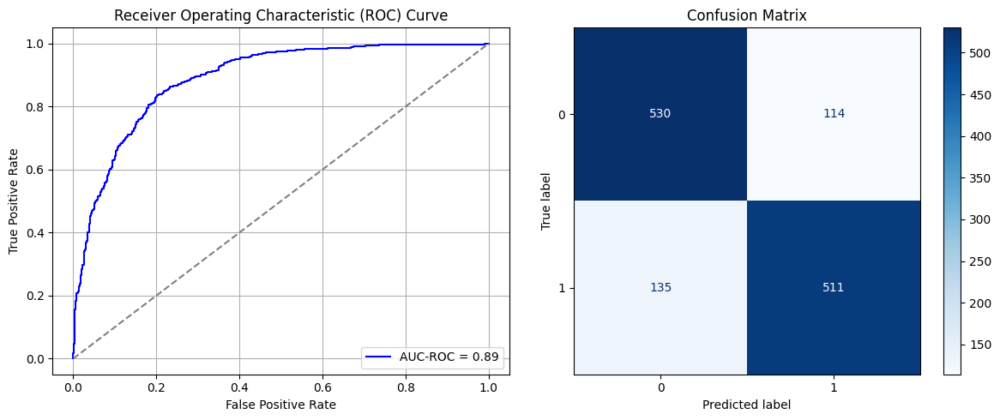

Best threshold based on F1-score: 0.33863720297813416
Time elapsed (performance): 15.307202650999898


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_621"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4347 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4348 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4351 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4352 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4353 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7242 - loss: 0.7111 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6941 - loss: 0.6237 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7114 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7222 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7406 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7500 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7432
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7326 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7281 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_622"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4354 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4355 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4358 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4359 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4360 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7025 - loss: 0.7631 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7027 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7070 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7374 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7312 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7465 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7306 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7234 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_623"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4361 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4362 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4365 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4366 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4367 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6636 - loss: 0.8393 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7379 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7039 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7304 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8190
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7429 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7529 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7228 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_624"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4368 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4369 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4372 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4373 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4374 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6661 - loss: 0.8048 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7265 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7243 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7253 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.9977
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7419 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7220 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7301 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7490 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_625"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4375 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4376 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4379 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4380 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4381 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6929 - loss: 0.7788 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6944 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7061 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7110 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9815
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7383 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7304 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_626"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4382 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4383 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4386 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4387 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4388 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6961 - loss: 0.7506 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7066 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7153 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7120 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7278 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7357 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7397 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7600 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_627"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4389 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4390 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4393 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4394 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4395 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6833 - loss: 0.8116 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7166 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7292 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8272
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7245 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9413
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7224 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7116 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7362 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.9350
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_628"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4396 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4397 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4400 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4401 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4402 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6822 - loss: 0.7859 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7103 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7071 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7260 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.9574
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7392 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7404 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_629"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4403 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4404 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4407 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4408 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4409 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6837 - loss: 0.7951 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6990 - loss: 0.6238 - val_AUC: 0.0000e+00 - val_loss: 0.9447
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7234 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7171 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7287 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7267 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7444 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9572
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7198 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_630"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4410 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4411 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4413 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4414 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4415 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4416 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6973 - loss: 0.7480 - val_AUC: 0.0000e+00 - val_loss: 0.8869
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7155 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7147 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7232 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_631"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4417 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4418 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4420 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4421 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4422 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4423 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6937 - loss: 0.7565 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7082 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7134 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7321 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7407 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.7903
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7203 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.9507
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7202 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9122
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7285 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_632"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4424 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4425 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4427 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4428 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4429 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4430 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6802 - loss: 0.7960 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7113 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7200 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7251 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7240 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9299
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7167 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7280 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7312 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_633"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4431 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4432 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4434 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4435 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4436 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4437 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6931 - loss: 0.7635 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7212 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7223 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.7617
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7284 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7311 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7298 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7372 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7499 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_634"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4438 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4439 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4441 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4442 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4443 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4444 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6804 - loss: 0.7781 - val_AUC: 0.0000e+00 - val_loss: 0.7646
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7294 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9719
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7330 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9527
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7119 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7328 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 1.0289
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7226 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8232
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7346 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7195 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.9157
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_635"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4445 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4446 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4448 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4449 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4450 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4451 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7049 - loss: 0.7650 - val_AUC: 0.0000e+00 - val_loss: 0.7851
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7213 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7025 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7299 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9381
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7034 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7277 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9282
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7487 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7218 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_636"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4452 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4453 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4455 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4456 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4457 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4458 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6905 - loss: 0.7814 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7192 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7299 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7195 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7390 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7426 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.7791
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7315 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_637"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4459 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4460 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4462 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4463 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4464 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4465 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.6736 - loss: 0.8090 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7455 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7098 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7259 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7413 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7347 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9594
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7373 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_638"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4466 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4467 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4469 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4470 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4471 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4472 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7023 - loss: 0.7552 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7221 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7288 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.7874
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7045 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7368 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 1.0142
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7201 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7236 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7421 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_639"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4473 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4474 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4476 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4477 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4478 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4479 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6868 - loss: 0.7804 - val_AUC: 0.0000e+00 - val_loss: 0.7325
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7010 - loss: 0.6230 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7258 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9544
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9178
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7244 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9418
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7472 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7516 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.7491
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_640"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4480 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4481 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4483 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4484 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4485 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4486 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6809 - loss: 0.8094 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7069 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7101 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7408 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.7576
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7232 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7359 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7320 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_641"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4487 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4488 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4490 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4491 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4492 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4493 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6104 - loss: 0.6702 - val_AUC: 0.8537 - val_loss: 0.5058
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8487 - loss: 0.4855 - val_AUC: 0.8981 - val_loss: 0.4098
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8783 - loss: 0.4390 - val_AUC: 0.8966 - val_loss: 0.4364
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8877 - loss: 0.4205 - val_AUC: 0.9039 - val_loss: 0.3931
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8906 - loss: 0.4157 - val_AUC: 0.9060 - val_loss: 0.3931
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8982 - loss: 0.4010 - val_AUC: 0.9036 - val_loss: 0.4279
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8865 - loss: 0.4202 - val_AUC: 0.9030 - val_loss: 0.4068
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9126 - loss: 0.3687 - val_AUC: 0.9055 - val_loss: 0.3932
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step -

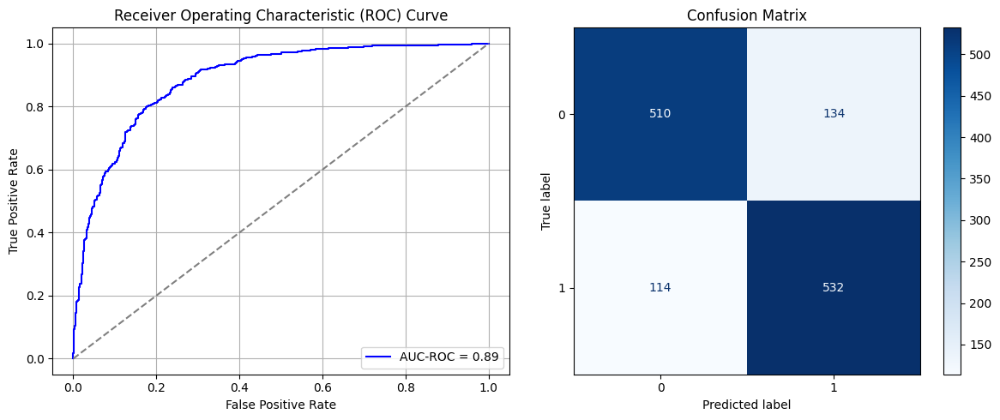

Best threshold based on F1-score: 0.25232842564582825
Time elapsed (performance): 15.138650966999194


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_642"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4494 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4495 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4497 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4498 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4499 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4500 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7202 - loss: 0.7273 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7524 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7403 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7504 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7350 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7642 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7426 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_643"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4501 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4502 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4504 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4505 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4506 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4507 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7300 - loss: 0.7169 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7412 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7639 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.9356
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7508 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7482 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7665 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_644"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4508 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4509 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4511 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4512 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4513 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4514 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7281 - loss: 0.6999 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7512 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7575 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7288 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7534 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7513 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7548 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7401 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 1.0115
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_645"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4515 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4516 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4518 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4519 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4520 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4521 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7200 - loss: 0.7102 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7356 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7307 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7554 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7462
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7657 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7431 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7726 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7568 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.9739
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_646"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4522 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4523 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4525 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4526 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4527 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4528 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7318 - loss: 0.7099 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7201 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7179 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9387
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7354 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7331 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7564 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7507 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.9566
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7588 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_647"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4529 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4530 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4532 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4533 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4534 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4535 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7276 - loss: 0.7221 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7384 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7669 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7365 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8258
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7521 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7672 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.9385
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7481 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.9787
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_648"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4536 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4537 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4539 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4540 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4541 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4542 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7176 - loss: 0.7165 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7465 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7352 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7427 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7390 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7613 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7583 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.9598
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7620 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_649"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4543 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4544 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4546 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4547 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4548 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4549 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7121 - loss: 0.7231 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7464 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7183 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7428 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7479 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7451 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7568 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7568 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_650"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4550 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4551 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4553 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4554 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4555 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4556 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7440 - loss: 0.6962 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7405 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7574 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7551 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7554 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7393 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7592 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7609 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_651"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4557 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4558 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4560 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4561 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4562 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4563 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7364 - loss: 0.6789 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7368 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7305 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7672 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7443 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7309 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7883
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7676 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_652"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4564 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4565 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4567 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4568 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4569 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4570 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7266 - loss: 0.7489 - val_AUC: 0.0000e+00 - val_loss: 0.9425
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7365 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7625 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7499 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.9349
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7509 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7582 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7455 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_653"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4571 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4572 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4574 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4575 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4576 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4577 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7283 - loss: 0.7200 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7391 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7336 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7430 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7500 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7563 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7477 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7573 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_654"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4578 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4579 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4581 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4582 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4583 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4584 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7322 - loss: 0.7059 - val_AUC: 0.0000e+00 - val_loss: 0.8655
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7443 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7481 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9351
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7701 - loss: 0.5407 - val_AUC: 0.0000e+00 - val_loss: 0.7533
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7428 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7614 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7366 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_655"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4585 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4586 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4588 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4589 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4590 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4591 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7149 - loss: 0.7013 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7520 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.9298
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7572 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7558 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7719 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7361 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7575 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_656"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4592 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4593 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4595 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4596 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4597 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4598 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7454 - loss: 0.6871 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7368 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7486 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7643 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7448 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7585 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7449 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9249
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7495 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_657"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4599 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4600 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4602 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4603 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4604 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4605 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7325 - loss: 0.7315 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7321 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9645
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7448 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9489
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7440 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7544 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7365 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9427
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7587 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7719 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_658"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4606 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4607 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4609 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4610 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4611 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4612 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7344 - loss: 0.7182 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7422 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7508 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.9474
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7557 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7492 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7475 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7348 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7655 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_659"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4613 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4614 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4616 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4617 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4618 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4619 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7017 - loss: 0.7679 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7451 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7299 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7528 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7544 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7535 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7584 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7549 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_660"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4620 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4621 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4623 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4624 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4625 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4626 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7319 - loss: 0.7017 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7491 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9345
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7504 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.9274
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7497 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7380 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7547 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7622 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7767 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_661"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4627 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4628 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4630 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4631 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4632 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4633 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - AUC: 0.7089 - loss: 0.7304 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7488 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7313 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7448 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7619 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7637 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7496 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9794
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7485 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

In [190]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)

In [192]:
print(ParamFit)
ParamFit.to_csv('SRS_Fine_Tuning.csv')

         FPR       FNR
0   0.233565  0.460208
1   0.194896  0.522491
2   0.194122  0.522491
3   0.211137  0.487889
4   0.211137  0.498270
..       ...       ...
95  0.245166  0.397924
96  0.233565  0.418685
97  0.246713  0.401384
98  0.210363  0.456747
99  0.259087  0.356401

[100 rows x 2 columns]


In [194]:
ParamFit['FNR'].mean()

np.float64(0.4403806228373702)

## Simple Random Sampling with Replacement:

In [193]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y2
0,0.519481,0.0,0.5,1.0,0.0,0.092259,1.0,0.0,0.0,0.133333,0.363636,0.053070,0.000000,0.0,0.0,0
1,0.337662,0.1,0.0,0.5,0.0,0.073067,1.0,0.0,0.0,0.133333,0.363636,0.030704,0.000000,0.0,0.0,0
2,0.194805,0.2,0.5,0.5,0.0,0.072822,1.0,1.0,0.0,0.133333,0.363636,0.015453,0.000000,0.0,0.0,0
3,0.220779,0.0,0.5,1.0,0.0,0.074901,1.0,0.0,0.0,0.133333,0.363636,0.028264,0.000000,0.0,0.0,0
4,0.129870,0.0,0.0,1.0,0.0,0.076862,1.0,1.0,0.0,0.133333,0.363636,0.044124,0.000000,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35281,0.064935,1.0,0.0,1.0,0.0,0.073829,0.0,0.0,0.5,0.533333,0.909091,0.054087,0.000000,0.0,0.0,1
35282,0.090909,0.1,0.0,0.5,0.0,0.077388,0.0,1.0,0.5,0.533333,0.909091,0.078487,0.016129,0.0,0.0,1
35283,0.428571,0.1,0.5,1.0,0.0,0.080293,0.0,0.0,0.5,0.533333,0.909091,0.198658,0.032258,0.0,0.0,1
35284,0.688312,0.4,1.0,0.0,0.0,0.088501,0.0,0.0,0.5,0.533333,0.909091,0.092721,0.016129,0.0,0.0,1


In [195]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Y
0,0.194805,0.5,0.5,1.0,0.0,0.080811,0.0,0.0,1.0,0.666667,0.818182,0.007930,0.000000,0.174312,0.010909,0.0
1,0.311688,0.5,0.0,0.5,0.0,0.070561,1.0,1.0,1.0,0.666667,0.818182,0.105531,0.000000,0.191514,0.003636,0.0
2,0.194805,0.6,0.5,0.5,0.0,0.104071,1.0,0.0,1.0,0.666667,0.818182,0.029280,0.000000,0.105505,0.014545,0.0
3,0.233766,0.0,0.5,1.0,0.0,0.094729,1.0,0.0,1.0,0.700000,0.818182,0.014843,0.000000,0.099771,0.014545,0.0
4,0.233766,0.0,0.5,1.0,0.0,0.072803,1.0,0.0,1.0,0.733333,0.818182,0.028467,0.000000,0.165138,0.010909,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,0.207792,0.3,0.0,0.5,0.0,0.086195,1.0,0.0,0.5,0.500000,0.909091,0.237088,0.032258,0.608945,0.043636,0.0
7903,0.454545,0.0,0.5,1.0,0.0,0.078096,0.0,0.0,0.5,0.533333,0.909091,0.045954,0.000000,0.212156,0.014545,1.0
7904,0.714286,0.4,0.5,0.5,0.0,0.098678,0.0,0.0,0.5,0.533333,0.909091,0.061000,0.000000,0.047018,0.029091,0.0
7905,0.701299,0.4,0.5,0.5,0.0,0.124689,0.0,0.0,0.5,0.533333,0.909091,0.229158,0.064516,0.212156,0.010909,1.0


In [196]:
X_S_SRSwR, y_S_SRSwR = SRSwR_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(X_S_SRSwR)

3224
32062
              0    1    2    3    4         5    6    7    8         9  \
20992  0.168831  0.1  0.5  0.5  0.0  0.070034  0.0  1.0  0.5  0.633333   
16469  0.220779  0.3  0.5  0.5  0.0  0.076880  1.0  0.0  0.5  0.900000   
30057  0.233766  0.0  1.0  1.0  0.0  0.078868  1.0  0.0  0.5  0.133333   
18594  0.454545  0.3  0.5  0.0  0.0  0.079948  1.0  1.0  0.5  0.200000   
30700  0.389610  0.3  0.5  0.5  0.0  0.118906  1.0  0.0  1.0  0.233333   
...         ...  ...  ...  ...  ...       ...  ...  ...  ...       ...   
35280  0.207792  0.5  0.0  0.5  0.0  0.077860  0.0  0.0  0.5  0.533333   
35281  0.064935  1.0  0.0  1.0  0.0  0.073829  0.0  0.0  0.5  0.533333   
35282  0.090909  0.1  0.0  0.5  0.0  0.077388  0.0  1.0  0.5  0.533333   
35283  0.428571  0.1  0.5  1.0  0.0  0.080293  0.0  0.0  0.5  0.533333   
35284  0.688312  0.4  1.0  0.0  0.0  0.088501  0.0  0.0  0.5  0.533333   

             10        11        12   13   14  
20992  0.636364  0.016877  0.032258  0.0  0.0  
1646

In [197]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRSwR, y_S_SRSwR, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRSwR, y_T_train_SRSwR = SRSwR_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRSwR)

1135
5190
1677    0.0
2441    0.0
3779    0.0
3232    0.0
1309    0.0
       ... 
7640    1.0
6743    1.0
7891    1.0
7527    1.0
5827    1.0
Name: Y, Length: 2270, dtype: float64


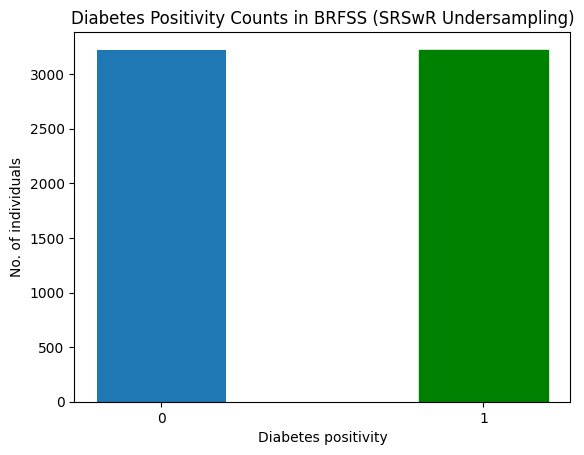

In [198]:
barlist = plt.bar([str(0),str(1)], y_S_SRSwR.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRSwR Undersampling)")
plt.show()

In [199]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (5158, 15)
y_S_train: (5158,)
X_S_test: (1290, 15)
y_S_test: (1290,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_662"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4634 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4635 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4637 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4638 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4639 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4640 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6229 - loss: 0.6742 - val_AUC: 0.8013 - val_loss: 0.5559
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.8299 - loss: 0.5105 - val_AUC: 0.8683 - val_loss: 0.4727
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8738 - loss: 0.4460 - val_AUC: 0.8823 - val_loss: 0.4379
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9011 - loss: 0.3979 - val_AUC: 0.8873 - val_loss: 0.4364
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8954 - loss: 0.4055 - val_AUC: 0.8849 - val_loss: 0.4436
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8981 - loss: 0.4021 - val_AUC: 0.8920 - val_loss: 0.4178
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8991 - loss: 0.4007 - val_AUC: 0.8909 - val_loss: 0.4287
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9106 - loss: 0.3798 - val_AUC: 0.8923 - val_loss: 0.4132
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

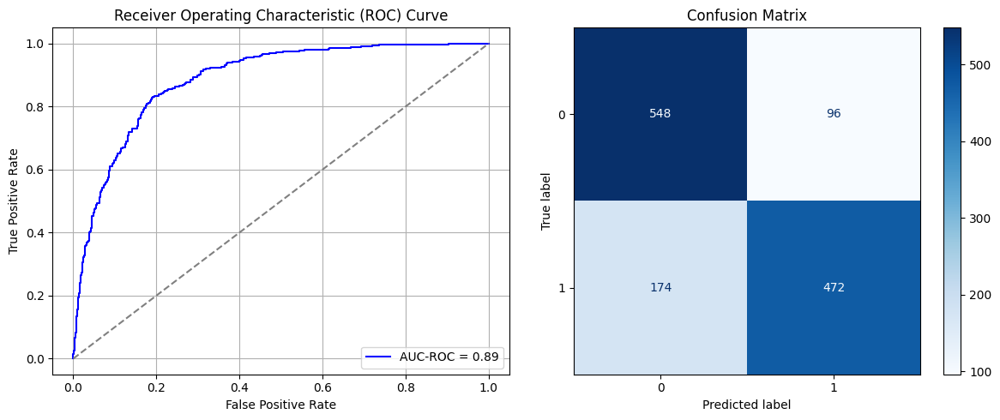

Best threshold based on F1-score: 0.2063170075416565
Time elapsed (performance): 14.64795439899899


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_663"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4641 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4642 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4644 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4645 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4646 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4647 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7007 - loss: 0.6478 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7240 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7238 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7281 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7566 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8871
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7511 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7580 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7355 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9608
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_664"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4648 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4649 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4651 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4652 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4653 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4654 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7213 - loss: 0.6262 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6938 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 0.9973
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7334 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.9670
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7575 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7323 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7480 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9576
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7562 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_665"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4655 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4656 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4658 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4659 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4660 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4661 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7017 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 0.7420
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7297 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7320 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 1.0101
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7587 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7631 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.7773
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_666"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4662 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4663 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4665 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4666 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4667 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4668 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7045 - loss: 0.6609 - val_AUC: 0.0000e+00 - val_loss: 0.9612
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7141 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.9222
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7672 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7234 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7576 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7440 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7515 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7611 - loss: 0.5490 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_667"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4669 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4670 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4672 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4673 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4674 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4675 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7107 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 0.9459
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7204 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.9451
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7306 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9797
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7467 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7399 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7674 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7478 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_668"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4676 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4677 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4680 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4681 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4682 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6989 - loss: 0.6418 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.6165 - val_AUC: 0.0000e+00 - val_loss: 0.9680
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7216 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9464
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7430 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.9506
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7586 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.9705
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7520 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7680 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.9014
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_669"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4683 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4684 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4687 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4688 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4689 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7021 - loss: 0.6515 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7100 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7530 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.9405
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7132 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7326 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7628 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7478 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7705 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_670"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4690 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4691 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4694 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4695 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4696 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7032 - loss: 0.6541 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7201 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9983
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9431
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7472 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7486 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7734 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7684 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_671"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4697 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4698 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4701 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4702 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4703 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7004 - loss: 0.6625 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6932 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7237 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.9727
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9809
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7409 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7494 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7365 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_672"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4704 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4705 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4708 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4709 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4710 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6810 - loss: 0.6952 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7140 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.7941
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7207 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7319 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7470 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7570 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7783 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_673"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4711 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4712 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4715 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4716 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4717 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7067 - loss: 0.6377 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8039
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7216 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7635 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7515 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7555 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7557 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7705 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_674"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4718 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4719 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4722 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4723 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4724 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7269 - loss: 0.6196 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7042 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7622 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.9325
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7296 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.7993
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7546 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.9413
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7640 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_675"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4725 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4726 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4729 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4730 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4731 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7269 - loss: 0.6246 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7202 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7316 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7301 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7706 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7507 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7535 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7438 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_676"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4732 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4733 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4736 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4737 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4738 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7115 - loss: 0.6274 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7069 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7091 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9413
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.9228
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7435 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7512 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7611 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7689 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_677"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4739 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4740 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4743 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4744 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4745 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7075 - loss: 0.6587 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7267 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7562 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 1.0095
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7681 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.9706
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7845 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_678"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4746 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4747 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4750 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4751 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4752 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7000 - loss: 0.6588 - val_AUC: 0.0000e+00 - val_loss: 0.9014
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9551
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7465 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.9207
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 1.0310
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7530 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7556 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_679"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4753 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4754 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4757 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4758 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4759 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7322 - loss: 0.6251 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7243 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7431 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7354 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7376 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7595 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.9632
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7581 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.9793
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7668 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_680"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4760 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4761 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4764 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4765 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4766 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7034 - loss: 0.6610 - val_AUC: 0.0000e+00 - val_loss: 0.9800
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7309 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7248 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7290 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7540 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7518 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7768 - loss: 0.5503 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_681"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4767 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4768 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4771 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4772 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4773 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7055 - loss: 0.6610 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6988 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7371 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7370 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7321 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9974
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7737 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7419 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.9331
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_682"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4774 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4775 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4778 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4779 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4780 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7156 - loss: 0.6312 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6931 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9114
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7519 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7410 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7510 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7629 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_683"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4781 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4782 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4785 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4786 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4787 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6252 - loss: 0.6711 - val_AUC: 0.7554 - val_loss: 0.6034
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8147 - loss: 0.5301 - val_AUC: 0.8787 - val_loss: 0.4394
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8868 - loss: 0.4229 - val_AUC: 0.8793 - val_loss: 0.4348
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9006 - loss: 0.3971 - val_AUC: 0.8874 - val_loss: 0.4192
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8997 - loss: 0.3986 - val_AUC: 0.8822 - val_loss: 0.4750
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9019 - loss: 0.3928 - val_AUC: 0.8828 - val_loss: 0.4343
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9061 - loss: 0.3842 - val_AUC: 0.8835 - val_loss: 0.5262
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9039 - loss: 0.3940 - val_AUC: 0.8922 - val_loss: 0.4115
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

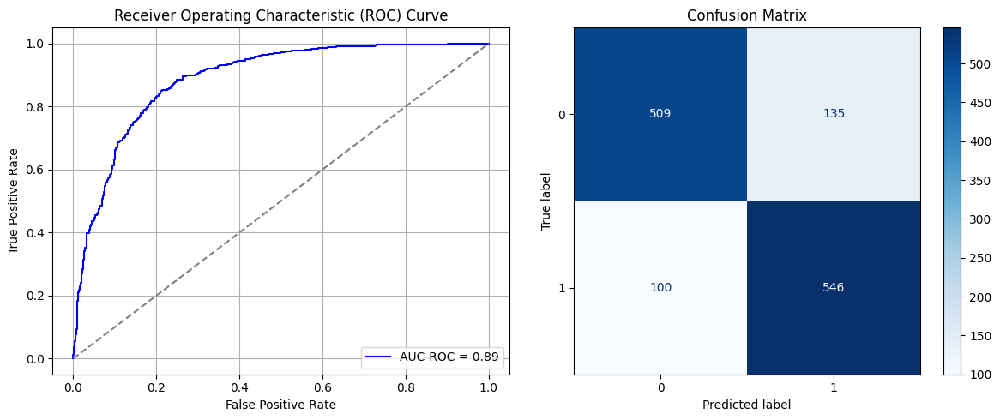

Best threshold based on F1-score: 0.41264286637306213
Time elapsed (performance): 11.048382946999482


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_684"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4788 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4789 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4792 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4793 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4794 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7256 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7115 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7301 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7403 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_685"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4795 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4796 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4799 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4800 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4801 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7386 - loss: 0.6263 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7096 - loss: 0.6114 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7194 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7409 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7468 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.9333
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7526 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_686"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4802 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4803 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4806 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4807 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4808 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7103 - loss: 0.6779 - val_AUC: 0.0000e+00 - val_loss: 0.9367
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7348 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7326 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7190 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9625
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7238 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.9965
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_687"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4809 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4810 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4813 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4814 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4815 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7340 - loss: 0.6368 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7156 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.9470
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7227 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9255
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7578 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7484 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7366 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_688"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4816 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4817 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4820 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4821 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4822 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7467 - loss: 0.6286 - val_AUC: 0.0000e+00 - val_loss: 0.9131
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7034 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7232 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7265 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7478 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_689"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4823 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4824 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4827 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4828 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4829 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7160 - loss: 0.6520 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7153 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7153 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9612
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7520 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7479 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7408 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_690"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4830 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4831 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4834 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4835 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4836 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7265 - loss: 0.6418 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7252 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7490 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7466 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9450
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7409 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.9415
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7234 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7383 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.9563
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_691"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4837 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4838 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4841 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4842 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4843 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7492 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.9876
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7385 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9595
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7274 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7216 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7348 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 1.0467
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_692"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4844 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4845 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4848 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4849 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4850 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7164 - loss: 0.6630 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7331 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7358 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7424 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7316 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9198
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_693"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4851 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4852 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4855 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4856 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4857 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7323 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.9159
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7283 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7357 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9417
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6970 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7396 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7398 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8516
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7476 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7392 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_694"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4858 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4859 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4862 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4863 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4864 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7186 - loss: 0.6577 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7389 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7099 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 1.0185
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7436 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7285 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7305 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_695"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4865 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4866 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4869 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4870 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4871 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7307 - loss: 0.6406 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7264 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7338 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7187 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7193 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7363 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7340 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9227
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7259 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_696"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4872 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4873 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4876 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4877 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4878 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7010 - loss: 0.6783 - val_AUC: 0.0000e+00 - val_loss: 0.8293
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7131 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7242 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9468
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7474 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7536 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7357 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_697"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4879 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4880 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4883 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4884 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4885 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7184 - loss: 0.6519 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7176 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7111 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7221 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7274 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7510 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7325 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7209 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9888
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_698"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4886 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4887 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4890 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4891 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4892 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7022 - loss: 0.6886 - val_AUC: 0.0000e+00 - val_loss: 0.9857
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7174 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.9974
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7527 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7381 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7112 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7193 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_699"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4893 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4894 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4897 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4898 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4899 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7300 - loss: 0.6363 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7003 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6903 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9826
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7299 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9841
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7343 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7379 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7243 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9331
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_700"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4900 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4901 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4904 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4905 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4906 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7132 - loss: 0.6761 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7348 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9593
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7375 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9968
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7431 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7318 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_701"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4907 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4908 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4911 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4912 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4913 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7309 - loss: 0.6350 - val_AUC: 0.0000e+00 - val_loss: 0.7826
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7375 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7376 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7455 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9641
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7175 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7395 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.9846
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_702"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4914 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4915 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4918 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4919 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4920 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7292 - loss: 0.6460 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7326 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7237 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8784
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7167 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7317 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 1.0042
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7320 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_703"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4921 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4922 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4925 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4926 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4927 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7029 - loss: 0.6841 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7383 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7194 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7112 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7271 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9257
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7261 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7388 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_704"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4928 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4929 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4932 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4933 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4934 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6088 - loss: 0.6786 - val_AUC: 0.7566 - val_loss: 0.6044
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8117 - loss: 0.5323 - val_AUC: 0.8815 - val_loss: 0.4348
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8933 - loss: 0.4119 - val_AUC: 0.8869 - val_loss: 0.4219
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9048 - loss: 0.3905 - val_AUC: 0.8865 - val_loss: 0.4416
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9076 - loss: 0.3832 - val_AUC: 0.8892 - val_loss: 0.4182
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8997 - loss: 0.3996 - val_AUC: 0.8904 - val_loss: 0.4239
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9143 - loss: 0.3721 - val_AUC: 0.8936 - val_loss: 0.4090
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9146 - loss: 0.3694 - val_AUC: 0.8939 - val_loss: 0.4111
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

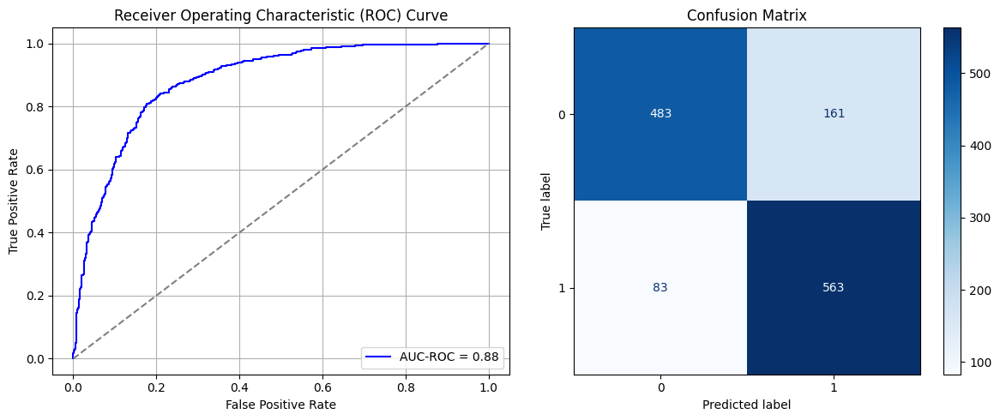

Best threshold based on F1-score: 0.5041101574897766
Time elapsed (performance): 11.556586143000459


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_705"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4935 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4936 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4939 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4940 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4941 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6850 - loss: 0.7197 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7061 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7134 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7449 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7329 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7467 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.9387
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7598 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_706"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4942 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4943 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4945 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4946 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4947 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4948 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7048 - loss: 0.6928 - val_AUC: 0.0000e+00 - val_loss: 0.9345
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7044 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7309 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9701
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7352 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9252
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7415 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 1.0748
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7309 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7318 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_707"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4949 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4950 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4952 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4953 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4954 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4955 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7069 - loss: 0.7005 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6976 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.9464
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7054 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9594
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7215 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 1.0101
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7069 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.9894
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7533 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7557 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_708"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4956 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4957 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4959 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4960 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4961 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4962 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6979 - loss: 0.6993 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7111 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.9552
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7207 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7203 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 1.0026
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7267 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7223 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7563 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7442 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_709"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4963 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4964 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4966 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4967 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4968 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4969 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7180 - loss: 0.6630 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6989 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7104 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.9573
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7481 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 1.0010
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7404 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7373 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9929
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_710"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4970 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4971 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4973 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4974 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4975 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4976 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7135 - loss: 0.6751 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.9715
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6994 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9267
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7147 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7446 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7362 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7443 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.9747
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7387 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_711"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4977 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4978 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4980 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4981 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4982 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4983 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7052 - loss: 0.6889 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7155 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7312 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9708
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7244 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7239 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 1.0115
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7265 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7405 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_712"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4984 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4985 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4987 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4988 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4989 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4990 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6875 - loss: 0.7258 - val_AUC: 0.0000e+00 - val_loss: 1.0028
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7023 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7032 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9157
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7358 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7227 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7416 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7323 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7527 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_713"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4991 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4992 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4994 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4995 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4996 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4997 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7006 - loss: 0.7028 - val_AUC: 0.0000e+00 - val_loss: 0.9832
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6870 - loss: 0.6299 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7068 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7325 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7397 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 1.0380
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7479 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.9827
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7571 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_714"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4998 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4999 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5001 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5002 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5004 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7018 - loss: 0.6959 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7190 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7474 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7373 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 1.0176
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7295 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.9747
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7476 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7502 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_715"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5005 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5006 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5008 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5009 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5011 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6735 - loss: 0.7304 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6981 - loss: 0.6205 - val_AUC: 0.0000e+00 - val_loss: 0.9797
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7214 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9527
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7070 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7586 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7565 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.9525
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_716"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5012 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5013 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5015 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5016 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5018 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6946 - loss: 0.7046 - val_AUC: 0.0000e+00 - val_loss: 1.0349
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7047 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7151 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7232 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7333 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9397
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7400 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9859
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7342 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7458 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_717"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5019 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5020 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5022 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5023 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5025 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6987 - loss: 0.7079 - val_AUC: 0.0000e+00 - val_loss: 0.9131
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7192 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 1.0120
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7387 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7399 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9452
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.9328
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7420 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7444 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.9368
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_718"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5026 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5027 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5029 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5030 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5032 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7026 - loss: 0.6985 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7080 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7224 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7258 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7323 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7250 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.9442
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7574 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_719"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5033 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5034 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5036 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5037 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5039 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7032 - loss: 0.6969 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6815 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7160 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9899
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7056 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7354 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9141
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7427 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7454 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7469 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 1.0084
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_720"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5040 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5041 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5043 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5044 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5046 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6988 - loss: 0.7030 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7166 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9481
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6947 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7274 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7357 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7243 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9462
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7400 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_721"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5047 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5048 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5050 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5051 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5053 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7216 - loss: 0.6720 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7089 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7229 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7364 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9294
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7638 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_722"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5054 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5055 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5057 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5058 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5060 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6993 - loss: 0.7100 - val_AUC: 0.0000e+00 - val_loss: 0.9318
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7085 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.9581
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6901 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9933
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7433 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7268 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7446 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7520 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.9750
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7608 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.9937
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_723"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5061 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5062 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5064 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5065 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5067 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7033 - loss: 0.7029 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7102 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.9187
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7130 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7389 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9906
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7470 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7372 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7604 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7585 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_724"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5068 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5069 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5071 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5072 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5074 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7052 - loss: 0.6971 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7042 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7288 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 1.0263
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7367 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9684
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7369 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7299 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9506
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7174 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9230
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7454 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_725"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5075 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5076 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5078 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5079 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5081 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.6658 - loss: 0.6632 - val_AUC: 0.8053 - val_loss: 0.5864
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8438 - loss: 0.4986 - val_AUC: 0.8688 - val_loss: 0.4674
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8938 - loss: 0.4116 - val_AUC: 0.8805 - val_loss: 0.4385
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8916 - loss: 0.4142 - val_AUC: 0.8801 - val_loss: 0.5125
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8985 - loss: 0.4093 - val_AUC: 0.8846 - val_loss: 0.4303
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9004 - loss: 0.4010 - val_AUC: 0.8846 - val_loss: 0.5085
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9142 - loss: 0.3720 - val_AUC: 0.8882 - val_loss: 0.4211
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9070 - loss: 0.3810 - val_AUC: 0.8875 - val_loss: 0.4439
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

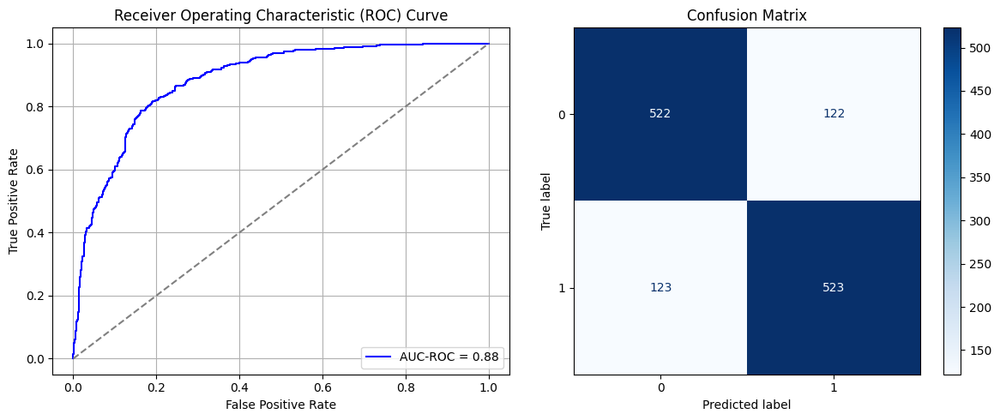

Best threshold based on F1-score: 0.29290515184402466
Time elapsed (performance): 13.481990275999124


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_726"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5082 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5083 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5085 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5086 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5088 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6999 - loss: 0.6630 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7158 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7131 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9290
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7073 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7455 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9264
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_727"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5089 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5090 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5092 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5093 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5095 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7146 - loss: 0.6432 - val_AUC: 0.0000e+00 - val_loss: 0.9290
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7183 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7164 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7277 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7256 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7451 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 1.0437
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7480 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.9969
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_728"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5096 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5097 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5099 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5100 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5102 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7194 - loss: 0.6425 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7256 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7182 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9635
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7248 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7118 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7261 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7346 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_729"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5103 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5104 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5106 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5107 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5109 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7302 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.9632
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7244 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7439 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7453 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7325 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7525 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7441 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_730"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5110 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5111 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5113 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5114 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5116 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7095 - loss: 0.6451 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7027 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7207 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7348 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7256 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9425
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7383 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7358 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_731"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5117 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5118 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5120 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5121 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5123 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7175 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 0.9374
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7270 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.9596
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9665
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7408 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7561 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.7934
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7384 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7484 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7455 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.9375
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_732"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5124 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5125 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5127 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5128 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5130 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7193 - loss: 0.6337 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7104 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.9463
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7132 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7355 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7454 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7389 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_733"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5131 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5132 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5134 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5135 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5137 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7145 - loss: 0.6585 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7297 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7310 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7207 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7465 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7483 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.9402
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_734"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5138 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5139 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5141 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5142 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5144 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7045 - loss: 0.6624 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6914 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7228 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7395 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7512 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7447 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.9318
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7303 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7417 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_735"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5145 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5146 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5148 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5149 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5151 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7238 - loss: 0.6356 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7096 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7064 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7025 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.9562
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7341 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.9785
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7506 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7262 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7384 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.9236
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_736"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5152 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5153 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5155 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5156 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5158 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7028 - loss: 0.6770 - val_AUC: 0.0000e+00 - val_loss: 1.0074
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7331 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9757
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7274 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7064 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7265 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7557 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_737"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5159 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5160 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5162 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5163 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5165 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7109 - loss: 0.6540 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7240 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7199 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7114 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7372 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7408 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7416 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7488 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_738"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5166 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5167 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5169 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5170 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5172 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7224 - loss: 0.6371 - val_AUC: 0.0000e+00 - val_loss: 0.9472
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7377 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7261 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7081 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9797
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7446 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7097 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7360 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7146 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_739"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5173 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5174 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5176 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5177 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5179 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6935 - loss: 0.6802 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7256 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7445 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7021 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7402 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7338 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7343 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7587 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_740"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5180 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5181 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5183 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5184 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5186 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7151 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7106 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.9493
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7261 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7252 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9609
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7323 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7157 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7220 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7496 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.9967
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_741"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5187 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5188 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5190 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5191 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5193 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7415 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.9122
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7094 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7400 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9331
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7306 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7451 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9351
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7511 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.9585
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_742"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5194 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5195 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5197 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5198 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5200 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7220 - loss: 0.6387 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7085 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7278 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7348 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9638
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7404 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7635 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7275 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_743"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5201 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5202 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5204 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5205 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5207 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6845 - loss: 0.6744 - val_AUC: 0.0000e+00 - val_loss: 0.9436
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7065 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7359 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7151 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7343 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7195 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7474 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7528 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_744"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5208 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5209 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5211 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5212 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5214 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6947 - loss: 0.6602 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7202 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7310 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6891 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7404 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7426 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7365 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9794
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7392 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9917
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_745"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5215 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5216 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5218 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5219 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5221 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7162 - loss: 0.6525 - val_AUC: 0.0000e+00 - val_loss: 0.9935
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7108 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7300 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9249
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6892 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.9758
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7388 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.9275
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7494 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7515 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_746"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5222 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5223 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5225 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5226 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5228 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6121 - loss: 0.6771 - val_AUC: 0.7982 - val_loss: 0.5694
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8401 - loss: 0.5023 - val_AUC: 0.8802 - val_loss: 0.4422
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8904 - loss: 0.4170 - val_AUC: 0.8861 - val_loss: 0.4240
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8973 - loss: 0.4053 - val_AUC: 0.8902 - val_loss: 0.4351
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9037 - loss: 0.3910 - val_AUC: 0.8907 - val_loss: 0.4222
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9004 - loss: 0.3994 - val_AUC: 0.8913 - val_loss: 0.4158
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9023 - loss: 0.3906 - val_AUC: 0.8894 - val_loss: 0.4240
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9098 - loss: 0.3759 - val_AUC: 0.8908 - val_loss: 0.4226
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

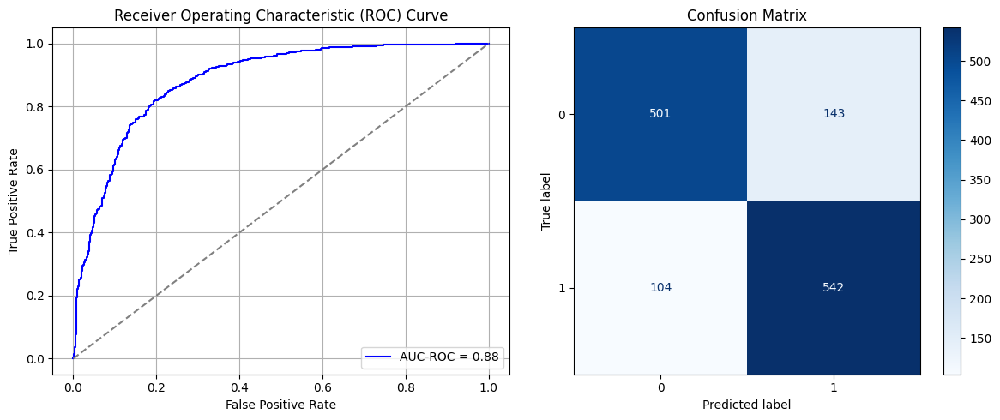

Best threshold based on F1-score: 0.38165774941444397
Time elapsed (performance): 13.744280381999488


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_747"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5229 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5230 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5232 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5233 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5235 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - AUC: 0.6487 - loss: 0.8132 - val_AUC: 0.0000e+00 - val_loss: 1.0894
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6999 - loss: 0.6187 - val_AUC: 0.0000e+00 - val_loss: 0.9945
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7114 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 1.0160
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6847 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6731 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 1.0014
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6916 - loss: 0.6151 - val_AUC: 0.0000e+00 - val_loss: 1.0000
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6918 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9564
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - AUC: 0.7305 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9114
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_748"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5236 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5237 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5239 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5240 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5242 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - AUC: 0.6539 - loss: 0.8174 - val_AUC: 0.0000e+00 - val_loss: 1.0769
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6947 - loss: 0.6238 - val_AUC: 0.0000e+00 - val_loss: 0.9661
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6608 - loss: 0.6454 - val_AUC: 0.0000e+00 - val_loss: 0.9865
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7023 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9887
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6748 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.9733
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7087 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7255 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9544
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7125 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 1.0122
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_749"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5243 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5244 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5246 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5247 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5249 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6609 - loss: 0.7934 - val_AUC: 0.0000e+00 - val_loss: 1.1353
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6878 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 1.0441
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6638 - loss: 0.6387 - val_AUC: 0.0000e+00 - val_loss: 0.9953
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7004 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.9633
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7035 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9904
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6913 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6914 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.9634
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7047 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9883
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_750"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5250 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5251 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5253 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5254 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5256 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6682 - loss: 0.7636 - val_AUC: 0.0000e+00 - val_loss: 1.1386
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6745 - loss: 0.6438 - val_AUC: 0.0000e+00 - val_loss: 1.0516
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6961 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.9872
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6884 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 0.9940
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6802 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 1.0048
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6896 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.9422
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7124 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.9561
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7103 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9419
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_751"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5257 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5258 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5260 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5261 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5263 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6554 - loss: 0.7724 - val_AUC: 0.0000e+00 - val_loss: 1.1378
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6592 - loss: 0.6682 - val_AUC: 0.0000e+00 - val_loss: 1.0523
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6735 - loss: 0.6345 - val_AUC: 0.0000e+00 - val_loss: 0.9710
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7068 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9407
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6959 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 1.0241
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6975 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.9757
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7078 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.9422
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6969 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_752"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5264 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5265 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5267 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5268 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5270 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6682 - loss: 0.7875 - val_AUC: 0.0000e+00 - val_loss: 1.1194
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6664 - loss: 0.6596 - val_AUC: 0.0000e+00 - val_loss: 0.9968
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6858 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.9623
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6940 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.9283
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6778 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.9406
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7117 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 1.0305
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6835 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.9740
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7189 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9569
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_753"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5271 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5272 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5274 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5275 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5277 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6509 - loss: 0.7895 - val_AUC: 0.0000e+00 - val_loss: 1.1002
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6871 - loss: 0.6432 - val_AUC: 0.0000e+00 - val_loss: 1.0120
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6784 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 1.0062
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6912 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9485
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6972 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6902 - loss: 0.6125 - val_AUC: 0.0000e+00 - val_loss: 0.9496
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7166 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9821
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6993 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_754"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5278 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5279 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5281 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5282 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5284 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6617 - loss: 0.7765 - val_AUC: 0.0000e+00 - val_loss: 1.1375
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6618 - loss: 0.6490 - val_AUC: 0.0000e+00 - val_loss: 0.9824
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6806 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 1.0076
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6967 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9251
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6749 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 1.0019
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7140 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7049 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7131 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.9261
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_755"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5285 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5286 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5288 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5289 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5291 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.6676 - loss: 0.7684 - val_AUC: 0.0000e+00 - val_loss: 1.1389
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6479 - loss: 0.6637 - val_AUC: 0.0000e+00 - val_loss: 1.0319
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6860 - loss: 0.6266 - val_AUC: 0.0000e+00 - val_loss: 1.0026
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6980 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.9834
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6862 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6781 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 0.9675
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7178 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9262
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7171 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_756"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5292 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5293 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5295 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5296 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5298 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6860 - loss: 0.7504 - val_AUC: 0.0000e+00 - val_loss: 1.1037
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6670 - loss: 0.6501 - val_AUC: 0.0000e+00 - val_loss: 1.0680
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6849 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6544 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.9566
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6957 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7045 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.9611
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6992 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7065 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.9299
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_757"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5299 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5300 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5302 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5303 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5305 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6592 - loss: 0.7733 - val_AUC: 0.0000e+00 - val_loss: 1.1271
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7061 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9987
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6864 - loss: 0.6219 - val_AUC: 0.0000e+00 - val_loss: 1.0013
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6793 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.9917
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6976 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9689
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7183 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9307
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7017 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7318 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9395
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_758"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5306 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5307 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5309 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5310 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5312 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6389 - loss: 0.7901 - val_AUC: 0.0000e+00 - val_loss: 1.1622
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6621 - loss: 0.6615 - val_AUC: 0.0000e+00 - val_loss: 1.0128
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6910 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.9596
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6894 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 1.0058
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7067 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6906 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7023 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 1.0413
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7083 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9894
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_759"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5313 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5314 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5316 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5317 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5319 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6513 - loss: 0.8000 - val_AUC: 0.0000e+00 - val_loss: 1.0725
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7083 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 1.0530
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6836 - loss: 0.6266 - val_AUC: 0.0000e+00 - val_loss: 1.0165
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6906 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.9788
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6742 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6883 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.9701
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7081 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9341
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7198 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_760"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5320 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5321 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5323 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5324 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5326 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6571 - loss: 0.8115 - val_AUC: 0.0000e+00 - val_loss: 1.0559
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6555 - loss: 0.6731 - val_AUC: 0.0000e+00 - val_loss: 1.0333
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6948 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9828
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6957 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 1.0251
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6849 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 1.0217
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6987 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6991 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6985 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9511
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_761"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5327 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5328 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5330 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5331 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5333 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6616 - loss: 0.7796 - val_AUC: 0.0000e+00 - val_loss: 1.1100
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6980 - loss: 0.6322 - val_AUC: 0.0000e+00 - val_loss: 1.0271
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6748 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 0.9626
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6808 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6965 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9526
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7143 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9922
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7005 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.9485
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7179 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9587
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_762"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5334 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5335 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5337 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5338 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5340 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6641 - loss: 0.7746 - val_AUC: 0.0000e+00 - val_loss: 1.1002
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6773 - loss: 0.6423 - val_AUC: 0.0000e+00 - val_loss: 1.0341
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6990 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9607
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6844 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.9596
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6845 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7079 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.9989
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6966 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9636
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7202 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 1.0253
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_763"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5341 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5342 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5344 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5345 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5347 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6618 - loss: 0.7919 - val_AUC: 0.0000e+00 - val_loss: 1.0280
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6637 - loss: 0.6650 - val_AUC: 0.0000e+00 - val_loss: 1.0635
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6908 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 1.0034
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6901 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.9597
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7049 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9660
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6982 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 1.0076
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6966 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7116 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_764"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5348 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5349 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5351 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5352 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5354 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6309 - loss: 0.8336 - val_AUC: 0.0000e+00 - val_loss: 1.0893
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6801 - loss: 0.6427 - val_AUC: 0.0000e+00 - val_loss: 1.0196
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6772 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 1.0441
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6984 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.9974
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6776 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 1.0540
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6965 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.9696
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6987 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9461
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7147 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.9963
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_765"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5355 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5356 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5358 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5359 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5361 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6475 - loss: 0.8025 - val_AUC: 0.0000e+00 - val_loss: 1.0602
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6583 - loss: 0.6604 - val_AUC: 0.0000e+00 - val_loss: 1.0306
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6940 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.9652
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6915 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9585
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6742 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.9467
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7026 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7028 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 1.0013
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7084 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_766"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5362 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5363 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5365 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5366 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5368 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6515 - loss: 0.8286 - val_AUC: 0.0000e+00 - val_loss: 1.0254
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6907 - loss: 0.6316 - val_AUC: 0.0000e+00 - val_loss: 1.0251
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6720 - loss: 0.6321 - val_AUC: 0.0000e+00 - val_loss: 1.0570
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6804 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.9930
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7211 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.9982
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6974 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.9742
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6909 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.9361
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7053 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.9414
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

In [200]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRSwR = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRSwR, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


In [201]:
print(ParamFit)
ParamFit.to_csv('SRSwR_Fine_Tuning.csv')

         FPR       FNR
0   0.248260  0.422145
1   0.204950  0.480969
2   0.170147  0.553633
3   0.242073  0.425606
4   0.229698  0.442907
..       ...       ...
95  0.198763  0.532872
96  0.171694  0.577855
97  0.180974  0.557093
98  0.181748  0.560554
99  0.159319  0.605536

[100 rows x 2 columns]


In [202]:
ParamFit['FNR'].mean()

np.float64(0.4672318339100346)

## Systematic Sampling:

First, we select a single systematic sample from the majority class, in which $k = \frac{N_0}{N_1}$, where $N_0$ is the majority class size in the source domain and $N_1$ is the minority class in the source domain.

In [203]:
X_S_Sy, y_S_Sy = systematic_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_undersampler(T_train, T_train.iloc[:, -1])
print(y_T_train_Sy)


3224
32062
9.944789081885856
4
[3, 12, 22, 32, 42, 52, 62, 72, 82, 92, 102, 112, 122, 132, 142, 152, 162, 172, 182, 191, 201, 211, 221, 231, 241, 251, 261, 271, 281, 291, 301, 311, 321, 331, 341, 351, 361, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510, 520, 530, 540, 549, 559, 569, 579, 589, 599, 609, 619, 629, 639, 649, 659, 669, 679, 689, 699, 709, 719, 728, 738, 748, 758, 768, 778, 788, 798, 808, 818, 828, 838, 848, 858, 868, 878, 888, 898, 907, 917, 927, 937, 947, 957, 967, 977, 987, 997, 1007, 1017, 1027, 1037, 1047, 1057, 1067, 1077, 1086, 1096, 1106, 1116, 1126, 1136, 1146, 1156, 1166, 1176, 1186, 1196, 1206, 1216, 1226, 1236, 1246, 1256, 1265, 1275, 1285, 1295, 1305, 1315, 1325, 1335, 1345, 1355, 1365, 1375, 1385, 1395, 1405, 1415, 1425, 1435, 1444, 1454, 1464, 1474, 1484, 1494, 1504, 1514, 1524, 1534, 1544, 1554, 1564, 1574, 1584, 1594, 1604, 1614, 1624, 1633, 1643, 1653, 1663, 1673, 1683, 1693, 1703, 1713, 1723, 1733, 1743, 1753, 1763, 1773, 1783, 

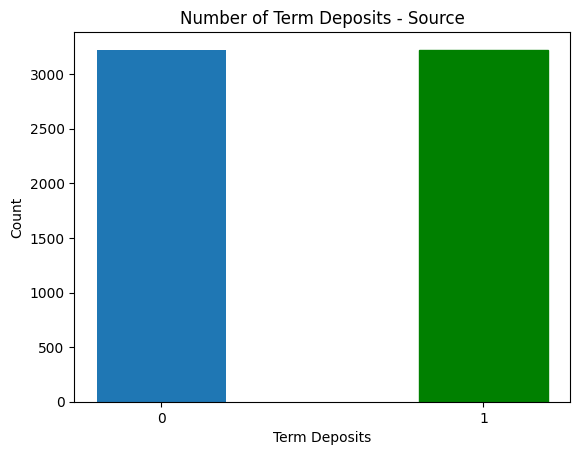

In [204]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Term Deposits")
plt.ylabel("Count")
plt.title("Number of Term Deposits - Source")
plt.show()

In [205]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (5158, 15)
y_S_train: (5158,)
X_S_test: (1290, 15)
y_S_test: (1290,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_767"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5369 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5370 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5372 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5373 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5375 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.5920 - loss: 0.6786 - val_AUC: 0.7926 - val_loss: 0.5574
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8116 - loss: 0.5327 - val_AUC: 0.8675 - val_loss: 0.5369
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8599 - loss: 0.4705 - val_AUC: 0.8774 - val_loss: 0.4750
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8896 - loss: 0.4184 - val_AUC: 0.8771 - val_loss: 0.4393
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8864 - loss: 0.4229 - val_AUC: 0.8821 - val_loss: 0.4326
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8935 - loss: 0.4088 - val_AUC: 0.8828 - val_loss: 0.4580
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8935 - loss: 0.4071 - val_AUC: 0.8829 - val_loss: 0.4302
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9011 - loss: 0.3938 - val_AUC: 0.8820 - val_loss: 0.4232
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

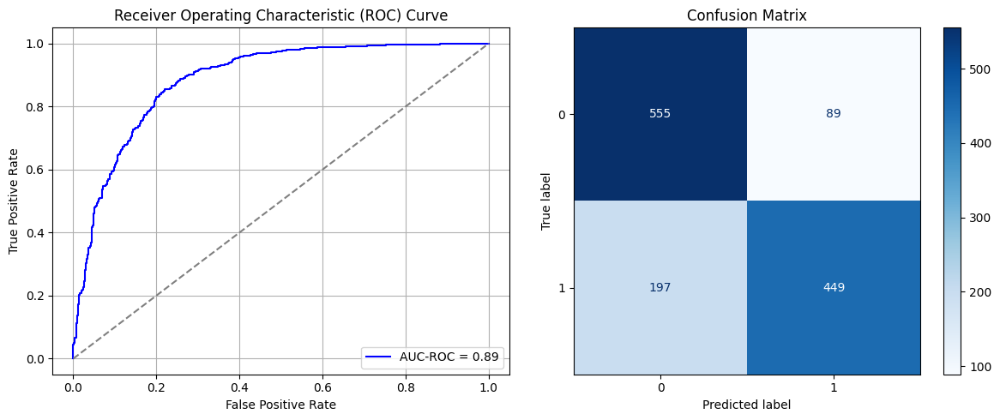

Best threshold based on F1-score: 0.21936078369617462
Time elapsed (performance): 11.864379720000215


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_768"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5376 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5377 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5379 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5380 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5382 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6909 - loss: 0.6729 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6737 - loss: 0.6287 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6842 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6938 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.9933
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7096 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7042 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7055 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9192
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_769"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5383 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5384 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5386 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5387 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5389 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6811 - loss: 0.6979 - val_AUC: 0.0000e+00 - val_loss: 1.0307
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6740 - loss: 0.6413 - val_AUC: 0.0000e+00 - val_loss: 0.9539
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6968 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6897 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.9503
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7059 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9987
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7258 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9539
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_770"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5390 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5391 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5393 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5394 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5396 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6963 - loss: 0.6718 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6914 - loss: 0.6191 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7113 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9443
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7000 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.9405
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6935 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.9766
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7080 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9122
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_771"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5397 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5398 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5400 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5401 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5403 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.6771 - loss: 0.7108 - val_AUC: 0.0000e+00 - val_loss: 1.0044
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6876 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7087 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7033 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7086 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9578
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7129 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6963 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9676
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6930 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_772"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5404 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5405 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5407 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5408 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5410 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6867 - loss: 0.6885 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6881 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.9389
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6943 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6975 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9664
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6919 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.9862
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6968 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9700
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7195 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.9884
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_773"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5411 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5412 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5413 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5414 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5415 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5417 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.6940 - loss: 0.6731 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6998 - loss: 0.6149 - val_AUC: 0.0000e+00 - val_loss: 0.9618
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6954 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6890 - loss: 0.6172 - val_AUC: 0.0000e+00 - val_loss: 0.9581
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6929 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9267
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7035 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9719
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7109 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.9590
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6994 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9459
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_774"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5418 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5419 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5420 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5421 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5422 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5424 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7109 - loss: 0.6673 - val_AUC: 0.0000e+00 - val_loss: 1.0271
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7002 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.9549
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6971 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9253
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7036 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.9534
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6861 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8589
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6979 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6936 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7206 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_775"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5425 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5426 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5427 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5428 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5429 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5431 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6998 - loss: 0.6691 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6939 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 0.9471
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7045 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9802
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7013 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7051 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9434
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7008 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7128 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7053 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_776"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5432 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5433 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5434 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5435 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5436 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5438 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6848 - loss: 0.6921 - val_AUC: 0.0000e+00 - val_loss: 0.9294
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7071 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6781 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.9515
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9459
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7146 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.9935
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_777"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5439 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5440 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5441 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5442 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5443 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5445 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6974 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 0.9391
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6901 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7106 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9285
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6844 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.9635
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6908 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9832
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7032 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.9517
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7041 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9715
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7017 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_778"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5446 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5447 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5448 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5449 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5450 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5452 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6841 - loss: 0.6917 - val_AUC: 0.0000e+00 - val_loss: 0.9598
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6753 - loss: 0.6370 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6924 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7042 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7055 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.9574
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7091 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6974 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6868 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_779"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5453 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5454 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5455 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5456 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5457 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5459 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.6814 - loss: 0.6944 - val_AUC: 0.0000e+00 - val_loss: 0.9431
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6661 - loss: 0.6402 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6970 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 1.0162
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6998 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6905 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.9239
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7033 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7068 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 1.0020
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6955 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_780"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5460 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5461 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5462 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5463 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5464 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5466 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6913 - loss: 0.6843 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6776 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7038 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7039 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.9616
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7015 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6801 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.9636
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7052 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7086 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_781"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5467 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5468 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5469 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5470 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5471 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5472 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5473 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.6998 - loss: 0.6739 - val_AUC: 0.0000e+00 - val_loss: 0.9425
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6992 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6784 - loss: 0.6249 - val_AUC: 0.0000e+00 - val_loss: 0.9906
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6940 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.9239
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7093 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6820 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.9515
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_782"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5474 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5475 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5476 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5477 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5478 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5479 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5480 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6852 - loss: 0.7039 - val_AUC: 0.0000e+00 - val_loss: 0.9333
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7037 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.9178
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6841 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6988 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.9432
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6837 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6956 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7124 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9523
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7080 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_783"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5481 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5482 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5483 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5484 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5485 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5486 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5487 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6929 - loss: 0.6739 - val_AUC: 0.0000e+00 - val_loss: 0.9428
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6946 - loss: 0.6226 - val_AUC: 0.0000e+00 - val_loss: 1.0063
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7018 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.9433
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6875 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.9467
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7179 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6958 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.9930
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6922 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6990 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 1.0325
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_784"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5488 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5489 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5490 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5491 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5492 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5493 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5494 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7097 - loss: 0.6558 - val_AUC: 0.0000e+00 - val_loss: 0.9272
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6954 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6776 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6996 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 1.0238
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7205 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9648
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7004 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9199
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7073 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7149 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_785"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5495 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5496 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5497 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5498 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5499 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5500 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5501 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7183 - loss: 0.6424 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6757 - loss: 0.6311 - val_AUC: 0.0000e+00 - val_loss: 0.9471
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6925 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6963 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6965 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 1.0126
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6791 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.9202
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6993 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.9557
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_786"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5502 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5503 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5504 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5505 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5506 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5507 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5508 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6735 - loss: 0.7146 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6924 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6848 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.9837
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6976 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7044 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6859 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9901
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7185 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_787"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5509 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5510 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5511 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5512 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5513 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5514 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5515 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6794 - loss: 0.6984 - val_AUC: 0.0000e+00 - val_loss: 0.9667
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6764 - loss: 0.6299 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6912 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6799 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7204 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9568
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6916 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.9524
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6931 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_788"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5516 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5517 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5518 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5519 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5520 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5521 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5522 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.5748 - loss: 0.6823 - val_AUC: 0.7325 - val_loss: 0.6183
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7694 - loss: 0.5736 - val_AUC: 0.8662 - val_loss: 0.4616
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8723 - loss: 0.4507 - val_AUC: 0.8739 - val_loss: 0.4624
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8871 - loss: 0.4241 - val_AUC: 0.8749 - val_loss: 0.4779
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8998 - loss: 0.3987 - val_AUC: 0.8798 - val_loss: 0.4289
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9014 - loss: 0.3949 - val_AUC: 0.8785 - val_loss: 0.4313
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8947 - loss: 0.4070 - val_AUC: 0.8837 - val_loss: 0.4296
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8959 - loss: 0.4045 - val_AUC: 0.8776 - val_loss: 0.4306
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - 

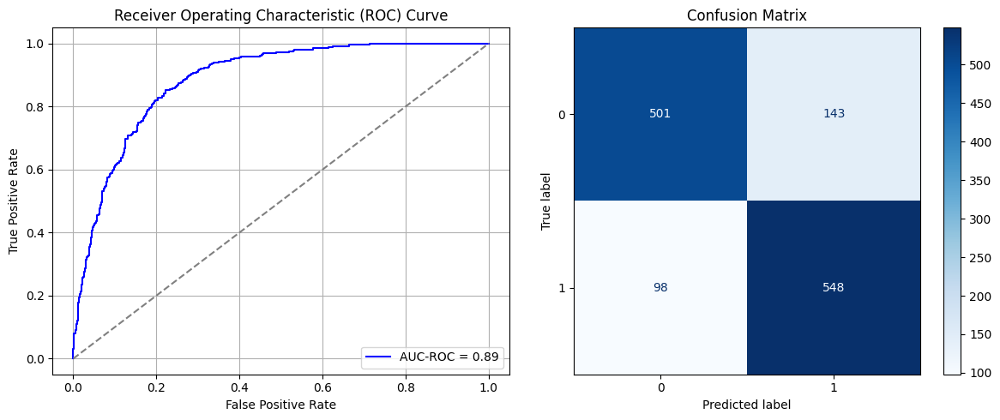

Best threshold based on F1-score: 0.3018355667591095
Time elapsed (performance): 11.228855666000527


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_789"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5523 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5524 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5525 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5526 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5527 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5528 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5529 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6733 - loss: 0.6685 - val_AUC: 0.0000e+00 - val_loss: 0.9157
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6919 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9421
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7423 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9418
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7540 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 1.0083
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7334 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7437 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9765
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7591 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_790"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5530 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5531 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5532 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5533 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5534 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5535 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5536 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6693 - loss: 0.6820 - val_AUC: 0.0000e+00 - val_loss: 0.9641
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6823 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.9465
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7126 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7453 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.9604
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7312 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7550 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_791"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5537 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5538 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5539 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5540 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5541 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5542 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5543 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6651 - loss: 0.6971 - val_AUC: 0.0000e+00 - val_loss: 0.9852
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7063 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7217 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7235 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9377
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7391 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9354
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7484 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7519 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.9550
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7444 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_792"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5544 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5545 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5546 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5547 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5548 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5549 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5550 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6769 - loss: 0.6722 - val_AUC: 0.0000e+00 - val_loss: 0.9349
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6994 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7233 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7392 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7207 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9475
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7497 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7367 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7649 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_793"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5551 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5552 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5553 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5554 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5555 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5556 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5557 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6539 - loss: 0.7011 - val_AUC: 0.0000e+00 - val_loss: 0.9381
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6997 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7055 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7335 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7394 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7268 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7478 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_794"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5558 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5559 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5560 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5561 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5562 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5563 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5564 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6521 - loss: 0.6961 - val_AUC: 0.0000e+00 - val_loss: 0.9410
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6766 - loss: 0.6227 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7233 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7211 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8869
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7334 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7620 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7627 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_795"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5565 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5566 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5567 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5568 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5569 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5570 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5571 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6647 - loss: 0.6842 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6970 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.9471
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6938 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7062 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7437 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7351 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.7652
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7417 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9489
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7635 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_796"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5572 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5573 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5574 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5575 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5576 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5577 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5578 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6535 - loss: 0.6913 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6793 - loss: 0.6187 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7134 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7457 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7567 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7352 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7610
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7443 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_797"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5579 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5580 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5581 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5582 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5583 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5584 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5585 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6733 - loss: 0.6747 - val_AUC: 0.0000e+00 - val_loss: 1.0088
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6849 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7335 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7508 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.9790
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7441 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_798"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5586 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5587 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5588 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5589 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5590 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5591 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5592 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6497 - loss: 0.6985 - val_AUC: 0.0000e+00 - val_loss: 0.9186
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7001 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7097 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7203 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7325 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.9024
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7579 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.9443
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7395 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9467
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7578 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_799"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5593 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5594 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5595 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5596 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5597 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5598 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5599 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6815 - loss: 0.6700 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6711 - loss: 0.6344 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7233 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7448 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7563 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7499 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7414 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_800"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5600 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5601 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5602 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5603 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5604 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5605 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5606 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6917 - loss: 0.6495 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6904 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7123 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9502
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7409 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9579
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7514 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9264
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7566 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7546 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7631 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_801"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5607 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5608 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5609 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5610 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5611 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5612 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5613 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6781 - loss: 0.6674 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6854 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7033 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7232 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7518 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9187
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7518 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.9503
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_802"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5614 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5615 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5616 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5617 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5618 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5619 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5620 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6995 - loss: 0.6540 - val_AUC: 0.0000e+00 - val_loss: 0.9270
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6803 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7144 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7465 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7314 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9581
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7373 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9510
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7387 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7450 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_803"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5621 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5622 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5623 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5624 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5625 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5626 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5627 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6472 - loss: 0.7031 - val_AUC: 0.0000e+00 - val_loss: 1.0130
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7005 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7079 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7243 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9654
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7461 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9186
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7436 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7426 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_804"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5628 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5629 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5630 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5631 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5632 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5633 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5634 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6915 - loss: 0.6541 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6818 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7304 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6999 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7361 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9340
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7549 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.9207
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7402 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.9149
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7524 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8454
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_805"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5635 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5636 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5637 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5638 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5639 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5640 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5641 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6555 - loss: 0.6995 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6705 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7192 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7340 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.9681
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7304 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.7751
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.7787
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7393 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7500 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_806"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5642 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5643 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5644 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5645 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5646 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5647 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5648 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6502 - loss: 0.7072 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6803 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7185 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.9904
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7241 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8290
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7528 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7420 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7500 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_807"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5649 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5650 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5651 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5652 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5653 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5654 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5655 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6686 - loss: 0.6856 - val_AUC: 0.0000e+00 - val_loss: 0.9387
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6804 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7306 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7261 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7479 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7778
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7440 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_808"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5656 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5657 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5658 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5659 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5660 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5661 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5662 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6724 - loss: 0.6764 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6920 - loss: 0.6151 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7198 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7238 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7397 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7531 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7608 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7561 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_809"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5663 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5664 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5665 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5666 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5667 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5668 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5669 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6313 - loss: 0.6719 - val_AUC: 0.7116 - val_loss: 0.6231
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7763 - loss: 0.5715 - val_AUC: 0.8629 - val_loss: 0.4682
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8694 - loss: 0.4545 - val_AUC: 0.8737 - val_loss: 0.4796
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8717 - loss: 0.4516 - val_AUC: 0.8774 - val_loss: 0.4338
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8939 - loss: 0.4084 - val_AUC: 0.8779 - val_loss: 0.4512
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8962 - loss: 0.4028 - val_AUC: 0.8795 - val_loss: 0.4299
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9081 - loss: 0.3863 - val_AUC: 0.8838 - val_loss: 0.4248
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8949 - loss: 0.4041 - val_AUC: 0.8822 - val_loss: 0.4269
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

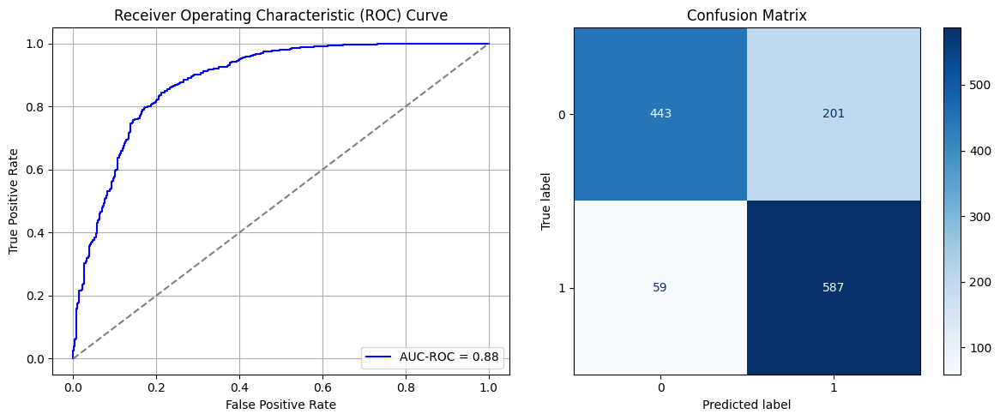

Best threshold based on F1-score: 0.6733364462852478
Time elapsed (performance): 13.062214143999881


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_810"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5670 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5671 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5672 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5673 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5674 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5675 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5676 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6333 - loss: 0.8079 - val_AUC: 0.0000e+00 - val_loss: 1.0292
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6479 - loss: 0.6566 - val_AUC: 0.0000e+00 - val_loss: 1.0221
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6661 - loss: 0.6371 - val_AUC: 0.0000e+00 - val_loss: 1.0072
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6698 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6820 - loss: 0.6227 - val_AUC: 0.0000e+00 - val_loss: 0.9821
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6763 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.9463
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7018 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.9416
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7093 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_811"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5677 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5678 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5680 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5681 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5682 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5683 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6511 - loss: 0.7984 - val_AUC: 0.0000e+00 - val_loss: 1.0280
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6573 - loss: 0.6347 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6843 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.9595
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6672 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6770 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7042 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9250
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7083 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7094 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.9595
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_812"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5684 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5685 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5687 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5688 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5689 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5690 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6551 - loss: 0.8036 - val_AUC: 0.0000e+00 - val_loss: 1.0827
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6381 - loss: 0.6618 - val_AUC: 0.0000e+00 - val_loss: 0.9998
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6717 - loss: 0.6251 - val_AUC: 0.0000e+00 - val_loss: 0.9813
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6698 - loss: 0.6191 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6931 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9513
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7073 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.9431
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6960 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7152 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_813"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5691 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5692 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5694 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5695 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5696 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5697 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6537 - loss: 0.8002 - val_AUC: 0.0000e+00 - val_loss: 1.0185
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6609 - loss: 0.6418 - val_AUC: 0.0000e+00 - val_loss: 0.9788
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6713 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.9965
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6793 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 0.9999
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6667 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6943 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.9430
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7140 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7123 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_814"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5698 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5699 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5701 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5702 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5703 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5704 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6457 - loss: 0.8307 - val_AUC: 0.0000e+00 - val_loss: 1.0791
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6761 - loss: 0.6298 - val_AUC: 0.0000e+00 - val_loss: 0.9844
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6624 - loss: 0.6243 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6643 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6968 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7029 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6914 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7158 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9912
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_815"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5705 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5706 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5708 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5709 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5710 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5711 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6393 - loss: 0.8212 - val_AUC: 0.0000e+00 - val_loss: 1.0615
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6418 - loss: 0.6613 - val_AUC: 0.0000e+00 - val_loss: 1.0085
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6420 - loss: 0.6447 - val_AUC: 0.0000e+00 - val_loss: 0.9624
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6966 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.9534
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7093 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7164 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6990 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7047 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.9500
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_816"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5712 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5713 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5715 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5716 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5717 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5718 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6721 - loss: 0.7755 - val_AUC: 0.0000e+00 - val_loss: 1.0848
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6598 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.9540
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6565 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 0.9677
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6620 - loss: 0.6358 - val_AUC: 0.0000e+00 - val_loss: 0.9777
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6847 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6649 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9301
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6938 - loss: 0.6114 - val_AUC: 0.0000e+00 - val_loss: 1.0386
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9386
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_817"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5719 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5720 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5722 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5723 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5724 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5725 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6553 - loss: 0.7914 - val_AUC: 0.0000e+00 - val_loss: 1.0592
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6437 - loss: 0.6605 - val_AUC: 0.0000e+00 - val_loss: 1.0413
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6668 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6621 - loss: 0.6299 - val_AUC: 0.0000e+00 - val_loss: 0.9341
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7046 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6924 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6805 - loss: 0.6172 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7153 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9948
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_818"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5726 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5727 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5729 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5730 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5731 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5732 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6575 - loss: 0.7851 - val_AUC: 0.0000e+00 - val_loss: 1.0551
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6702 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 0.9354
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6583 - loss: 0.6394 - val_AUC: 0.0000e+00 - val_loss: 0.9899
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6824 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6609 - loss: 0.6247 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6848 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9334
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6986 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 1.0031
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7122 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_819"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5733 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5734 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5736 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5737 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5738 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5739 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6390 - loss: 0.8081 - val_AUC: 0.0000e+00 - val_loss: 1.0573
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6682 - loss: 0.6446 - val_AUC: 0.0000e+00 - val_loss: 1.0234
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6572 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6706 - loss: 0.6187 - val_AUC: 0.0000e+00 - val_loss: 0.9214
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6812 - loss: 0.6165 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6802 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6761 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6843 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_820"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5740 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5741 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5743 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5744 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5745 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5746 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6361 - loss: 0.8209 - val_AUC: 0.0000e+00 - val_loss: 1.0241
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6438 - loss: 0.6554 - val_AUC: 0.0000e+00 - val_loss: 0.9550
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6403 - loss: 0.6391 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6700 - loss: 0.6243 - val_AUC: 0.0000e+00 - val_loss: 1.0086
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6906 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.9798
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6917 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.9886
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6715 - loss: 0.6230 - val_AUC: 0.0000e+00 - val_loss: 0.9646
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7123 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 1.0337
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_821"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5747 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5748 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5750 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5751 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5752 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5753 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6315 - loss: 0.8320 - val_AUC: 0.0000e+00 - val_loss: 0.9943
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6538 - loss: 0.6388 - val_AUC: 0.0000e+00 - val_loss: 0.9571
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6718 - loss: 0.6314 - val_AUC: 0.0000e+00 - val_loss: 0.9870
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6710 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.9504
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6898 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.9704
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6806 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6877 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7011 - loss: 0.6164 - val_AUC: 0.0000e+00 - val_loss: 1.1236
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_822"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5754 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5755 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5757 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5758 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5759 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5760 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6531 - loss: 0.7920 - val_AUC: 0.0000e+00 - val_loss: 1.0649
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6506 - loss: 0.6375 - val_AUC: 0.0000e+00 - val_loss: 0.9418
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6540 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6500 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 0.9318
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6942 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.9423
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6721 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7016 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7328 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 1.0512
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_823"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5761 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5762 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5764 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5765 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5766 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5767 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.6451 - loss: 0.8034 - val_AUC: 0.0000e+00 - val_loss: 1.0689
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6761 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9412
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6331 - loss: 0.6476 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7013 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6861 - loss: 0.6151 - val_AUC: 0.0000e+00 - val_loss: 0.9770
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7008 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.9746
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7024 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8634
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6921 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_824"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5768 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5769 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5771 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5772 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5773 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5774 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6674 - loss: 0.7832 - val_AUC: 0.0000e+00 - val_loss: 1.1407
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6543 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 0.9729
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6912 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6835 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6821 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.9816
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6933 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6947 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7089 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 1.0068
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_825"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5775 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5776 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5778 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5779 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5780 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5781 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6465 - loss: 0.8151 - val_AUC: 0.0000e+00 - val_loss: 1.0610
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6652 - loss: 0.6356 - val_AUC: 0.0000e+00 - val_loss: 0.9564
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6750 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.9322
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6766 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9907
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6904 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9713
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6847 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6920 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6795 - loss: 0.6215 - val_AUC: 0.0000e+00 - val_loss: 0.9577
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_826"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5782 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5783 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5785 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5786 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5787 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5788 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6245 - loss: 0.8363 - val_AUC: 0.0000e+00 - val_loss: 1.0290
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6712 - loss: 0.6321 - val_AUC: 0.0000e+00 - val_loss: 0.9610
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6793 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.9977
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6696 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.9571
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6854 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.9558
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6915 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6998 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6962 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_827"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5789 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5790 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5792 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5793 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5794 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5795 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6593 - loss: 0.8013 - val_AUC: 0.0000e+00 - val_loss: 1.0589
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6804 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.9703
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6716 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.9850
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6630 - loss: 0.6344 - val_AUC: 0.0000e+00 - val_loss: 0.9520
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6769 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6898 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9553
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6643 - loss: 0.6306 - val_AUC: 0.0000e+00 - val_loss: 1.0391
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6908 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9527
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_828"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5796 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5797 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5799 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5800 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5801 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5802 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6589 - loss: 0.7713 - val_AUC: 0.0000e+00 - val_loss: 1.0595
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6752 - loss: 0.6226 - val_AUC: 0.0000e+00 - val_loss: 0.9738
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6900 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.9878
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6883 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6696 - loss: 0.6188 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6997 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 0.9470
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7022 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.9576
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6923 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_829"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5803 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5804 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5806 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5807 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5808 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5809 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6490 - loss: 0.8168 - val_AUC: 0.0000e+00 - val_loss: 1.0395
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6740 - loss: 0.6270 - val_AUC: 0.0000e+00 - val_loss: 0.9625
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6816 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 1.0006
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6620 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6839 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7011 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7054 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.9729
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7060 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_830"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5810 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5811 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5813 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5814 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5815 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5816 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - AUC: 0.5828 - loss: 0.6852 - val_AUC: 0.7060 - val_loss: 0.6287
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7681 - loss: 0.5756 - val_AUC: 0.8659 - val_loss: 0.4656
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8598 - loss: 0.4697 - val_AUC: 0.8717 - val_loss: 0.4466
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8882 - loss: 0.4197 - val_AUC: 0.8763 - val_loss: 0.4452
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8891 - loss: 0.4179 - val_AUC: 0.8774 - val_loss: 0.4361
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8899 - loss: 0.4156 - val_AUC: 0.8796 - val_loss: 0.4374
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8899 - loss: 0.4156 - val_AUC: 0.8801 - val_loss: 0.4308
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9009 - loss: 0.3974 - val_AUC: 0.8819 - val_loss: 0.4254
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

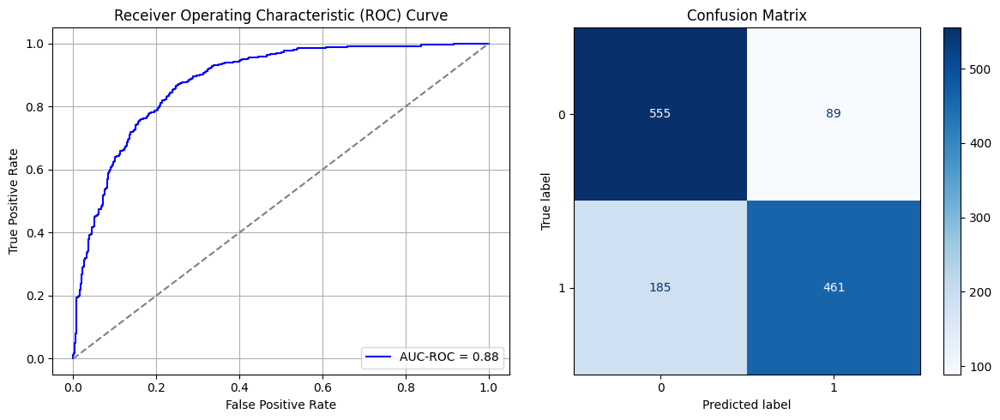

Best threshold based on F1-score: 0.11144176870584488
Time elapsed (performance): 13.56816880400038


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_831"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5817 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5818 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5820 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5821 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5822 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5823 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7308 - loss: 0.6860 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7214 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7177 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7105 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7183 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7151 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7178 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.9499
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_832"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5824 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5825 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5827 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5828 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5829 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5830 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7048 - loss: 0.7443 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7308 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7084 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7090 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7254 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_833"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5831 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5832 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5834 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5835 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5836 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5837 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7011 - loss: 0.7379 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7006 - loss: 0.6214 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7277 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7205 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7359 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7283 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6932 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7127 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_834"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5838 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5839 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5841 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5842 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5843 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5844 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7103 - loss: 0.7287 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7091 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7335 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7311 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7354 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7177 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_835"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5845 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5846 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5848 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5849 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5850 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5851 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7290 - loss: 0.6672 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7251 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7006 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7260 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7338 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7260 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7381 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7420 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_836"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5852 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5853 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5855 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5856 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5857 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5858 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7304 - loss: 0.6770 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7269 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7194 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7237 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7253 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8450
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7314 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7292 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7255 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_837"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5859 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5860 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5862 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5863 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5864 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5865 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7154 - loss: 0.7106 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7378 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7387 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7321 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7469 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7505 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8243
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_838"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5866 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5867 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5869 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5870 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5871 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5872 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7206 - loss: 0.7035 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7206 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9410
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7218 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9480
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7134 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7276 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 1.0258
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6858 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7090 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7113 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9391
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_839"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5873 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5874 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5876 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5877 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5878 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5879 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7298 - loss: 0.6847 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7402 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7208 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9670
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7306 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7245 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7429 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_840"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5880 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5881 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5883 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5884 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5885 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5886 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7148 - loss: 0.7037 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7383 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7051 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7239 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9671
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7321 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9331
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7207 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_841"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5887 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5888 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5890 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5891 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5892 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5893 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7194 - loss: 0.6922 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7218 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.9779
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7377 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7203 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9253
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7110 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7341 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.9550
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6987 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7454 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_842"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5894 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5895 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5897 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5898 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5899 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5900 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7257 - loss: 0.6879 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7191 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7164 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7310 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7201 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7241 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7211 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.9984
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_843"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5901 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5902 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5904 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5905 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5906 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5907 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7234 - loss: 0.6816 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7093 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7200 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9718
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7366 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9251
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7306 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9791
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7363 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7349 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_844"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5908 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5909 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5911 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5912 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5913 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5914 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7126 - loss: 0.6961 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7183 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9397
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7128 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7264 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7319 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7119 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9454
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7292 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7218 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_845"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5915 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5916 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5918 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5919 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5920 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5921 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7249 - loss: 0.6957 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7406 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7185 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9472
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7351 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7262 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7230 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9451
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7177 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.7801
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_846"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5922 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5923 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5925 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5926 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5927 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5928 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7179 - loss: 0.7006 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7079 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7380 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7223 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9572
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7109 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7187 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7438 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7238 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8232
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_847"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5929 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5930 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5932 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5933 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5934 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5935 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7183 - loss: 0.7078 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7108 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7162 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6981 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7326 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7283 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7086 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 1.0569
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_848"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5936 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5937 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5939 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5940 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5941 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5942 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7206 - loss: 0.7002 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7040 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7161 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7164 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7367 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9677
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7433 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.9374
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7258 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7278 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.9407
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_849"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5943 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5944 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5945 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5946 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5947 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5948 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5949 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6898 - loss: 0.7352 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7091 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7041 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7335 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7368 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7181 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7279 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7351 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_850"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5950 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5951 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5952 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5953 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5954 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5955 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5956 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7287 - loss: 0.6686 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7188 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7172 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7203 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7328 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7214 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7311 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7215 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_851"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5957 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5958 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5959 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5960 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5961 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5962 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5963 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6070 - loss: 0.6757 - val_AUC: 0.7634 - val_loss: 0.5976
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8154 - loss: 0.5298 - val_AUC: 0.8708 - val_loss: 0.4476
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8853 - loss: 0.4269 - val_AUC: 0.8684 - val_loss: 0.4569
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8817 - loss: 0.4337 - val_AUC: 0.8725 - val_loss: 0.4955
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8960 - loss: 0.4054 - val_AUC: 0.8754 - val_loss: 0.4425
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9006 - loss: 0.3933 - val_AUC: 0.8764 - val_loss: 0.4352
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8978 - loss: 0.3981 - val_AUC: 0.8804 - val_loss: 0.4419
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8993 - loss: 0.3978 - val_AUC: 0.8804 - val_loss: 0.4368
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

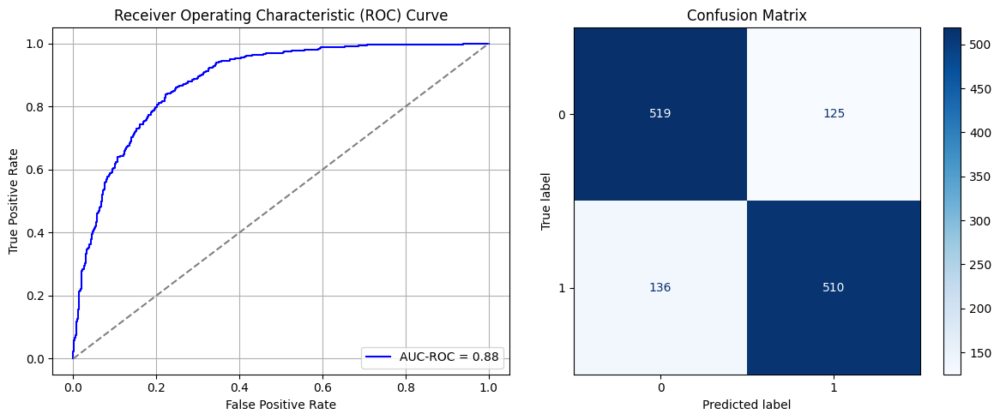

Best threshold based on F1-score: 0.17101594805717468
Time elapsed (performance): 15.820706616999814


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_852"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5964 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5965 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5966 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5967 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5968 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5969 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5970 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7039 - loss: 0.7126 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7045 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6895 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7307 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7418 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9247
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7326 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7293 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7372 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_853"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5971 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5972 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5973 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5974 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5975 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5976 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5977 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.7178 - loss: 0.6823 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7159 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.9489
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7439 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7434 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7053 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7223 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7318 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9684
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.9332
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_854"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5978 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5979 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5980 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5981 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5982 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5983 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5984 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7091 - loss: 0.7009 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7068 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7360 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7426 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.9255
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7369 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7389 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_855"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5985 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5986 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5987 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5988 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5989 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5990 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5991 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7492 - loss: 0.6262 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7209 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7337 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8544
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7172 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7240 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7434 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7293 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7327 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8516
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_856"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5992 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5993 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5994 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5995 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5996 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5997 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5998 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7337 - loss: 0.6406 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7029 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7360 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7363 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7264 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7268 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7337 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7350 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_857"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5999 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6000 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6001 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6002 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6005 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7021 - loss: 0.7098 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7233 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9795
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7195 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7206 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7156 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7177 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7179 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7429 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_858"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6006 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6007 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6008 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6009 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6012 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7147 - loss: 0.6818 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7109 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9522
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7114 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8784
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7302 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7126 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.9493
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7344 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_859"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6013 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6014 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6015 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6016 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6019 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7051 - loss: 0.6869 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7276 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9344
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7529 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7053 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7211 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7407 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7527 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_860"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6020 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6021 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6022 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6023 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6026 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7266 - loss: 0.6689 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7103 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7379 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7293 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7420 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7591 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_861"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6027 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6028 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6029 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6030 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6033 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7160 - loss: 0.6799 - val_AUC: 0.0000e+00 - val_loss: 0.8135
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7175 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6929 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7314 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7347 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7367 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7420 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_862"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6034 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6035 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6036 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6037 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6040 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7053 - loss: 0.7231 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6983 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7035 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7141 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8634
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7181 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9532
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7341 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7325 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_863"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6041 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6042 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6043 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6044 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6047 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7149 - loss: 0.6908 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7456 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7148 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7309 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7221 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9492
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7262 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7339 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.9856
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7412 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_864"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6048 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6049 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6050 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6051 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6054 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 19s 16ms/step - AUC: 0.6996 - loss: 0.6938 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7273 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7294 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9558
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7537 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7353 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7336 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7532 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8544
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7354 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_865"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6055 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6056 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6057 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6058 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6061 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7082 - loss: 0.7002 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6975 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7214 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7379 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7252 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7367 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7303 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7464 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_866"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6062 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6063 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6064 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6065 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6068 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7114 - loss: 0.6818 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7105 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7185 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7307 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7291 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7132 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7360 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9159
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7548 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_867"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6069 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6070 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6071 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6072 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6075 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7114 - loss: 0.6973 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7226 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7291 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7272 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8869
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7449 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7232 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7342 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7653 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.8258
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_868"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6076 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6077 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6078 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6079 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6082 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7046 - loss: 0.6959 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7310 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9230
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7318 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7280 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7280 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.9635
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7386 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7429 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7263 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9272
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_869"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6083 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6084 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6085 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6086 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6089 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7226 - loss: 0.6725 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7246 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7257 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7306 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9419
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7245 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9272
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7214 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7319 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.9573
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7425 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_870"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6090 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6091 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6092 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6093 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6096 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7122 - loss: 0.6887 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7206 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7338 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7134 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9731
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7322 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9618
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7333 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7274 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7430 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_871"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6097 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6098 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6099 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6100 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6103 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7084 - loss: 0.6911 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7141 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7296 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7125 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7444 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.9845
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7323 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7239 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7428 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.9451
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

In [206]:
times_train = 5
times_fine_tune = 20


FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [207]:
print(ParamFit)
ParamFit.to_csv('Sy_Fine_Tuning.csv')

         FPR       FNR
0   0.237432  0.460208
1   0.225831  0.491349
2   0.214230  0.508651
3   0.215004  0.515571
4   0.209590  0.515571
..       ...       ...
95  0.199536  0.453287
96  0.247486  0.349481
97  0.255220  0.328720
98  0.186388  0.491349
99  0.235112  0.377163

[100 rows x 2 columns]


In [208]:
ParamFit['FNR'].mean()

np.float64(0.4587197231833909)

## Systematic Sampling (multiple samples):

Now, we investigate the possibility of conducting $m$ systematic samples, each with a sampling interval of $k=m*\frac{N_0}{N_1}$, and obtaining the undersampled majority class data using all $m$ systematic samples combined. This may more closely approximate SRS sampling.

For convenience, we take $m=2$ in this case, since any larger yields a very good source-training performance but correspondingly very bad target prediction and fine-tuning performance.

In [47]:
X_S_Sy, y_S_Sy = multi_systematic_undersampler(data_S_full, data_S_full.iloc[:,-1], 2)
# print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = multi_systematic_undersampler(T_train, T_train.iloc[:,-1], 2)
print(y_T_train_Sy)

3224
32062
9.944789081885856
[5, 14, 24, 34, 44, 54, 64, 74, 84, 94, 104, 114, 124, 134, 144, 154, 164, 174, 184, 193, 203, 213, 223, 233, 243, 253, 263, 273, 283, 293, 303, 313, 323, 333, 343, 353, 363, 372, 382, 392, 402, 412, 422, 432, 442, 452, 462, 472, 482, 492, 502, 512, 522, 532, 542, 551, 561, 571, 581, 591, 601, 611, 621, 631, 641, 651, 661, 671, 681, 691, 701, 711, 721, 730, 740, 750, 760, 770, 780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900, 909, 919, 929, 939, 949, 959, 969, 979, 989, 999, 1009, 1019, 1029, 1039, 1049, 1059, 1069, 1079, 1088, 1098, 1108, 1118, 1128, 1138, 1148, 1158, 1168, 1178, 1188, 1198, 1208, 1218, 1228, 1238, 1248, 1258, 1267, 1277, 1287, 1297, 1307, 1317, 1327, 1337, 1347, 1357, 1367, 1377, 1387, 1397, 1407, 1417, 1427, 1437, 1446, 1456, 1466, 1476, 1486, 1496, 1506, 1516, 1526, 1536, 1546, 1556, 1566, 1576, 1586, 1596, 1606, 1616, 1626, 1635, 1645, 1655, 1665, 1675, 1685, 1695, 1705, 1715, 1725, 1735, 1745, 1755, 1765, 1775, 1785, 17

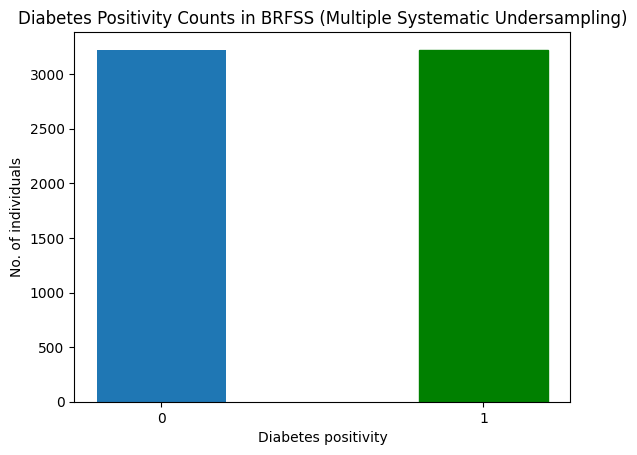

In [48]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Multiple Systematic Undersampling)")
plt.show()

In [49]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (5158, 15)
y_S_train: (5158,)
X_S_test: (1290, 15)
y_S_test: (1290,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7754 - loss: 0.6035 - val_AUC: 0.9037 - val_loss: 0.3984
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9009 - loss: 0.3988 - val_AUC: 0.9461 - val_loss: 0.2949
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9354 - loss: 0.3211 - val_AUC: 0.9518 - val_loss: 0.2770
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9454 - loss: 0.2953 - val_AUC: 0.9566 - val_loss: 0.2867
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9570 - loss: 0.2615 - val_AUC: 0.9623 - val_loss: 0.2475
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9590 - loss: 0.2537 - val_AUC: 0.9645 - val_loss: 0.2662
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.9626 - loss: 0.2426 - val_AUC: 0.9682 - val_loss: 0.2302
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9702 - loss: 0.2144 - val_AUC: 0.9700 - val_loss: 0.2233
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - 

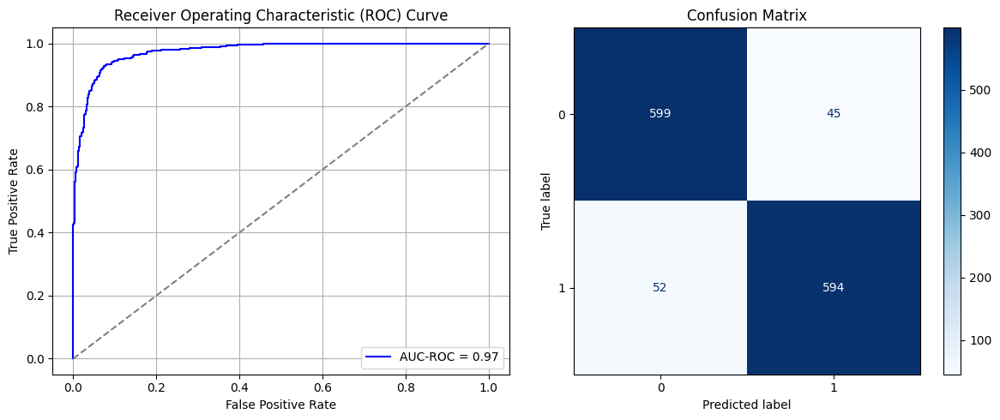

Best threshold based on F1-score: 0.418881893157959
Time elapsed (performance): 10.526281738000762


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5249 - loss: 1.6561 - val_AUC: 0.0000e+00 - val_loss: 1.9193
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5947 - loss: 0.7495 - val_AUC: 0.0000e+00 - val_loss: 1.1189
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5924 - loss: 0.6711 - val_AUC: 0.0000e+00 - val_loss: 1.0953
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6379 - loss: 0.6307 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6600 - loss: 0.6363 - val_AUC: 0.0000e+00 - val_loss: 0.9727
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6765 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.9893
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6792 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 1.0527
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6993 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5217 - loss: 1.6399 - val_AUC: 0.0000e+00 - val_loss: 1.8256
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5712 - loss: 0.8115 - val_AUC: 0.0000e+00 - val_loss: 1.2768
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6070 - loss: 0.6681 - val_AUC: 0.0000e+00 - val_loss: 1.0716
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6495 - loss: 0.6348 - val_AUC: 0.0000e+00 - val_loss: 0.9668
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6613 - loss: 0.6302 - val_AUC: 0.0000e+00 - val_loss: 1.0335
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6760 - loss: 0.6334 - val_AUC: 0.0000e+00 - val_loss: 0.9595
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6803 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9831
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7094 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.9747
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.5465 - loss: 1.6288 - val_AUC: 0.0000e+00 - val_loss: 1.8569
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5796 - loss: 0.7751 - val_AUC: 0.0000e+00 - val_loss: 1.1938
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6136 - loss: 0.6753 - val_AUC: 0.0000e+00 - val_loss: 1.1759
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6617 - loss: 0.6226 - val_AUC: 0.0000e+00 - val_loss: 0.9987
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6598 - loss: 0.6222 - val_AUC: 0.0000e+00 - val_loss: 1.0468
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6832 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9729
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6828 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6794 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.9724
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5199 - loss: 1.6937 - val_AUC: 0.0000e+00 - val_loss: 1.8056
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5973 - loss: 0.7663 - val_AUC: 0.0000e+00 - val_loss: 1.2003
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5939 - loss: 0.6784 - val_AUC: 0.0000e+00 - val_loss: 1.1287
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6488 - loss: 0.6302 - val_AUC: 0.0000e+00 - val_loss: 1.0142
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6559 - loss: 0.6311 - val_AUC: 0.0000e+00 - val_loss: 0.9599
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6726 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 1.0220
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6949 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6979 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 1.0254
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5360 - loss: 1.6288 - val_AUC: 0.0000e+00 - val_loss: 1.9233
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6081 - loss: 0.7746 - val_AUC: 0.0000e+00 - val_loss: 1.3555
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6170 - loss: 0.6763 - val_AUC: 0.0000e+00 - val_loss: 1.0659
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6440 - loss: 0.6505 - val_AUC: 0.0000e+00 - val_loss: 1.0518
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6763 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6914 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.9315
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6900 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6577 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.5446 - loss: 1.6144 - val_AUC: 0.0000e+00 - val_loss: 1.8426
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5767 - loss: 0.7906 - val_AUC: 0.0000e+00 - val_loss: 1.2885
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6057 - loss: 0.6732 - val_AUC: 0.0000e+00 - val_loss: 1.0943
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6545 - loss: 0.6362 - val_AUC: 0.0000e+00 - val_loss: 1.0260
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6699 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 1.0662
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6777 - loss: 0.6244 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6692 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9567
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6884 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5412 - loss: 1.5965 - val_AUC: 0.0000e+00 - val_loss: 1.9223
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5824 - loss: 0.7818 - val_AUC: 0.0000e+00 - val_loss: 1.2749
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6152 - loss: 0.6576 - val_AUC: 0.0000e+00 - val_loss: 1.1005
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6519 - loss: 0.6269 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6826 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.9749
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6764 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 0.9762
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6703 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6758 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5550 - loss: 1.6131 - val_AUC: 0.0000e+00 - val_loss: 1.8682
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6004 - loss: 0.7738 - val_AUC: 0.0000e+00 - val_loss: 1.3053
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5853 - loss: 0.7088 - val_AUC: 0.0000e+00 - val_loss: 1.1088
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6331 - loss: 0.6449 - val_AUC: 0.0000e+00 - val_loss: 1.0929
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6809 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 1.0585
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6869 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6909 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7039 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.5397 - loss: 1.6105 - val_AUC: 0.0000e+00 - val_loss: 1.8026
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5903 - loss: 0.7646 - val_AUC: 0.0000e+00 - val_loss: 1.1630
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6157 - loss: 0.6552 - val_AUC: 0.0000e+00 - val_loss: 1.0769
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6236 - loss: 0.6403 - val_AUC: 0.0000e+00 - val_loss: 1.0751
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6720 - loss: 0.6331 - val_AUC: 0.0000e+00 - val_loss: 1.0147
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6783 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9521
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6682 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 0.9892
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6874 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5554 - loss: 1.6293 - val_AUC: 0.0000e+00 - val_loss: 1.8150
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5947 - loss: 0.7678 - val_AUC: 0.0000e+00 - val_loss: 1.2689
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6213 - loss: 0.6618 - val_AUC: 0.0000e+00 - val_loss: 1.0702
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6305 - loss: 0.6433 - val_AUC: 0.0000e+00 - val_loss: 0.9646
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6654 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 1.0089
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6652 - loss: 0.6281 - val_AUC: 0.0000e+00 - val_loss: 1.0152
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6694 - loss: 0.6286 - val_AUC: 0.0000e+00 - val_loss: 0.9698
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7023 - loss: 0.6154 - val_AUC: 0.0000e+00 - val_loss: 0.9796
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5724 - loss: 1.5724 - val_AUC: 0.0000e+00 - val_loss: 1.8615
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6028 - loss: 0.7607 - val_AUC: 0.0000e+00 - val_loss: 1.1937
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6019 - loss: 0.6828 - val_AUC: 0.0000e+00 - val_loss: 1.3423
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6483 - loss: 0.6299 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6672 - loss: 0.6301 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6849 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 1.0428
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6844 - loss: 0.6104 - val_AUC: 0.0000e+00 - val_loss: 0.7910
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6808 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.9598
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.5732 - loss: 1.4854 - val_AUC: 0.0000e+00 - val_loss: 1.8493
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5970 - loss: 0.7385 - val_AUC: 0.0000e+00 - val_loss: 1.1713
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6143 - loss: 0.6768 - val_AUC: 0.0000e+00 - val_loss: 1.1366
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6433 - loss: 0.6286 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6557 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 1.1088
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6651 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 0.9923
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6872 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 0.9596
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6990 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 1.1088
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5487 - loss: 1.5699 - val_AUC: 0.0000e+00 - val_loss: 1.8540
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6081 - loss: 0.7685 - val_AUC: 0.0000e+00 - val_loss: 1.2393
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6026 - loss: 0.6765 - val_AUC: 0.0000e+00 - val_loss: 1.0534
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6601 - loss: 0.6294 - val_AUC: 0.0000e+00 - val_loss: 0.9550
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6601 - loss: 0.6293 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6833 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.9683
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6789 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 1.0143
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6952 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 0.9806
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.5300 - loss: 1.6648 - val_AUC: 0.0000e+00 - val_loss: 1.8314
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5870 - loss: 0.8031 - val_AUC: 0.0000e+00 - val_loss: 1.1939
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6218 - loss: 0.6529 - val_AUC: 0.0000e+00 - val_loss: 1.1365
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6487 - loss: 0.6298 - val_AUC: 0.0000e+00 - val_loss: 0.9703
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6716 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6982 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6926 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 1.0197
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6972 - loss: 0.6120 - val_AUC: 0.0000e+00 - val_loss: 0.9537
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5272 - loss: 1.6762 - val_AUC: 0.0000e+00 - val_loss: 1.8583
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5840 - loss: 0.7874 - val_AUC: 0.0000e+00 - val_loss: 1.3423
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6180 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 1.1565
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6330 - loss: 0.6371 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6548 - loss: 0.6248 - val_AUC: 0.0000e+00 - val_loss: 0.9833
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6907 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9632
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6791 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.9640
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7106 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 1.0202
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.5410 - loss: 1.6791 - val_AUC: 0.0000e+00 - val_loss: 1.7914
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5890 - loss: 0.7914 - val_AUC: 0.0000e+00 - val_loss: 1.3225
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6078 - loss: 0.6757 - val_AUC: 0.0000e+00 - val_loss: 0.9680
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6311 - loss: 0.6315 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6741 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.9970
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6638 - loss: 0.6326 - val_AUC: 0.0000e+00 - val_loss: 0.9406
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6930 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6743 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5596 - loss: 1.6062 - val_AUC: 0.0000e+00 - val_loss: 1.8752
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5881 - loss: 0.7751 - val_AUC: 0.0000e+00 - val_loss: 1.2650
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6135 - loss: 0.6595 - val_AUC: 0.0000e+00 - val_loss: 1.0810
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6547 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 1.0971
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6799 - loss: 0.6219 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6750 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.9790
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6836 - loss: 0.6236 - val_AUC: 0.0000e+00 - val_loss: 1.0276
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6864 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.5509 - loss: 1.6116 - val_AUC: 0.0000e+00 - val_loss: 1.8687
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.5809 - loss: 0.7843 - val_AUC: 0.0000e+00 - val_loss: 1.2523
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6002 - loss: 0.6736 - val_AUC: 0.0000e+00 - val_loss: 1.0490
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6336 - loss: 0.6437 - val_AUC: 0.0000e+00 - val_loss: 1.0014
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6548 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7032 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 0.9283
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6958 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.9530
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6799 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 1.0547
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.5311 - loss: 1.5909 - val_AUC: 0.0000e+00 - val_loss: 1.9396
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6050 - loss: 0.7421 - val_AUC: 0.0000e+00 - val_loss: 1.2598
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6285 - loss: 0.6682 - val_AUC: 0.0000e+00 - val_loss: 1.1558
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6338 - loss: 0.6460 - val_AUC: 0.0000e+00 - val_loss: 1.0372
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6646 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 1.1109
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6428 - loss: 0.6462 - val_AUC: 0.0000e+00 - val_loss: 0.9294
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7107 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6984 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.7341
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.5391 - loss: 1.5977 - val_AUC: 0.0000e+00 - val_loss: 1.9005
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5936 - loss: 0.7796 - val_AUC: 0.0000e+00 - val_loss: 1.3582
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6150 - loss: 0.6595 - val_AUC: 0.0000e+00 - val_loss: 1.0600
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6448 - loss: 0.6303 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6642 - loss: 0.6303 - val_AUC: 0.0000e+00 - val_loss: 0.9983
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6768 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 1.0394
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7031 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.9521
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6873 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9774
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7369 - loss: 0.6222 - val_AUC: 0.9010 - val_loss: 0.4063
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8987 - loss: 0.4025 - val_AUC: 0.9410 - val_loss: 0.3486
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9329 - loss: 0.3307 - val_AUC: 0.9514 - val_loss: 0.2961
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9476 - loss: 0.2878 - val_AUC: 0.9573 - val_loss: 0.2605
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9504 - loss: 0.2824 - val_AUC: 0.9601 - val_loss: 0.2776
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9636 - loss: 0.2383 - val_AUC: 0.9634 - val_loss: 0.2486
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9698 - loss: 0.2199 - val_AUC: 0.9701 - val_loss: 0.2247
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9704 - loss: 0.2180 - val_AUC: 0.9698 - val_loss: 0.2624
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

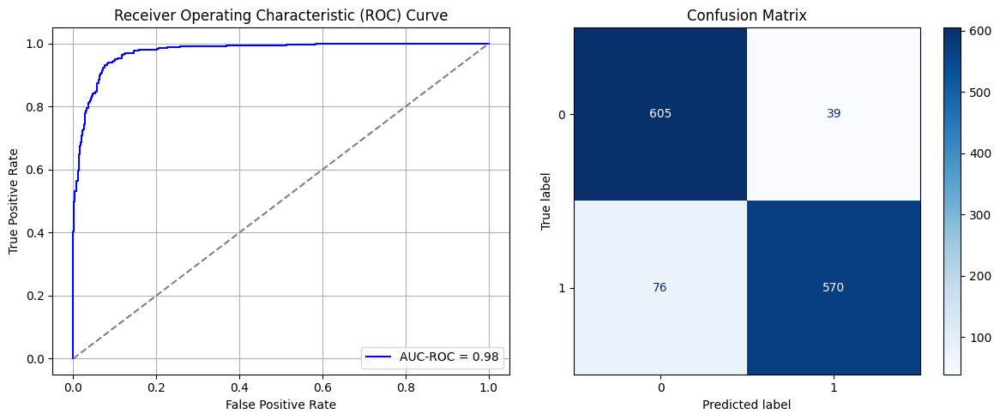

Best threshold based on F1-score: 0.2800452411174774
Time elapsed (performance): 11.654101669999363


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4845 - loss: 2.3659 - val_AUC: 0.0000e+00 - val_loss: 1.6439
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5317 - loss: 0.8924 - val_AUC: 0.0000e+00 - val_loss: 1.2395
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5945 - loss: 0.6781 - val_AUC: 0.0000e+00 - val_loss: 1.1180
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6288 - loss: 0.6481 - val_AUC: 0.0000e+00 - val_loss: 1.0715
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6233 - loss: 0.6450 - val_AUC: 0.0000e+00 - val_loss: 1.0037
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6595 - loss: 0.6342 - val_AUC: 0.0000e+00 - val_loss: 1.0508
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6584 - loss: 0.6188 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6844 - loss: 0.6230 - val_AUC: 0.0000e+00 - val_loss: 0.9874
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4554 - loss: 2.4628 - val_AUC: 0.0000e+00 - val_loss: 1.7179
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5189 - loss: 0.9188 - val_AUC: 0.0000e+00 - val_loss: 1.3133
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5595 - loss: 0.6840 - val_AUC: 0.0000e+00 - val_loss: 1.1055
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6262 - loss: 0.6550 - val_AUC: 0.0000e+00 - val_loss: 1.0809
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6625 - loss: 0.6331 - val_AUC: 0.0000e+00 - val_loss: 1.0352
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6644 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6719 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9619
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6490 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.9887
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4801 - loss: 2.3051 - val_AUC: 0.0000e+00 - val_loss: 1.8060
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5357 - loss: 0.8965 - val_AUC: 0.0000e+00 - val_loss: 1.3672
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5889 - loss: 0.6826 - val_AUC: 0.0000e+00 - val_loss: 1.1717
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6464 - loss: 0.6423 - val_AUC: 0.0000e+00 - val_loss: 1.0110
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6539 - loss: 0.6390 - val_AUC: 0.0000e+00 - val_loss: 1.0685
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6684 - loss: 0.6339 - val_AUC: 0.0000e+00 - val_loss: 1.0210
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6627 - loss: 0.6381 - val_AUC: 0.0000e+00 - val_loss: 1.0017
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6846 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.9598
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4924 - loss: 2.2792 - val_AUC: 0.0000e+00 - val_loss: 1.7196
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5491 - loss: 0.8672 - val_AUC: 0.0000e+00 - val_loss: 1.3047
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5740 - loss: 0.6677 - val_AUC: 0.0000e+00 - val_loss: 1.0853
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6610 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 1.0876
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6575 - loss: 0.6394 - val_AUC: 0.0000e+00 - val_loss: 1.0502
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6746 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.9691
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6681 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6557 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.9442
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4606 - loss: 2.2872 - val_AUC: 0.0000e+00 - val_loss: 1.6947
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5361 - loss: 0.8903 - val_AUC: 0.0000e+00 - val_loss: 1.2707
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5742 - loss: 0.6819 - val_AUC: 0.0000e+00 - val_loss: 1.0683
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6346 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 1.0268
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6619 - loss: 0.6325 - val_AUC: 0.0000e+00 - val_loss: 1.0535
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6681 - loss: 0.6290 - val_AUC: 0.0000e+00 - val_loss: 0.9906
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6770 - loss: 0.6300 - val_AUC: 0.0000e+00 - val_loss: 0.9889
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6708 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 1.0121
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.4858 - loss: 2.3332 - val_AUC: 0.0000e+00 - val_loss: 1.5930
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.5243 - loss: 0.8985 - val_AUC: 0.0000e+00 - val_loss: 1.3065
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.5768 - loss: 0.6842 - val_AUC: 0.0000e+00 - val_loss: 1.0547
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6221 - loss: 0.6449 - val_AUC: 0.0000e+00 - val_loss: 0.9589
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6423 - loss: 0.6296 - val_AUC: 0.0000e+00 - val_loss: 0.9292
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6639 - loss: 0.6298 - val_AUC: 0.0000e+00 - val_loss: 0.9395
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6674 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6565 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 1.0303
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.4593 - loss: 2.4659 - val_AUC: 0.0000e+00 - val_loss: 1.5697
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.5243 - loss: 0.9178 - val_AUC: 0.0000e+00 - val_loss: 1.2768
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5519 - loss: 0.6897 - val_AUC: 0.0000e+00 - val_loss: 1.1092
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6240 - loss: 0.6480 - val_AUC: 0.0000e+00 - val_loss: 1.0651
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6410 - loss: 0.6344 - val_AUC: 0.0000e+00 - val_loss: 0.9630
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6756 - loss: 0.6234 - val_AUC: 0.0000e+00 - val_loss: 0.9642
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6558 - loss: 0.6308 - val_AUC: 0.0000e+00 - val_loss: 0.9250
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6477 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.4804 - loss: 2.4623 - val_AUC: 0.0000e+00 - val_loss: 1.6388
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.5379 - loss: 0.8898 - val_AUC: 0.0000e+00 - val_loss: 1.2880
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5609 - loss: 0.6769 - val_AUC: 0.0000e+00 - val_loss: 1.0654
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6258 - loss: 0.6481 - val_AUC: 0.0000e+00 - val_loss: 1.1077
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.6682 - loss: 0.6238 - val_AUC: 0.0000e+00 - val_loss: 0.9865
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6671 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 0.9538
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6603 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6785 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 1.0012
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4671 - loss: 2.3610 - val_AUC: 0.0000e+00 - val_loss: 1.7256
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5413 - loss: 0.8926 - val_AUC: 0.0000e+00 - val_loss: 1.2575
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5923 - loss: 0.6724 - val_AUC: 0.0000e+00 - val_loss: 1.0912
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6279 - loss: 0.6469 - val_AUC: 0.0000e+00 - val_loss: 1.0406
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6650 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.9447
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6719 - loss: 0.6196 - val_AUC: 0.0000e+00 - val_loss: 0.9427
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6439 - loss: 0.6377 - val_AUC: 0.0000e+00 - val_loss: 0.9790
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6806 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.9686
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4769 - loss: 2.3577 - val_AUC: 0.0000e+00 - val_loss: 1.7064
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5186 - loss: 0.8868 - val_AUC: 0.0000e+00 - val_loss: 1.1902
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5770 - loss: 0.6762 - val_AUC: 0.0000e+00 - val_loss: 1.1148
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6381 - loss: 0.6385 - val_AUC: 0.0000e+00 - val_loss: 1.0489
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6279 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 1.0055
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6578 - loss: 0.6382 - val_AUC: 0.0000e+00 - val_loss: 1.0154
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6643 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 0.9987
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6716 - loss: 0.6151 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4558 - loss: 2.3193 - val_AUC: 0.0000e+00 - val_loss: 1.6742
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5400 - loss: 0.9118 - val_AUC: 0.0000e+00 - val_loss: 1.2929
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5653 - loss: 0.6903 - val_AUC: 0.0000e+00 - val_loss: 1.0627
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6389 - loss: 0.6479 - val_AUC: 0.0000e+00 - val_loss: 1.0363
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6532 - loss: 0.6229 - val_AUC: 0.0000e+00 - val_loss: 0.9437
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6505 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6335 - loss: 0.6424 - val_AUC: 0.0000e+00 - val_loss: 0.9946
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6787 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.9941
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4865 - loss: 2.3640 - val_AUC: 0.0000e+00 - val_loss: 1.6814
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5257 - loss: 0.9157 - val_AUC: 0.0000e+00 - val_loss: 1.2847
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5827 - loss: 0.6703 - val_AUC: 0.0000e+00 - val_loss: 1.1417
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6434 - loss: 0.6402 - val_AUC: 0.0000e+00 - val_loss: 1.0150
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6417 - loss: 0.6377 - val_AUC: 0.0000e+00 - val_loss: 0.9861
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6641 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.9975
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6620 - loss: 0.6336 - val_AUC: 0.0000e+00 - val_loss: 0.9837
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6656 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.5029 - loss: 2.1535 - val_AUC: 0.0000e+00 - val_loss: 1.8184
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5273 - loss: 0.9113 - val_AUC: 0.0000e+00 - val_loss: 1.3165
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5772 - loss: 0.6796 - val_AUC: 0.0000e+00 - val_loss: 1.0902
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6356 - loss: 0.6478 - val_AUC: 0.0000e+00 - val_loss: 1.0024
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6375 - loss: 0.6407 - val_AUC: 0.0000e+00 - val_loss: 1.0097
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6595 - loss: 0.6266 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6446 - loss: 0.6276 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6801 - loss: 0.6205 - val_AUC: 0.0000e+00 - val_loss: 0.9645
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4760 - loss: 2.4056 - val_AUC: 0.0000e+00 - val_loss: 1.6587
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.4998 - loss: 0.9456 - val_AUC: 0.0000e+00 - val_loss: 1.3238
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5606 - loss: 0.6820 - val_AUC: 0.0000e+00 - val_loss: 1.0676
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6339 - loss: 0.6429 - val_AUC: 0.0000e+00 - val_loss: 1.0454
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6577 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.9999
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6706 - loss: 0.6287 - val_AUC: 0.0000e+00 - val_loss: 0.9654
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6633 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 1.0198
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6823 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4759 - loss: 2.3399 - val_AUC: 0.0000e+00 - val_loss: 1.5873
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5183 - loss: 0.9151 - val_AUC: 0.0000e+00 - val_loss: 1.3048
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5656 - loss: 0.6930 - val_AUC: 0.0000e+00 - val_loss: 1.1343
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6315 - loss: 0.6460 - val_AUC: 0.0000e+00 - val_loss: 1.0431
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6576 - loss: 0.6314 - val_AUC: 0.0000e+00 - val_loss: 1.0319
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6477 - loss: 0.6388 - val_AUC: 0.0000e+00 - val_loss: 1.0051
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6768 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.9978
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6645 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4448 - loss: 2.5227 - val_AUC: 0.0000e+00 - val_loss: 1.6300
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5156 - loss: 0.9123 - val_AUC: 0.0000e+00 - val_loss: 1.2776
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5749 - loss: 0.6784 - val_AUC: 0.0000e+00 - val_loss: 1.0303
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6212 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6635 - loss: 0.6316 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6352 - loss: 0.6326 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6439 - loss: 0.6386 - val_AUC: 0.0000e+00 - val_loss: 1.0397
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6781 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 1.0586
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4850 - loss: 2.3199 - val_AUC: 0.0000e+00 - val_loss: 1.7311
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5410 - loss: 0.8699 - val_AUC: 0.0000e+00 - val_loss: 1.2569
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5932 - loss: 0.6654 - val_AUC: 0.0000e+00 - val_loss: 1.0337
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6401 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 0.9811
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6661 - loss: 0.6337 - val_AUC: 0.0000e+00 - val_loss: 1.0250
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6680 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.9284
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6657 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6800 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4671 - loss: 2.5503 - val_AUC: 0.0000e+00 - val_loss: 1.6022
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5204 - loss: 0.9260 - val_AUC: 0.0000e+00 - val_loss: 1.2941
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5897 - loss: 0.6617 - val_AUC: 0.0000e+00 - val_loss: 1.0037
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6489 - loss: 0.6397 - val_AUC: 0.0000e+00 - val_loss: 1.0075
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6769 - loss: 0.6251 - val_AUC: 0.0000e+00 - val_loss: 0.9751
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6757 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6675 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.9664
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6920 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.4793 - loss: 2.3813 - val_AUC: 0.0000e+00 - val_loss: 1.6483
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5398 - loss: 0.8708 - val_AUC: 0.0000e+00 - val_loss: 1.2701
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5790 - loss: 0.6847 - val_AUC: 0.0000e+00 - val_loss: 1.1352
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6411 - loss: 0.6502 - val_AUC: 0.0000e+00 - val_loss: 1.0635
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6555 - loss: 0.6385 - val_AUC: 0.0000e+00 - val_loss: 1.1162
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6562 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.9873
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6776 - loss: 0.6222 - val_AUC: 0.0000e+00 - val_loss: 0.9687
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6768 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.9585
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.4714 - loss: 2.2913 - val_AUC: 0.0000e+00 - val_loss: 1.7217
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5303 - loss: 0.8860 - val_AUC: 0.0000e+00 - val_loss: 1.2938
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6044 - loss: 0.6613 - val_AUC: 0.0000e+00 - val_loss: 1.0452
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6578 - loss: 0.6495 - val_AUC: 0.0000e+00 - val_loss: 1.1426
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6609 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6730 - loss: 0.6229 - val_AUC: 0.0000e+00 - val_loss: 0.9676
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6727 - loss: 0.6265 - val_AUC: 0.0000e+00 - val_loss: 0.9888
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6746 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.9547
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7513 - loss: 0.6126 - val_AUC: 0.8882 - val_loss: 0.4182
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8985 - loss: 0.4026 - val_AUC: 0.9405 - val_loss: 0.3089
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9346 - loss: 0.3249 - val_AUC: 0.9538 - val_loss: 0.2769
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9452 - loss: 0.2934 - val_AUC: 0.9595 - val_loss: 0.2523
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9562 - loss: 0.2637 - val_AUC: 0.9628 - val_loss: 0.2636
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9617 - loss: 0.2506 - val_AUC: 0.9685 - val_loss: 0.2305
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9668 - loss: 0.2328 - val_AUC: 0.9725 - val_loss: 0.2171
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.9661 - loss: 0.2333 - val_AUC: 0.9736 - val_loss: 0.2438
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - 

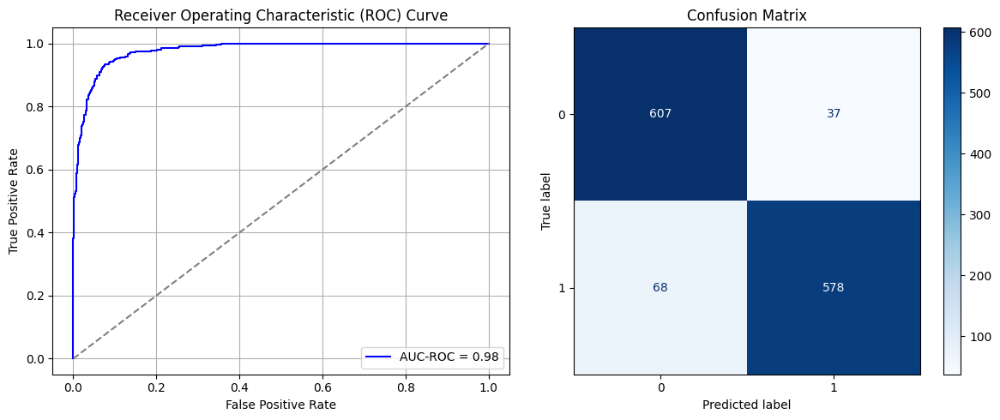

Best threshold based on F1-score: 0.3651932179927826
Time elapsed (performance): 12.994641487999615


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5530 - loss: 1.4030 - val_AUC: 0.0000e+00 - val_loss: 1.5421
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5537 - loss: 0.7053 - val_AUC: 0.0000e+00 - val_loss: 1.0237
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5554 - loss: 0.6684 - val_AUC: 0.0000e+00 - val_loss: 1.0738
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6029 - loss: 0.6448 - val_AUC: 0.0000e+00 - val_loss: 1.0318
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6457 - loss: 0.6355 - val_AUC: 0.0000e+00 - val_loss: 1.0395
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6718 - loss: 0.6322 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6967 - loss: 0.6154 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6893 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.5556 - loss: 1.4252 - val_AUC: 0.0000e+00 - val_loss: 1.5941
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5678 - loss: 0.7215 - val_AUC: 0.0000e+00 - val_loss: 1.0751
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.5576 - loss: 0.6536 - val_AUC: 0.0000e+00 - val_loss: 0.9826
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6231 - loss: 0.6509 - val_AUC: 0.0000e+00 - val_loss: 1.2872
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6261 - loss: 0.6423 - val_AUC: 0.0000e+00 - val_loss: 1.0812
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6835 - loss: 0.6290 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6861 - loss: 0.6211 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7108 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5400 - loss: 1.4294 - val_AUC: 0.0000e+00 - val_loss: 1.5488
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5517 - loss: 0.7134 - val_AUC: 0.0000e+00 - val_loss: 1.1507
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5365 - loss: 0.6642 - val_AUC: 0.0000e+00 - val_loss: 0.9488
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5909 - loss: 0.6493 - val_AUC: 0.0000e+00 - val_loss: 0.9022
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6046 - loss: 0.6502 - val_AUC: 0.0000e+00 - val_loss: 1.1828
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6704 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 0.9893
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6913 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 1.0307
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9538
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5369 - loss: 1.4800 - val_AUC: 0.0000e+00 - val_loss: 1.5457
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.5479 - loss: 0.7247 - val_AUC: 0.0000e+00 - val_loss: 1.2240
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5592 - loss: 0.6657 - val_AUC: 0.0000e+00 - val_loss: 1.0331
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5847 - loss: 0.6621 - val_AUC: 0.0000e+00 - val_loss: 1.1096
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - AUC: 0.6463 - loss: 0.6379 - val_AUC: 0.0000e+00 - val_loss: 1.0268
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - AUC: 0.6861 - loss: 0.6205 - val_AUC: 0.0000e+00 - val_loss: 1.0421
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - AUC: 0.7036 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 1.0083
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7035 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 1.0255
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5349 - loss: 1.4918 - val_AUC: 0.0000e+00 - val_loss: 1.5507
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5365 - loss: 0.7375 - val_AUC: 0.0000e+00 - val_loss: 1.1890
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5577 - loss: 0.6686 - val_AUC: 0.0000e+00 - val_loss: 1.0454
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5629 - loss: 0.6715 - val_AUC: 0.0000e+00 - val_loss: 1.1197
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6305 - loss: 0.6429 - val_AUC: 0.0000e+00 - val_loss: 0.9991
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6591 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6783 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7140 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.5638 - loss: 1.3996 - val_AUC: 0.0000e+00 - val_loss: 1.6008
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5601 - loss: 0.6860 - val_AUC: 0.0000e+00 - val_loss: 1.0051
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.5334 - loss: 0.6785 - val_AUC: 0.0000e+00 - val_loss: 1.0468
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.5960 - loss: 0.6437 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6106 - loss: 0.6454 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6518 - loss: 0.6352 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6685 - loss: 0.6321 - val_AUC: 0.0000e+00 - val_loss: 0.9637
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6901 - loss: 0.6251 - val_AUC: 0.0000e+00 - val_loss: 1.0048
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5228 - loss: 1.6404 - val_AUC: 0.0000e+00 - val_loss: 1.4902
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5605 - loss: 0.7127 - val_AUC: 0.0000e+00 - val_loss: 1.1146
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5557 - loss: 0.6553 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5896 - loss: 0.6483 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6271 - loss: 0.6358 - val_AUC: 0.0000e+00 - val_loss: 0.9433
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6611 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.9374
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7009 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 0.9691
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7002 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.5759 - loss: 1.3630 - val_AUC: 0.0000e+00 - val_loss: 1.6181
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5360 - loss: 0.7280 - val_AUC: 0.0000e+00 - val_loss: 1.0417
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5432 - loss: 0.6642 - val_AUC: 0.0000e+00 - val_loss: 1.0533
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5651 - loss: 0.6637 - val_AUC: 0.0000e+00 - val_loss: 1.0320
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6292 - loss: 0.6386 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6824 - loss: 0.6181 - val_AUC: 0.0000e+00 - val_loss: 0.9253
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6894 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 1.0084
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6869 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 1.0309
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5328 - loss: 1.5153 - val_AUC: 0.0000e+00 - val_loss: 1.5265
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5598 - loss: 0.7046 - val_AUC: 0.0000e+00 - val_loss: 1.1266
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5443 - loss: 0.6618 - val_AUC: 0.0000e+00 - val_loss: 1.0633
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5821 - loss: 0.6431 - val_AUC: 0.0000e+00 - val_loss: 1.0645
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6235 - loss: 0.6376 - val_AUC: 0.0000e+00 - val_loss: 1.1159
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6425 - loss: 0.6393 - val_AUC: 0.0000e+00 - val_loss: 1.0329
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6644 - loss: 0.6287 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6867 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 1.0471
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.5350 - loss: 1.5092 - val_AUC: 0.0000e+00 - val_loss: 1.5100
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5339 - loss: 0.7350 - val_AUC: 0.0000e+00 - val_loss: 1.1528
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5213 - loss: 0.6800 - val_AUC: 0.0000e+00 - val_loss: 1.1700
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5807 - loss: 0.6556 - val_AUC: 0.0000e+00 - val_loss: 0.9857
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6275 - loss: 0.6459 - val_AUC: 0.0000e+00 - val_loss: 1.0316
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6586 - loss: 0.6339 - val_AUC: 0.0000e+00 - val_loss: 0.9960
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7033 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5447 - loss: 1.4664 - val_AUC: 0.0000e+00 - val_loss: 1.5135
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5325 - loss: 0.7361 - val_AUC: 0.0000e+00 - val_loss: 1.1830
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5332 - loss: 0.6759 - val_AUC: 0.0000e+00 - val_loss: 1.1376
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5626 - loss: 0.6601 - val_AUC: 0.0000e+00 - val_loss: 0.9486
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6105 - loss: 0.6379 - val_AUC: 0.0000e+00 - val_loss: 0.9726
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6460 - loss: 0.6305 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6814 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7238 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.5466 - loss: 1.4265 - val_AUC: 0.0000e+00 - val_loss: 1.5475
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5346 - loss: 0.7274 - val_AUC: 0.0000e+00 - val_loss: 1.0703
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5603 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 1.0383
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5769 - loss: 0.6527 - val_AUC: 0.0000e+00 - val_loss: 0.9932
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6215 - loss: 0.6409 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6716 - loss: 0.6329 - val_AUC: 0.0000e+00 - val_loss: 1.0606
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6946 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 1.0135
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.6180 - val_AUC: 0.0000e+00 - val_loss: 1.0087
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.5642 - loss: 1.3995 - val_AUC: 0.0000e+00 - val_loss: 1.5458
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5572 - loss: 0.7059 - val_AUC: 0.0000e+00 - val_loss: 1.1045
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5498 - loss: 0.6714 - val_AUC: 0.0000e+00 - val_loss: 1.0172
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5833 - loss: 0.6557 - val_AUC: 0.0000e+00 - val_loss: 1.0749
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6455 - loss: 0.6442 - val_AUC: 0.0000e+00 - val_loss: 0.9592
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6623 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9769
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6872 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6852 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 0.9558
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.5487 - loss: 1.4603 - val_AUC: 0.0000e+00 - val_loss: 1.4829
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5545 - loss: 0.7158 - val_AUC: 0.0000e+00 - val_loss: 1.0336
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.5290 - loss: 0.6781 - val_AUC: 0.0000e+00 - val_loss: 1.0135
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6046 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 1.0256
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6104 - loss: 0.6462 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6677 - loss: 0.6244 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6889 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6761 - loss: 0.6237 - val_AUC: 0.0000e+00 - val_loss: 0.9421
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.5498 - loss: 1.4227 - val_AUC: 0.0000e+00 - val_loss: 1.5728
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5622 - loss: 0.7051 - val_AUC: 0.0000e+00 - val_loss: 1.1668
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.5456 - loss: 0.6636 - val_AUC: 0.0000e+00 - val_loss: 1.0099
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6045 - loss: 0.6461 - val_AUC: 0.0000e+00 - val_loss: 1.0665
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6468 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 1.1840
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6616 - loss: 0.6431 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6664 - loss: 0.6206 - val_AUC: 0.0000e+00 - val_loss: 1.0034
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6785 - loss: 0.6234 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.5272 - loss: 1.5563 - val_AUC: 0.0000e+00 - val_loss: 1.5582
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5204 - loss: 0.7459 - val_AUC: 0.0000e+00 - val_loss: 1.2176
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5694 - loss: 0.6669 - val_AUC: 0.0000e+00 - val_loss: 1.0950
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6025 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 0.9477
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6164 - loss: 0.6417 - val_AUC: 0.0000e+00 - val_loss: 1.0123
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6687 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 1.0191
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6705 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7033 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 1.0120
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.5628 - loss: 1.3999 - val_AUC: 0.0000e+00 - val_loss: 1.5590
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5550 - loss: 0.7090 - val_AUC: 0.0000e+00 - val_loss: 1.1969
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5642 - loss: 0.6680 - val_AUC: 0.0000e+00 - val_loss: 1.0313
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5835 - loss: 0.6506 - val_AUC: 0.0000e+00 - val_loss: 1.0301
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6575 - loss: 0.6323 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6589 - loss: 0.6315 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6654 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7060 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5437 - loss: 1.5041 - val_AUC: 0.0000e+00 - val_loss: 1.5013
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5388 - loss: 0.7364 - val_AUC: 0.0000e+00 - val_loss: 1.2082
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5534 - loss: 0.6618 - val_AUC: 0.0000e+00 - val_loss: 1.0653
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5574 - loss: 0.6680 - val_AUC: 0.0000e+00 - val_loss: 1.0316
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6117 - loss: 0.6522 - val_AUC: 0.0000e+00 - val_loss: 1.0947
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6458 - loss: 0.6460 - val_AUC: 0.0000e+00 - val_loss: 1.0629
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6809 - loss: 0.6279 - val_AUC: 0.0000e+00 - val_loss: 0.9376
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6898 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.5429 - loss: 1.5146 - val_AUC: 0.0000e+00 - val_loss: 1.5609
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.5466 - loss: 0.7193 - val_AUC: 0.0000e+00 - val_loss: 1.1673
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5197 - loss: 0.6780 - val_AUC: 0.0000e+00 - val_loss: 1.0357
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5691 - loss: 0.6497 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6170 - loss: 0.6386 - val_AUC: 0.0000e+00 - val_loss: 0.9546
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6728 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 1.0352
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6799 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6855 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9477
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5536 - loss: 1.4987 - val_AUC: 0.0000e+00 - val_loss: 1.6246
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5335 - loss: 0.7189 - val_AUC: 0.0000e+00 - val_loss: 1.0712
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5546 - loss: 0.6705 - val_AUC: 0.0000e+00 - val_loss: 1.1008
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6100 - loss: 0.6500 - val_AUC: 0.0000e+00 - val_loss: 0.9345
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6201 - loss: 0.6387 - val_AUC: 0.0000e+00 - val_loss: 1.1280
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6410 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6720 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6740 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7024 - loss: 0.6354 - val_AUC: 0.8953 - val_loss: 0.4219
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8876 - loss: 0.4163 - val_AUC: 0.9484 - val_loss: 0.2949
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9384 - loss: 0.3119 - val_AUC: 0.9591 - val_loss: 0.2710
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9518 - loss: 0.2762 - val_AUC: 0.9672 - val_loss: 0.2405
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9648 - loss: 0.2364 - val_AUC: 0.9742 - val_loss: 0.2083
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9655 - loss: 0.2354 - val_AUC: 0.9746 - val_loss: 0.2054
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9731 - loss: 0.2037 - val_AUC: 0.9775 - val_loss: 0.1937
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.9765 - loss: 0.1964 - val_AUC: 0.9796 - val_loss: 0.1883
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - 

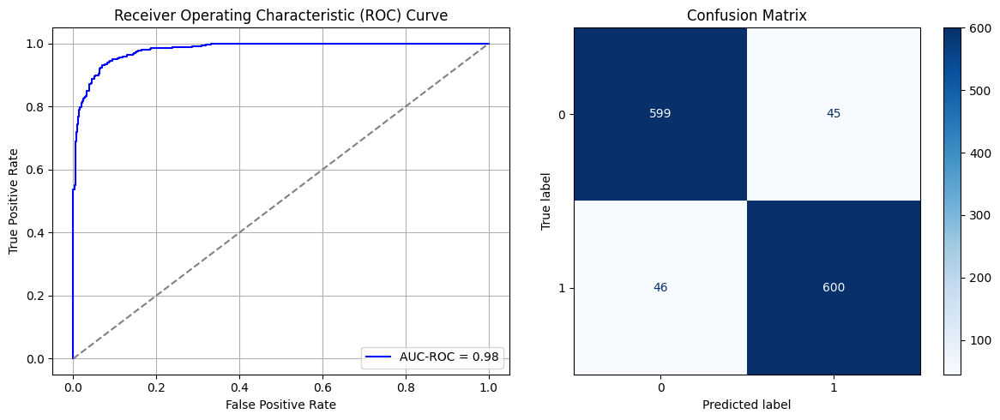

Best threshold based on F1-score: 0.48160886764526367
Time elapsed (performance): 14.347418352999739


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.5517 - loss: 2.1762 - val_AUC: 0.0000e+00 - val_loss: 1.4558
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6072 - loss: 0.8279 - val_AUC: 0.0000e+00 - val_loss: 1.1839
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6064 - loss: 0.6413 - val_AUC: 0.0000e+00 - val_loss: 1.0921
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6190 - loss: 0.6358 - val_AUC: 0.0000e+00 - val_loss: 1.0391
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6561 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 1.0086
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6703 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 1.0138
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6881 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9173
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6821 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9371
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.5383 - loss: 2.3181 - val_AUC: 0.0000e+00 - val_loss: 1.3956
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.5773 - loss: 0.8642 - val_AUC: 0.0000e+00 - val_loss: 1.0221
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6183 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.9638
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6583 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9926
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6616 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.9940
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6711 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6858 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6811 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.5556 - loss: 2.1985 - val_AUC: 0.0000e+00 - val_loss: 1.4779
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5728 - loss: 0.8719 - val_AUC: 0.0000e+00 - val_loss: 1.0574
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6223 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.9755
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6307 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9269
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6531 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.9770
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6711 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6810 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 1.0038
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6675 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.5572 - loss: 2.2570 - val_AUC: 0.0000e+00 - val_loss: 1.4288
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5951 - loss: 0.7993 - val_AUC: 0.0000e+00 - val_loss: 1.0535
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6396 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 1.0296
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6439 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9341
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6345 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 1.0214
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6611 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.9493
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6682 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9806
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6823 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.5771 - loss: 2.1904 - val_AUC: 0.0000e+00 - val_loss: 1.4725
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5989 - loss: 0.8396 - val_AUC: 0.0000e+00 - val_loss: 1.0778
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6111 - loss: 0.6452 - val_AUC: 0.0000e+00 - val_loss: 0.9559
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6492 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.9581
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6635 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.9934
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6480 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.9384
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6714 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.9715
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6911 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 1.0164
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.5296 - loss: 2.3109 - val_AUC: 0.0000e+00 - val_loss: 1.5311
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5943 - loss: 0.8355 - val_AUC: 0.0000e+00 - val_loss: 1.0426
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6357 - loss: 0.6287 - val_AUC: 0.0000e+00 - val_loss: 1.0079
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6654 - loss: 0.6199 - val_AUC: 0.0000e+00 - val_loss: 1.0109
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6766 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 1.0164
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6880 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6806 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.9564
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6682 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.5595 - loss: 2.2930 - val_AUC: 0.0000e+00 - val_loss: 1.4790
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5839 - loss: 0.8395 - val_AUC: 0.0000e+00 - val_loss: 1.0375
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6274 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.9429
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6258 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6659 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6554 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6832 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6755 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.5399 - loss: 2.3126 - val_AUC: 0.0000e+00 - val_loss: 1.4484
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5731 - loss: 0.8518 - val_AUC: 0.0000e+00 - val_loss: 1.0362
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6281 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.9553
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6333 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.9832
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6596 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.9294
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6611 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6712 - loss: 0.6214 - val_AUC: 0.0000e+00 - val_loss: 1.0014
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6829 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9674
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.5376 - loss: 2.2879 - val_AUC: 0.0000e+00 - val_loss: 1.4522
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.5884 - loss: 0.8506 - val_AUC: 0.0000e+00 - val_loss: 1.2165
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.5829 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 1.0058
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.5897 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 0.9836
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6444 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.9709
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6648 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6634 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6675 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.9575
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.5514 - loss: 2.1607 - val_AUC: 0.0000e+00 - val_loss: 1.5086
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5641 - loss: 0.8587 - val_AUC: 0.0000e+00 - val_loss: 1.0487
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6246 - loss: 0.6308 - val_AUC: 0.0000e+00 - val_loss: 1.0035
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6669 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 1.0098
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6492 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6899 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6731 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.9910
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6876 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.5433 - loss: 2.3130 - val_AUC: 0.0000e+00 - val_loss: 1.4116
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5918 - loss: 0.8189 - val_AUC: 0.0000e+00 - val_loss: 1.1070
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6281 - loss: 0.6359 - val_AUC: 0.0000e+00 - val_loss: 1.0152
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6379 - loss: 0.6309 - val_AUC: 0.0000e+00 - val_loss: 0.9693
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6541 - loss: 0.6163 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6846 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.9616
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6949 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6860 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9264
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.5506 - loss: 2.3854 - val_AUC: 0.0000e+00 - val_loss: 1.3791
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6001 - loss: 0.8359 - val_AUC: 0.0000e+00 - val_loss: 1.0925
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6113 - loss: 0.6423 - val_AUC: 0.0000e+00 - val_loss: 0.9678
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6602 - loss: 0.6229 - val_AUC: 0.0000e+00 - val_loss: 0.9670
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6456 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.9969
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6733 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.9624
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6875 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.9847
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6942 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9459
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.5545 - loss: 2.3225 - val_AUC: 0.0000e+00 - val_loss: 1.4298
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5647 - loss: 0.8711 - val_AUC: 0.0000e+00 - val_loss: 1.0479
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6095 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.9499
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6497 - loss: 0.6191 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6610 - loss: 0.6100 - val_AUC: 0.0000e+00 - val_loss: 0.9361
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6750 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6845 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.9714
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6711 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.9434
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.5397 - loss: 2.2527 - val_AUC: 0.0000e+00 - val_loss: 1.5248
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6037 - loss: 0.8313 - val_AUC: 0.0000e+00 - val_loss: 1.1193
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6394 - loss: 0.6211 - val_AUC: 0.0000e+00 - val_loss: 1.0233
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6615 - loss: 0.6180 - val_AUC: 0.0000e+00 - val_loss: 1.0484
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6694 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.9415
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6621 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9522
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6734 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6880 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.5417 - loss: 2.3013 - val_AUC: 0.0000e+00 - val_loss: 1.3748
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.5866 - loss: 0.8541 - val_AUC: 0.0000e+00 - val_loss: 1.0688
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6262 - loss: 0.6387 - val_AUC: 0.0000e+00 - val_loss: 1.0294
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6629 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6751 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6699 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9507
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6691 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9415
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6951 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9240
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.5587 - loss: 2.1859 - val_AUC: 0.0000e+00 - val_loss: 1.5586
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5877 - loss: 0.8266 - val_AUC: 0.0000e+00 - val_loss: 1.0012
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6168 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6457 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 1.0184
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6794 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 1.0413
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6686 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9981
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6612 - loss: 0.6311 - val_AUC: 0.0000e+00 - val_loss: 0.9957
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6785 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.9808
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.5394 - loss: 2.2715 - val_AUC: 0.0000e+00 - val_loss: 1.4383
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5881 - loss: 0.8417 - val_AUC: 0.0000e+00 - val_loss: 1.1433
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6164 - loss: 0.6262 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6527 - loss: 0.6215 - val_AUC: 0.0000e+00 - val_loss: 0.9837
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6719 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.9776
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6666 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 1.0202
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6786 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 1.0053
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6704 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.9466
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.5254 - loss: 2.3476 - val_AUC: 0.0000e+00 - val_loss: 1.4141
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5859 - loss: 0.8223 - val_AUC: 0.0000e+00 - val_loss: 1.0424
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6065 - loss: 0.6350 - val_AUC: 0.0000e+00 - val_loss: 1.0118
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6249 - loss: 0.6320 - val_AUC: 0.0000e+00 - val_loss: 0.9844
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6397 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.9696
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6721 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6659 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.9758
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6692 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 1.1244
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.5628 - loss: 2.2105 - val_AUC: 0.0000e+00 - val_loss: 1.5064
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5710 - loss: 0.8723 - val_AUC: 0.0000e+00 - val_loss: 1.0245
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6274 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6355 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9505
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6473 - loss: 0.6302 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6450 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 0.9626
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6704 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6767 - loss: 0.6149 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.5420 - loss: 2.2849 - val_AUC: 0.0000e+00 - val_loss: 1.5314
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.5915 - loss: 0.8255 - val_AUC: 0.0000e+00 - val_loss: 1.0267
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6302 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6380 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.9514
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6723 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.9159
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6655 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6783 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.9380
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6869 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7643 - loss: 0.6185 - val_AUC: 0.8875 - val_loss: 0.4300
Epoch 2/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8925 - loss: 0.4085 - val_AUC: 0.9351 - val_loss: 0.3385
Epoch 3/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9352 - loss: 0.3231 - val_AUC: 0.9558 - val_loss: 0.2753
Epoch 4/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.9473 - loss: 0.2888 - val_AUC: 0.9635 - val_loss: 0.2808
Epoch 5/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.9646 - loss: 0.2387 - val_AUC: 0.9695 - val_loss: 0.2326
Epoch 6/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9650 - loss: 0.2372 - val_AUC: 0.9714 - val_loss: 0.2191
Epoch 7/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9716 - loss: 0.2152 - val_AUC: 0.9714 - val_loss: 0.2260
Epoch 8/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9735 - loss: 0.2072 - val_AUC: 0.9771 - val_loss: 0.2001
Epoch 9/10
129/129 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - 

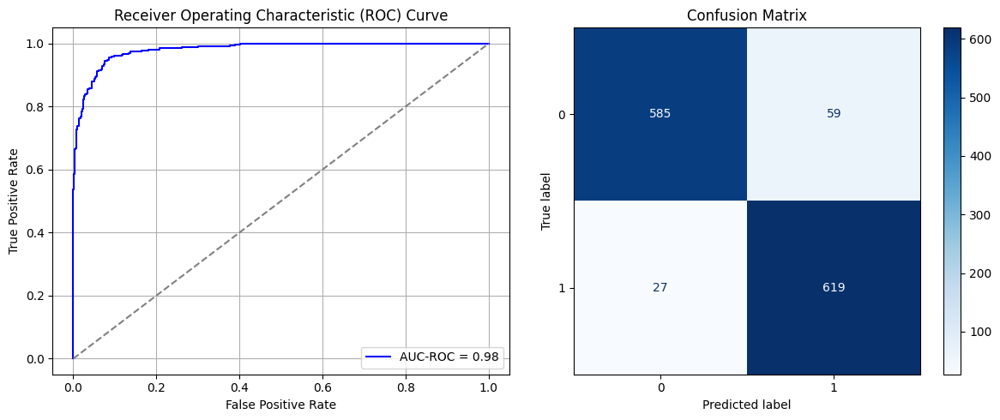

Best threshold based on F1-score: 0.5351503491401672
Time elapsed (performance): 14.752469936000125


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.4400 - loss: 2.7419 - val_AUC: 0.0000e+00 - val_loss: 1.9089
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.4756 - loss: 0.7927 - val_AUC: 0.0000e+00 - val_loss: 1.2475
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.5734 - loss: 0.6718 - val_AUC: 0.0000e+00 - val_loss: 1.1253
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6555 - loss: 0.6336 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7082 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.9399
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6810 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7098 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.9556
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7107 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4255 - loss: 2.8286 - val_AUC: 0.0000e+00 - val_loss: 1.8133
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.4889 - loss: 0.7495 - val_AUC: 0.0000e+00 - val_loss: 1.1791
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5892 - loss: 0.6575 - val_AUC: 0.0000e+00 - val_loss: 1.1179
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6756 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6876 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7015 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.9473
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7086 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7039 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9547
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.4134 - loss: 2.8794 - val_AUC: 0.0000e+00 - val_loss: 1.6426
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5010 - loss: 0.7456 - val_AUC: 0.0000e+00 - val_loss: 1.2511
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5725 - loss: 0.6726 - val_AUC: 0.0000e+00 - val_loss: 1.0998
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6667 - loss: 0.6321 - val_AUC: 0.0000e+00 - val_loss: 1.0220
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6991 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.9358
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6633 - loss: 0.6248 - val_AUC: 0.0000e+00 - val_loss: 0.9498
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7226 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.9774
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6904 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - AUC: 0.4123 - loss: 2.7851 - val_AUC: 0.0000e+00 - val_loss: 1.9390
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.4769 - loss: 0.7962 - val_AUC: 0.0000e+00 - val_loss: 1.2704
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5799 - loss: 0.6742 - val_AUC: 0.0000e+00 - val_loss: 1.1262
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6497 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 1.0273
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6948 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6969 - loss: 0.6196 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7032 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.9688
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7197 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9486
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.3970 - loss: 2.9543 - val_AUC: 0.0000e+00 - val_loss: 1.6831
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.5077 - loss: 0.7453 - val_AUC: 0.0000e+00 - val_loss: 1.2494
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.5400 - loss: 0.6687 - val_AUC: 0.0000e+00 - val_loss: 1.0700
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6407 - loss: 0.6432 - val_AUC: 0.0000e+00 - val_loss: 1.0346
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6836 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 0.9352
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6685 - loss: 0.6265 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7040 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7058 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.3783 - loss: 2.9678 - val_AUC: 0.0000e+00 - val_loss: 1.7585
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.4845 - loss: 0.7699 - val_AUC: 0.0000e+00 - val_loss: 1.1669
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5815 - loss: 0.6624 - val_AUC: 0.0000e+00 - val_loss: 1.1188
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6589 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 0.9578
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6802 - loss: 0.6199 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6908 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 0.9875
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7153 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 1.0008
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7172 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/ste

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.4002 - loss: 2.9946 - val_AUC: 0.0000e+00 - val_loss: 1.8250
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5102 - loss: 0.7700 - val_AUC: 0.0000e+00 - val_loss: 1.2824
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5956 - loss: 0.6615 - val_AUC: 0.0000e+00 - val_loss: 0.9693
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6819 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6867 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 1.0071
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6902 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6832 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9814
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7172 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.4203 - loss: 2.7226 - val_AUC: 0.0000e+00 - val_loss: 1.9100
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.4931 - loss: 0.7563 - val_AUC: 0.0000e+00 - val_loss: 1.1347
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5776 - loss: 0.6746 - val_AUC: 0.0000e+00 - val_loss: 1.0976
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6762 - loss: 0.6296 - val_AUC: 0.0000e+00 - val_loss: 1.0000
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6883 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6941 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7050 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 1.0246
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7049 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 1.0268
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.3959 - loss: 3.0750 - val_AUC: 0.0000e+00 - val_loss: 1.6529
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.4820 - loss: 0.7702 - val_AUC: 0.0000e+00 - val_loss: 1.2685
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5632 - loss: 0.6806 - val_AUC: 0.0000e+00 - val_loss: 1.0495
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6591 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.9357
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6753 - loss: 0.6271 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6986 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.9227
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7028 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7004 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.4271 - loss: 2.8246 - val_AUC: 0.0000e+00 - val_loss: 1.8343
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.4758 - loss: 0.7927 - val_AUC: 0.0000e+00 - val_loss: 1.3241
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5510 - loss: 0.6794 - val_AUC: 0.0000e+00 - val_loss: 1.1224
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6604 - loss: 0.6486 - val_AUC: 0.0000e+00 - val_loss: 1.0184
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6862 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6867 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9592
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6959 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6971 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.4233 - loss: 2.8681 - val_AUC: 0.0000e+00 - val_loss: 1.8429
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.5017 - loss: 0.7666 - val_AUC: 0.0000e+00 - val_loss: 1.2347
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5796 - loss: 0.6679 - val_AUC: 0.0000e+00 - val_loss: 1.0317
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6619 - loss: 0.6331 - val_AUC: 0.0000e+00 - val_loss: 0.9586
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7067 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7065 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 1.0887
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7026 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.9851
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6989 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.9429
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4230 - loss: 2.8616 - val_AUC: 0.0000e+00 - val_loss: 1.7329
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.4907 - loss: 0.7645 - val_AUC: 0.0000e+00 - val_loss: 1.2617
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5857 - loss: 0.6503 - val_AUC: 0.0000e+00 - val_loss: 1.0463
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6619 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 0.9431
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6791 - loss: 0.6216 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6914 - loss: 0.6174 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7119 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 1.0454
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7061 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4127 - loss: 2.8311 - val_AUC: 0.0000e+00 - val_loss: 1.8491
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.4865 - loss: 0.7774 - val_AUC: 0.0000e+00 - val_loss: 1.1741
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5909 - loss: 0.6614 - val_AUC: 0.0000e+00 - val_loss: 1.1327
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6566 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7065 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6954 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.9709
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6985 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6939 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.9768
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.3966 - loss: 2.9278 - val_AUC: 0.0000e+00 - val_loss: 1.8077
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.5107 - loss: 0.7564 - val_AUC: 0.0000e+00 - val_loss: 1.2734
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5943 - loss: 0.6731 - val_AUC: 0.0000e+00 - val_loss: 1.0683
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6655 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6990 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.9653
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6892 - loss: 0.6125 - val_AUC: 0.0000e+00 - val_loss: 0.9447
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6991 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.9738
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7145 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.7507
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.4257 - loss: 2.8288 - val_AUC: 0.0000e+00 - val_loss: 1.7661
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.4771 - loss: 0.7541 - val_AUC: 0.0000e+00 - val_loss: 1.2032
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5686 - loss: 0.6726 - val_AUC: 0.0000e+00 - val_loss: 1.0968
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6639 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 1.0007
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7035 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.9848
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6949 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9489
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6583 - loss: 0.6249 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6993 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.4358 - loss: 2.7176 - val_AUC: 0.0000e+00 - val_loss: 1.9599
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.4813 - loss: 0.8155 - val_AUC: 0.0000e+00 - val_loss: 1.2569
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6048 - loss: 0.6498 - val_AUC: 0.0000e+00 - val_loss: 1.0853
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6743 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 1.0070
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6905 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.9531
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6928 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9925
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6969 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.9513
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7133 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.4440 - loss: 2.8319 - val_AUC: 0.0000e+00 - val_loss: 1.8694
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.4955 - loss: 0.7640 - val_AUC: 0.0000e+00 - val_loss: 1.1359
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.5963 - loss: 0.6681 - val_AUC: 0.0000e+00 - val_loss: 1.0329
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6715 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.9761
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6881 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.9955
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7029 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 1.0165
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7025 - loss: 0.6149 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7120 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4130 - loss: 2.8760 - val_AUC: 0.0000e+00 - val_loss: 1.9316
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.4837 - loss: 0.7985 - val_AUC: 0.0000e+00 - val_loss: 1.2831
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.5999 - loss: 0.6568 - val_AUC: 0.0000e+00 - val_loss: 1.1008
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6616 - loss: 0.6396 - val_AUC: 0.0000e+00 - val_loss: 1.0352
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6645 - loss: 0.6387 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6966 - loss: 0.6164 - val_AUC: 0.0000e+00 - val_loss: 0.9893
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6960 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.9080
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6795 - loss: 0.6165 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4039 - loss: 2.8279 - val_AUC: 0.0000e+00 - val_loss: 1.6261
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.4909 - loss: 0.7599 - val_AUC: 0.0000e+00 - val_loss: 1.2600
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5560 - loss: 0.6857 - val_AUC: 0.0000e+00 - val_loss: 1.1985
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6586 - loss: 0.6342 - val_AUC: 0.0000e+00 - val_loss: 1.0057
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6806 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.9473
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7061 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6981 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7014 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.4016 - loss: 2.9586 - val_AUC: 0.0000e+00 - val_loss: 1.8468
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.5126 - loss: 0.7519 - val_AUC: 0.0000e+00 - val_loss: 1.2109
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6085 - loss: 0.6605 - val_AUC: 0.0000e+00 - val_loss: 1.1575
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6706 - loss: 0.6300 - val_AUC: 0.0000e+00 - val_loss: 1.0361
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7051 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.9706
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6987 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 1.0484
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6935 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 1.0227
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7177 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 9/10
57/57 ━━━━━━━━━━━━━━━━━━━━

In [50]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [51]:
print(ParamFit)
ParamFit.to_csv('Sy_multi_Fine_Tuning.csv')

         FPR       FNR
0   0.111369  0.747405
1   0.134571  0.716263
2   0.076566  0.816609
3   0.108275  0.775087
4   0.097448  0.799308
..       ...       ...
95  0.214230  0.546713
96  0.109049  0.698962
97  0.180201  0.598616
98  0.169374  0.605536
99  0.164733  0.615917

[100 rows x 2 columns]


In [52]:
ParamFit['FNR'].mean()

np.float64(0.6895501730103807)

# Random Oversampling (ROS):

## Simple Random Sampling with Replacement:

In this case, we investigate the effectiveness of Random Oversampling methods, beginning with Simple Random Sampling (SRS) with replacement. For this, we perform random resampling from the minority class of size $N_1$ to generate an additional sample of size $N_0-N_1$, such that the oversampled minority class will have the same size as the majority class.

In [53]:
X_S_SRS, y_S_SRS = SRSwR_oversampler(data_S_full, data_S_full.iloc[:, -1])
print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRS, y_T_train_SRS = SRSwR_oversampler(T_train, T_train.iloc[:, -1])
print(y_T_train_SRS)

3224
32062
0        0
1        0
2        0
3        0
4        0
        ..
34739    1
11069    1
15355    1
33913    1
33450    1
Name: Y2, Length: 64124, dtype: int64
1135
5190
2026    0.0
4052    0.0
4096    0.0
4319    0.0
2572    0.0
       ... 
7392    1.0
6347    1.0
3887    1.0
3142    1.0
7422    1.0
Name: Y, Length: 10380, dtype: float64


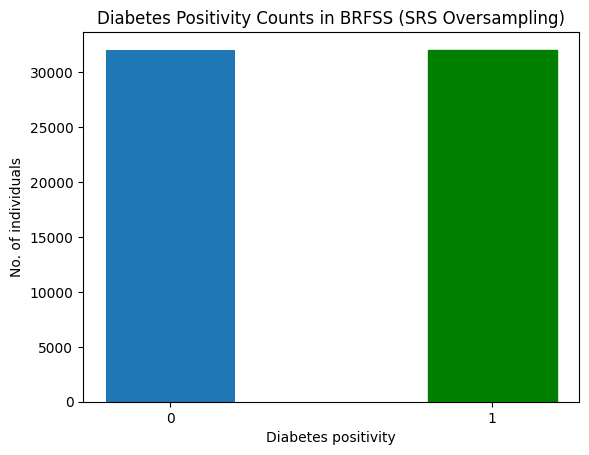

In [54]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Oversampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - AUC: 0.8199 - loss: 0.5065 - val_AUC: 0.8943 - val_loss: 0.4242
Epoch 2/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8987 - loss: 0.3978 - val_AUC: 0.9055 - val_loss: 0.3833
Epoch 3/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9080 - loss: 0.3769 - val_AUC: 0.9129 - val_loss: 0.3770
Epoch 4/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.9149 - loss: 0.3622 - val_AUC: 0.9174 - val_loss: 0.3572
Epoch 5/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9196 - loss: 0.3516 - val_AUC: 0.9193 - val_loss: 0.3499
Epoch 6/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9244 - loss: 0.3380 - val_AUC: 0.9223 - val_loss: 0.3587
Epoch 7/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9262 - loss: 0.3332 - val_AUC: 0.9241 - val_loss: 0.3405
Epoch 8/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9289 - loss: 0.3263 - val_AUC: 0.9294 - val_loss: 0.3313
Epoch 9/10
1283/1283 ━━━━━━━━━━━━━━━━

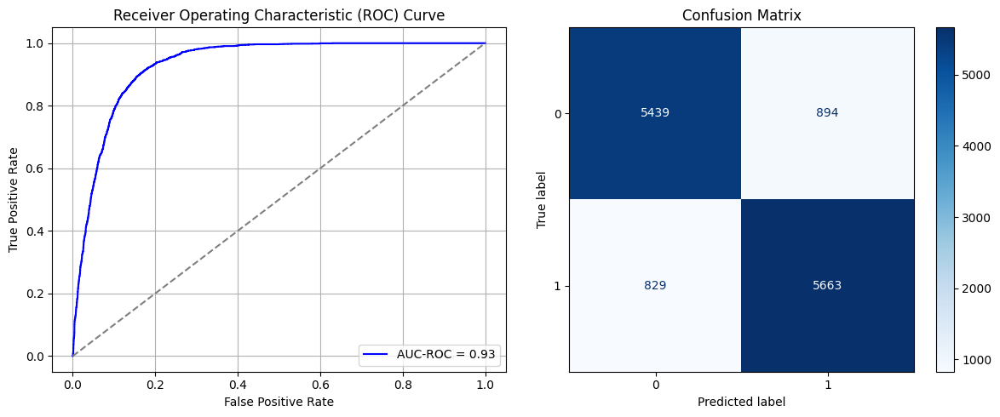

<ipython-input-38-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9969446063041687
Time elapsed (performance): 58.58183385600023


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5065 - loss: 1.1857 - val_AUC: 0.0000e+00 - val_loss: 0.9821
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6917 - loss: 0.6229 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7194 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7286 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7242 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.6754
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7359 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5062 - loss: 1.1975 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6962 - loss: 0.6243 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7158 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7236 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.7725
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7202 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7210 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7362 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.7619
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5071 - loss: 1.1811 - val_AUC: 0.0000e+00 - val_loss: 0.9863
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6880 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7272 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9437
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7218 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7322 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7410 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.7574
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5155 - loss: 1.1749 - val_AUC: 0.0000e+00 - val_loss: 1.0044
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6904 - loss: 0.6288 - val_AUC: 0.0000e+00 - val_loss: 0.9391
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7110 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7140 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7352 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7151 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7361 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7328 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_791 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_792 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_793 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_794 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_795 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_796 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_797 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.5050 - loss: 1.1875 - val_AUC: 0.0000e+00 - val_loss: 1.0757
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6871 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.9987
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7161 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7195 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7277 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 1.0102
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7327 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7258 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_798 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_799 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_800 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_801 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_802 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_803 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_804 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5078 - loss: 1.1750 - val_AUC: 0.0000e+00 - val_loss: 1.0238
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6924 - loss: 0.6269 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7119 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7348 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7261 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7270 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7354 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7422 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_805 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_806 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_807 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_808 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_809 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_810 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_811 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.5027 - loss: 1.1835 - val_AUC: 0.0000e+00 - val_loss: 0.9572
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6891 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7129 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7217 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7288 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9238
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7241 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7353 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7234 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.7489
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_812 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_813 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_814 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_815 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_816 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_817 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_818 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.4910 - loss: 1.2215 - val_AUC: 0.0000e+00 - val_loss: 1.0565
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6899 - loss: 0.6298 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7105 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.7913
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7269 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7325 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7336 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8012
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7248 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7324 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_819 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_820 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_821 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_822 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_823 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_824 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_825 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5156 - loss: 1.1471 - val_AUC: 0.0000e+00 - val_loss: 0.9902
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6925 - loss: 0.6284 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7227 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7220 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7376 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7385 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7373 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.7419
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_826 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_827 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_828 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_829 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_830 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_831 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_832 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5117 - loss: 1.1962 - val_AUC: 0.0000e+00 - val_loss: 0.9735
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6880 - loss: 0.6234 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7141 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7196 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7297 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7275 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7406 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_833 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_834 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_835 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_836 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_837 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_838 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_839 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.4971 - loss: 1.1902 - val_AUC: 0.0000e+00 - val_loss: 0.9858
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6937 - loss: 0.6237 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7192 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.7764
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7207 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7249 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.7565
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7345 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7301 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7376
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7509 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7189
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_840 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_841 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_842 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_843 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_844 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_845 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_846 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.5159 - loss: 1.1782 - val_AUC: 0.0000e+00 - val_loss: 0.9540
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6952 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7234 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7225 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7246 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7298 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7386 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7343 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5133 - loss: 1.1786 - val_AUC: 0.0000e+00 - val_loss: 1.0045
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7030 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7229 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7256 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7256 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9318
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7338 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7300 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7461 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5069 - loss: 1.1946 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6936 - loss: 0.6215 - val_AUC: 0.0000e+00 - val_loss: 0.9344
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7180 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8028
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7178 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7337 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7277 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7352 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7909
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.4976 - loss: 1.2083 - val_AUC: 0.0000e+00 - val_loss: 1.0012
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6926 - loss: 0.6291 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7172 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7280 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7293 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7336 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7454 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.7579
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.4988 - loss: 1.2111 - val_AUC: 0.0000e+00 - val_loss: 0.9970
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6975 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7207 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7293 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7219 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7385 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7400 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7252 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 1.0033
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5074 - loss: 1.2105 - val_AUC: 0.0000e+00 - val_loss: 0.9986
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6836 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 1.0153
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7307 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7228 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9236
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7313 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.7009
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7334 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7451 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.4993 - loss: 1.2203 - val_AUC: 0.0000e+00 - val_loss: 1.0462
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6778 - loss: 0.6316 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7132 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7186 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7325 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.7650
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7276 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8293
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7383 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.7725
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7380 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.4994 - loss: 1.2037 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6846 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7145 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7366 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7385 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7395 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7445 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5041 - loss: 1.1794 - val_AUC: 0.0000e+00 - val_loss: 1.0067
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6856 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.9464
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7132 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7149 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7302 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7327 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.8192 - loss: 0.5105 - val_AUC: 0.8974 - val_loss: 0.4034
Epoch 2/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - AUC: 0.9004 - loss: 0.3949 - val_AUC: 0.9056 - val_loss: 0.3836
Epoch 3/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9137 - loss: 0.3662 - val_AUC: 0.9175 - val_loss: 0.3737
Epoch 4/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.9191 - loss: 0.3529 - val_AUC: 0.9216 - val_loss: 0.3478
Epoch 5/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - AUC: 0.9228 - loss: 0.3440 - val_AUC: 0.9241 - val_loss: 0.3580
Epoch 6/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - AUC: 0.9256 - loss: 0.3369 - val_AUC: 0.9267 - val_loss: 0.3386
Epoch 7/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.9284 - loss: 0.3300 - val_AUC: 0.9295 - val_loss: 0.3281
Epoch 8/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.9319 - loss: 0.3201 - val_AUC: 0.9288 - val_loss: 0.3473
Epoch 9/10
1283/1283 ━━━━━━━━━━━━━━━━

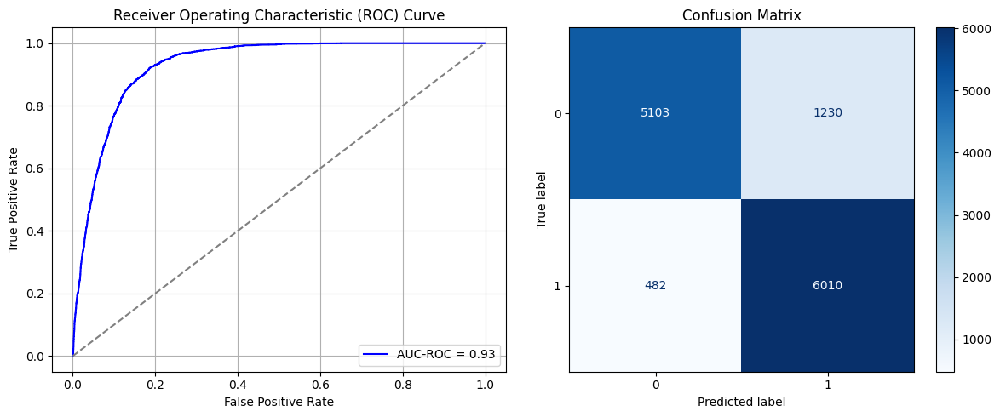

<ipython-input-38-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9940472841262817
Time elapsed (performance): 79.94149585299965


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5481 - loss: 0.9325 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6761 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7026 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7311 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9734
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7471 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7324 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7448 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5408 - loss: 0.9491 - val_AUC: 0.0000e+00 - val_loss: 0.9752
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6738 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7114 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.9660
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7158 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7299 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7436 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.9849
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7379 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7422 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5498 - loss: 0.9363 - val_AUC: 0.0000e+00 - val_loss: 0.9571
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6742 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7103 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7271 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8061
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7332 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.7898
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7379 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7409 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9290
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7462 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5496 - loss: 0.9375 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6591 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7152 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7245 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7337 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7321 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7496 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.5538 - loss: 0.9215 - val_AUC: 0.0000e+00 - val_loss: 0.9906
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6782 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7194 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9471
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7286 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7387 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7382 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7364 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7379 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.5336 - loss: 0.9599 - val_AUC: 0.0000e+00 - val_loss: 0.9720
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6689 - loss: 0.6243 - val_AUC: 0.0000e+00 - val_loss: 0.9810
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7060 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.9935
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7244 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.9792
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7225 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7425 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.9699
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7493 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5445 - loss: 0.9393 - val_AUC: 0.0000e+00 - val_loss: 1.0591
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6840 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.9420
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7136 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 1.0376
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7301 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7387 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7336 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7345 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.7805
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7450 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5479 - loss: 0.9413 - val_AUC: 0.0000e+00 - val_loss: 0.9860
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6619 - loss: 0.6271 - val_AUC: 0.0000e+00 - val_loss: 0.8784
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7085 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7406 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7497 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7406 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5458 - loss: 0.9581 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6796 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 0.9601
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7056 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.8745
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7317 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7376 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7394 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7399 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5538 - loss: 0.9392 - val_AUC: 0.0000e+00 - val_loss: 0.9598
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6719 - loss: 0.6265 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7163 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.9587
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7233 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9780
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7444 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7372 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.7101
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7333 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7539 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.5544 - loss: 0.9278 - val_AUC: 0.0000e+00 - val_loss: 0.9531
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6785 - loss: 0.6263 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7077 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7363 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7274 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7341 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.7906
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7454 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9695
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5525 - loss: 0.9298 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6659 - loss: 0.6299 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7138 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7293 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.7598
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7292 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7342 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7520 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7445 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5452 - loss: 0.9453 - val_AUC: 0.0000e+00 - val_loss: 0.9913
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6734 - loss: 0.6236 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7138 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7371 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9510
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7338 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7337 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7463 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7439 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5435 - loss: 0.9448 - val_AUC: 0.0000e+00 - val_loss: 0.9866
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6699 - loss: 0.6281 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7193 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7177 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7287 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7459 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9871
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7382 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7472 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.7529
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5410 - loss: 0.9375 - val_AUC: 0.0000e+00 - val_loss: 0.9519
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6862 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 1.0097
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7132 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7209 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7221 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7416 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7413 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9461
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7355 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5617 - loss: 0.9044 - val_AUC: 0.0000e+00 - val_loss: 0.9981
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6640 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7176 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.9211
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7256 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7301 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7363 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.7803
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7403 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7453 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5326 - loss: 0.9462 - val_AUC: 0.0000e+00 - val_loss: 1.0057
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6741 - loss: 0.6253 - val_AUC: 0.0000e+00 - val_loss: 1.0178
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7159 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7263 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7352 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7359 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7380 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7392 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.5539 - loss: 0.9177 - val_AUC: 0.0000e+00 - val_loss: 0.9714
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6675 - loss: 0.6298 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7136 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.9524
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7353 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7321 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7476 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7474 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.7199
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5507 - loss: 0.9263 - val_AUC: 0.0000e+00 - val_loss: 1.0495
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6837 - loss: 0.6216 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7137 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.9735
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7357 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7462 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7378 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7376 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7585 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5411 - loss: 0.9565 - val_AUC: 0.0000e+00 - val_loss: 0.9855
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6790 - loss: 0.6237 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7070 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7319 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7362 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7342 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7389 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7590 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.8145 - loss: 0.5135 - val_AUC: 0.8991 - val_loss: 0.3992
Epoch 2/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8999 - loss: 0.3951 - val_AUC: 0.9124 - val_loss: 0.3740
Epoch 3/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.9146 - loss: 0.3634 - val_AUC: 0.9199 - val_loss: 0.3581
Epoch 4/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.9210 - loss: 0.3492 - val_AUC: 0.9220 - val_loss: 0.3561
Epoch 5/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.9256 - loss: 0.3382 - val_AUC: 0.9235 - val_loss: 0.3436
Epoch 6/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - AUC: 0.9280 - loss: 0.3298 - val_AUC: 0.9285 - val_loss: 0.3335
Epoch 7/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9313 - loss: 0.3214 - val_AUC: 0.9301 - val_loss: 0.3258
Epoch 8/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - AUC: 0.9309 - loss: 0.3217 - val_AUC: 0.9310 - val_loss: 0.3203
Epoch 9/10
1283/1283 ━━━━━━━━━━━━━━━━

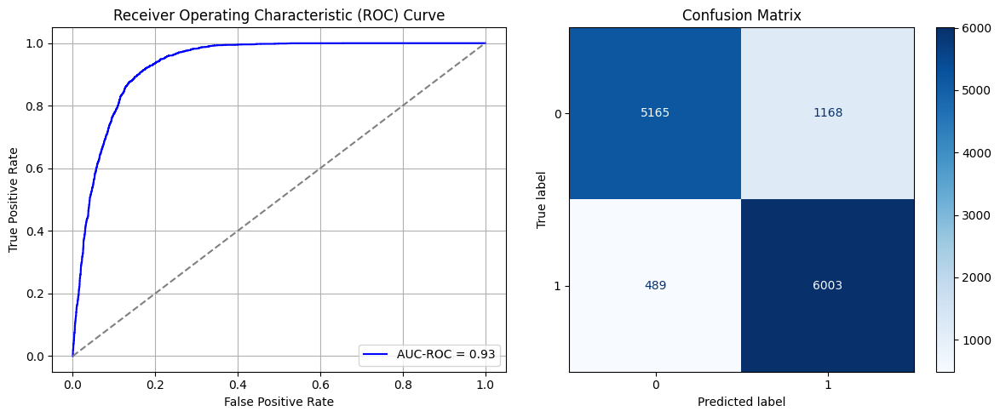

Best threshold based on F1-score: 0.40643760561943054
Time elapsed (performance): 71.4791555440006


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5242 - loss: 0.9762 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6611 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7077 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7201 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7361 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7261 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7358 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5204 - loss: 0.9912 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6558 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6964 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7159 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.7844
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7101 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.7584
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7243 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7429 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7368 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7655
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.5334 - loss: 0.9762 - val_AUC: 0.0000e+00 - val_loss: 0.9792
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6585 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9786
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7064 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7171 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7307 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7244 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7345 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7387 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.7200
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5313 - loss: 0.9600 - val_AUC: 0.0000e+00 - val_loss: 0.9712
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6586 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7051 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7215 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7182 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7303 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.7489
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7457 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.9588
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7387 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9701
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5215 - loss: 0.9900 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6420 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7065 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7096 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7256 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7341 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7439 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.7953
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5195 - loss: 0.9968 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6478 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6954 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7133 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7328 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7371 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7707
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5185 - loss: 1.0077 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6658 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6977 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7160 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7203 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7311 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7287 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7300 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5341 - loss: 0.9794 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6605 - loss: 0.6191 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6966 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.7715
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7175 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.7234
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7265 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7332 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7292 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7443 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.5378 - loss: 0.9640 - val_AUC: 0.0000e+00 - val_loss: 0.9777
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6650 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7018 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7293 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7188 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7287 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7300 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.7565
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7409 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5304 - loss: 0.9781 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6648 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7044 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7165 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9350
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7308 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7344 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7273 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5203 - loss: 0.9808 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6571 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6991 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7145 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7321 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7442 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7420 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5192 - loss: 0.9901 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6546 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6904 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.9748
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7109 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7292 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7372 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7389 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.7446
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7367 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.7502
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5207 - loss: 0.9946 - val_AUC: 0.0000e+00 - val_loss: 0.9697
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6579 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6875 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7098 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.7591
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7230 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7373 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8929
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7443 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5362 - loss: 0.9861 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6690 - loss: 0.6224 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7046 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.7899
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7128 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7317 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7389 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7341 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.7706
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7430 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5319 - loss: 0.9788 - val_AUC: 0.0000e+00 - val_loss: 0.9762
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6606 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7089 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7380 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7541 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7604
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7435 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5299 - loss: 0.9609 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6546 - loss: 0.6279 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6933 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9522
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7166 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7205 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7338 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.9495
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7369 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5242 - loss: 0.9824 - val_AUC: 0.0000e+00 - val_loss: 0.9676
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6579 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7035 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7283 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7267 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.9406
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7453 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7473 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5402 - loss: 0.9539 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6611 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6996 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.7786
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7203 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7228 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7373 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9177
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7336 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5321 - loss: 0.9716 - val_AUC: 0.0000e+00 - val_loss: 0.9474
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6675 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6890 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.7486
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7130 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7267 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7288 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7333 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7369 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.5291 - loss: 0.9745 - val_AUC: 0.0000e+00 - val_loss: 0.9513
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6604 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6962 - loss: 0.6120 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7394 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8454
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7373 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8548
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7354 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.8084 - loss: 0.5213 - val_AUC: 0.8953 - val_loss: 0.4111
Epoch 2/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8996 - loss: 0.3966 - val_AUC: 0.9073 - val_loss: 0.3815
Epoch 3/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.9100 - loss: 0.3734 - val_AUC: 0.9156 - val_loss: 0.3624
Epoch 4/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9208 - loss: 0.3495 - val_AUC: 0.9177 - val_loss: 0.3582
Epoch 5/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.9237 - loss: 0.3425 - val_AUC: 0.9211 - val_loss: 0.3471
Epoch 6/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9248 - loss: 0.3378 - val_AUC: 0.9246 - val_loss: 0.3400
Epoch 7/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9263 - loss: 0.3325 - val_AUC: 0.9277 - val_loss: 0.3288
Epoch 8/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.9320 - loss: 0.3187 - val_AUC: 0.9258 - val_loss: 0.3688
Epoch 9/10
1283/1283 ━━━━━━━━━━━━━━

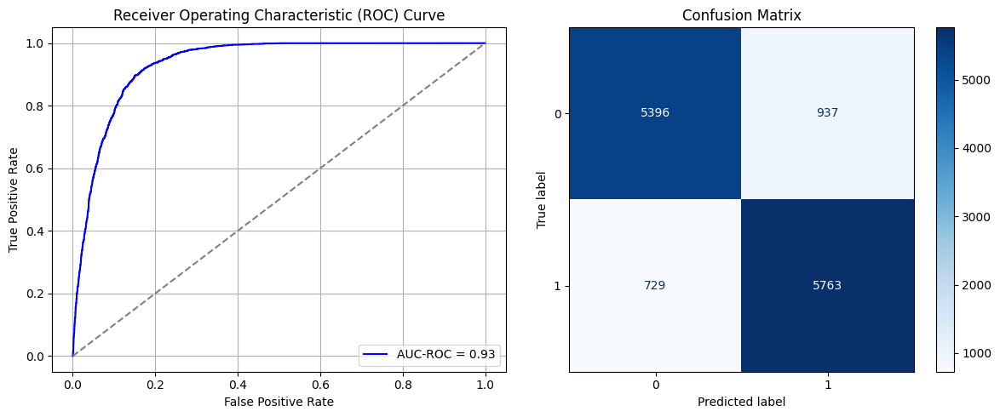

<ipython-input-38-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.985754668712616
Time elapsed (performance): 82.52076386299996


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6109 - loss: 0.9193 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7533 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7584 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8033
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7648 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7666 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7691 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7817 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5964 - loss: 0.9642 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7366 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7566 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7677 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7705 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7776 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.7348
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7735 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.8181
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6071 - loss: 0.9357 - val_AUC: 0.0000e+00 - val_loss: 0.9425
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7346 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7721
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7680 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7718 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7698 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7746 - loss: 0.5438 - val_AUC: 0.0000e+00 - val_loss: 0.6829
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7737 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6188 - loss: 0.9105 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7387 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7615 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7679 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7648 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7589 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7710 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7817 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6055 - loss: 0.9204 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7347 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7492 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7625 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7670 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.7878
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7728 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.7961
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7775 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7772 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6028 - loss: 0.9191 - val_AUC: 0.0000e+00 - val_loss: 0.9636
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7325 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7535 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7678 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7639 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.7203
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7720 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7538
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7701 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7757 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6207 - loss: 0.9097 - val_AUC: 0.0000e+00 - val_loss: 0.9444
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7415 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7585 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7674 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7717 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.7468
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7733 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7732 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7727 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.9467
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6068 - loss: 0.9318 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7658 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7699 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7705 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7679 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7754 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7753 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5959 - loss: 0.9550 - val_AUC: 0.0000e+00 - val_loss: 0.9554
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7292 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7540 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7606 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7680 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.7445
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7825 - loss: 0.5407 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7738 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7720 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6095 - loss: 0.9269 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7374 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7504 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7583
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7616 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7674 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.7088
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7687 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7794
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7663 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7711 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6111 - loss: 0.9304 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7345 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7572 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7659 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.7838
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7709 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7715 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7751 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.6957
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7721 - loss: 0.5503 - val_AUC: 0.0000e+00 - val_loss: 0.7545
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6098 - loss: 0.9357 - val_AUC: 0.0000e+00 - val_loss: 0.9423
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7415 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.7477
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7442 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7640 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7615 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7665 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.7886
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7660 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.7116
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6040 - loss: 0.9270 - val_AUC: 0.0000e+00 - val_loss: 0.9238
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7568 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7474
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7608 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7699 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7664 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7775 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.6812
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7718 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6003 - loss: 0.9445 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7420 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7533 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7644 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7934
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7649 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.7363
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7755 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.7495
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7685 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5956 - loss: 0.9574 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7383 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7521 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7657 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.7468
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7651 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8745
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7722 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7623 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.6510
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7740 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.7630
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6017 - loss: 0.9364 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7403 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7548 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7603 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7663 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.9596
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7656 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.7604
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7764 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.7414
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7727 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6086 - loss: 0.9257 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7426 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7644 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7600 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7617 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7637 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7703 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.7877
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7800 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6073 - loss: 0.9334 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7402 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7513 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7547
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7646 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7618 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7596 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7699 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7771 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6008 - loss: 0.9500 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7411 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8192
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7496 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.7673
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7738 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7670 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7671 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7680 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7757 - loss: 0.5438 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.6040 - loss: 0.9304 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7330 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9315
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7591 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7607 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7656 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7732 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.9766
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7713 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7685 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - AUC: 0.8160 - loss: 0.5100 - val_AUC: 0.8975 - val_loss: 0.4042
Epoch 2/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.9029 - loss: 0.3905 - val_AUC: 0.9115 - val_loss: 0.4100
Epoch 3/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.9151 - loss: 0.3621 - val_AUC: 0.9216 - val_loss: 0.3515
Epoch 4/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.9243 - loss: 0.3419 - val_AUC: 0.9240 - val_loss: 0.3480
Epoch 5/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.9257 - loss: 0.3360 - val_AUC: 0.9270 - val_loss: 0.3315
Epoch 6/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.9277 - loss: 0.3306 - val_AUC: 0.9297 - val_loss: 0.3288
Epoch 7/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.9310 - loss: 0.3229 - val_AUC: 0.9322 - val_loss: 0.3171
Epoch 8/10
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - AUC: 0.9344 - loss: 0.3127 - val_AUC: 0.9317 - val_loss: 0.3229
Epoch 9/10
1283/1283 ━━━━━━━━━━━━━━

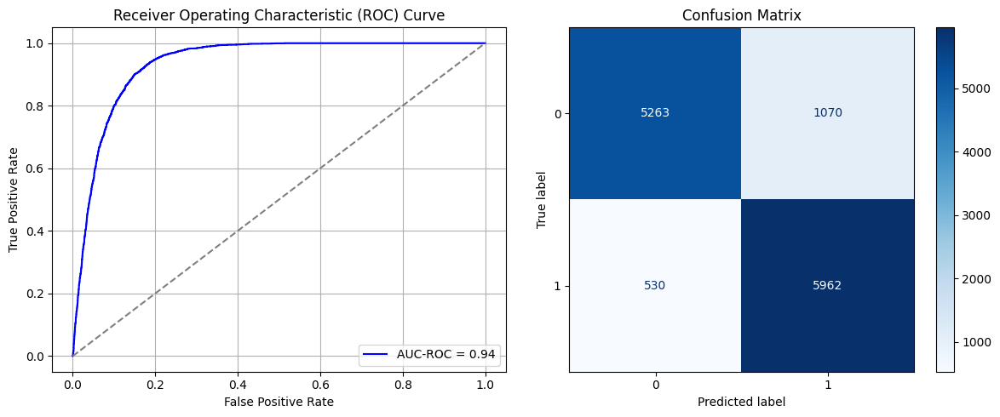

<ipython-input-38-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9957496523857117
Time elapsed (performance): 92.2072619899991


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4833 - loss: 1.0300 - val_AUC: 0.0000e+00 - val_loss: 1.0189
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6737 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6996 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9934
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7051 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7017 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7168 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7190 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7231 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.4999 - loss: 1.0158 - val_AUC: 0.0000e+00 - val_loss: 0.9844
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6756 - loss: 0.6375 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6907 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.9228
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7014 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7029 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7085 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7207 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7300 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9085
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.4905 - loss: 1.0083 - val_AUC: 0.0000e+00 - val_loss: 1.0444
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6531 - loss: 0.6416 - val_AUC: 0.0000e+00 - val_loss: 0.9299
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6728 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7029 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.8107
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6948 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7237 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9708
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.4802 - loss: 1.0305 - val_AUC: 0.0000e+00 - val_loss: 1.0738
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6355 - loss: 0.6479 - val_AUC: 0.0000e+00 - val_loss: 0.9893
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6863 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7016 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.9061
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7085 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7046 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4923 - loss: 1.0284 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6623 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6881 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7006 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7019 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 1.0232
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7123 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7257 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7081 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.7699
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4731 - loss: 1.0176 - val_AUC: 0.0000e+00 - val_loss: 0.9924
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6523 - loss: 0.6454 - val_AUC: 0.0000e+00 - val_loss: 0.9730
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6896 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 0.9812
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6984 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7058 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7234 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7141 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9149
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.4872 - loss: 0.9947 - val_AUC: 0.0000e+00 - val_loss: 1.0874
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6554 - loss: 0.6415 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6696 - loss: 0.6288 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6904 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.9650
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7080 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7086 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7123 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7151 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4661 - loss: 1.0448 - val_AUC: 0.0000e+00 - val_loss: 1.0309
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6535 - loss: 0.6378 - val_AUC: 0.0000e+00 - val_loss: 0.9505
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6871 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6961 - loss: 0.6100 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7094 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7141 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7135 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7133 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 1.0458
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4979 - loss: 1.0155 - val_AUC: 0.0000e+00 - val_loss: 0.9575
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6646 - loss: 0.6383 - val_AUC: 0.0000e+00 - val_loss: 1.0246
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.9159
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7018 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7075 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7209 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7183 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4856 - loss: 1.0161 - val_AUC: 0.0000e+00 - val_loss: 1.1015
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6542 - loss: 0.6440 - val_AUC: 0.0000e+00 - val_loss: 1.0826
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6944 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7029 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7172 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.7501
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.4749 - loss: 1.0584 - val_AUC: 0.0000e+00 - val_loss: 0.9845
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6802 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7058 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7036 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7073 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9922
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4691 - loss: 1.0538 - val_AUC: 0.0000e+00 - val_loss: 1.1020
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6439 - loss: 0.6466 - val_AUC: 0.0000e+00 - val_loss: 0.9420
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6950 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7006 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 1.0663
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7131 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7142 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4854 - loss: 1.0103 - val_AUC: 0.0000e+00 - val_loss: 0.9930
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6476 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 1.0067
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6844 - loss: 0.6246 - val_AUC: 0.0000e+00 - val_loss: 0.9837
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6824 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.9352
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7157 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7189 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7149 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9368
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4814 - loss: 1.0319 - val_AUC: 0.0000e+00 - val_loss: 0.9874
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6509 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6929 - loss: 0.6205 - val_AUC: 0.0000e+00 - val_loss: 1.0350
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7020 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7078 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7140 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7156 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.4794 - loss: 1.0331 - val_AUC: 0.0000e+00 - val_loss: 0.9961
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6631 - loss: 0.6429 - val_AUC: 0.0000e+00 - val_loss: 0.9923
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6779 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6980 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 0.9857
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 1.0768
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8192
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7121 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7277 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4734 - loss: 1.0449 - val_AUC: 0.0000e+00 - val_loss: 1.0388
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6599 - loss: 0.6409 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6937 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6933 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6985 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7126 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7097 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7103 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4820 - loss: 1.0303 - val_AUC: 0.0000e+00 - val_loss: 0.9948
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6482 - loss: 0.6370 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6766 - loss: 0.6222 - val_AUC: 0.0000e+00 - val_loss: 0.9275
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7097 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7066 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6986 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7193 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7234 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1470 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1471 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1472 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1476 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.4804 - loss: 1.0277 - val_AUC: 0.0000e+00 - val_loss: 1.0634
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6640 - loss: 0.6439 - val_AUC: 0.0000e+00 - val_loss: 1.0146
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6940 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9541
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7030 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7071 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9444
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7075 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7196 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7174 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1477 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1478 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1479 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1483 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.4879 - loss: 1.0089 - val_AUC: 0.0000e+00 - val_loss: 1.0158
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6548 - loss: 0.6457 - val_AUC: 0.0000e+00 - val_loss: 0.9920
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6968 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9990
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7043 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9099
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7198 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9356
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7066 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7264 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 9/10
260/260 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1484 (Dense)              │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1485 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1486 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1490 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


260/260 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.4839 - loss: 1.0356 - val_AUC: 0.0000e+00 - val_loss: 0.9627
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6736 - loss: 0.6380 - val_AUC: 0.0000e+00 - val_loss: 0.9999
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7008 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.7462
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9255
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7028 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7141 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 9/10
260/260 ━━━━━━━━━━━━━━━━

In [56]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


In [58]:
print(ParamFit)
ParamFit.to_csv('SRS_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.181748  0.474048
1   0.184841  0.460208
2   0.191802  0.456747
3   0.152359  0.529412
4   0.160866  0.501730
..       ...       ...
95  0.293117  0.321799
96  0.220418  0.418685
97  0.167053  0.505190
98  0.163960  0.508651
99  0.241299  0.352941

[100 rows x 2 columns]


In [59]:
ParamFit['FNR'].mean()

np.float64(0.48242214532871974)

## Systematic Resampling:

In this case, we examine the possibility of performing Random Oversampling on the minority class using systematic sampling. For this purpose, taking a sampling interval of $k$, we would compile a total of $k*\frac{N_0-N_1}{N_1}$ systematic samples from the minority class in order to balance the dataset. We sample the starting point from 1 to $k$ *with replacement*, since a highly imbalanced dataset will require sampling with replacement in order to achieve a balanced dataset.

In particular, we take $k=10$ for the source data sampling, and take $k=20$ for the target training data resampling.

In [47]:
X_S_Sy, y_S_Sy = systematic_resampler(data_S_full, data_S_full.iloc[:, -1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_resampler(T_train, T_train.iloc[:, -1], 20)
print(y_T_train_Sy)

3224
32062
Nsamples= 89.44789081885857
0        0
1        0
2        0
3        0
4        0
        ..
35155    1
35175    1
35211    1
35250    1
35275    1
Name: Y2, Length: 63944, dtype: int64
1135
5190
Nsamples= 71.45374449339207
2026    0.0
4052    0.0
4096    0.0
4319    0.0
2572    0.0
       ... 
5675    1.0
2867    1.0
7020    1.0
6000    1.0
5795    1.0
Name: Y, Length: 10301, dtype: float64


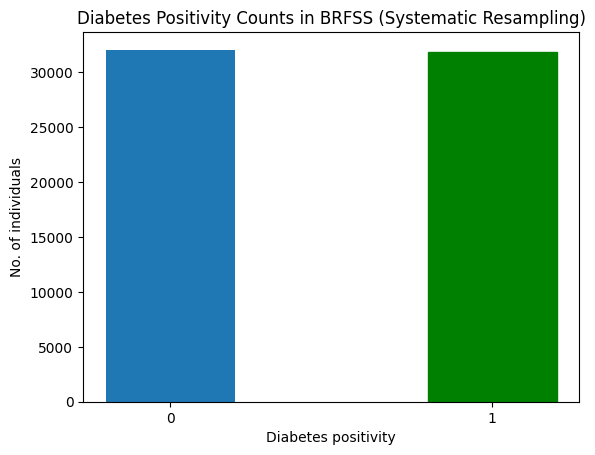

In [48]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Resampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.8111 - loss: 0.5180 - val_AUC: 0.9016 - val_loss: 0.3963
Epoch 2/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - AUC: 0.8999 - loss: 0.3972 - val_AUC: 0.9074 - val_loss: 0.3830
Epoch 3/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.9067 - loss: 0.3812 - val_AUC: 0.9132 - val_loss: 0.3658
Epoch 4/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9142 - loss: 0.3629 - val_AUC: 0.9192 - val_loss: 0.3560
Epoch 5/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9195 - loss: 0.3513 - val_AUC: 0.9248 - val_loss: 0.3394
Epoch 6/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9245 - loss: 0.3395 - val_AUC: 0.9246 - val_loss: 0.3378
Epoch 7/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.9278 - loss: 0.3304 - val_AUC: 0.9287 - val_loss: 0.3260
Epoch 8/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - AUC: 0.9295 - loss: 0.3252 - val_AUC: 0.9296 - val_loss: 0.3213
Epoch 9/10
1279/1279 ━━━━━━━━━━━━━━━━━

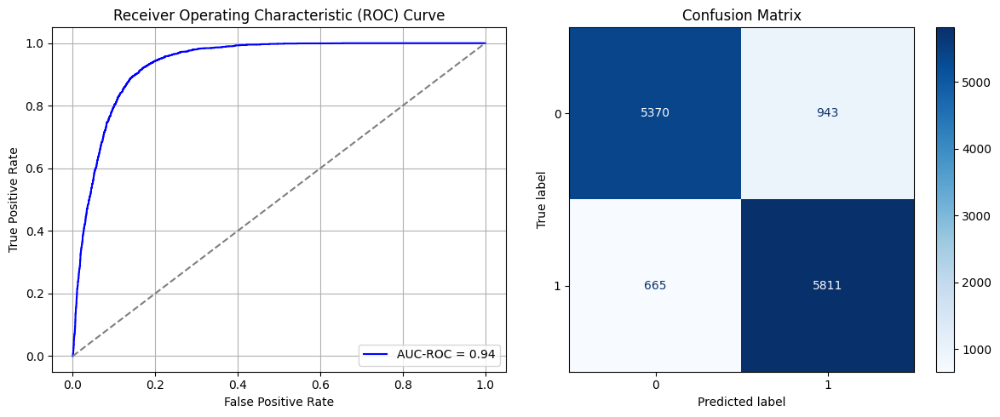

Best threshold based on F1-score: 0.3829246461391449
Time elapsed (performance): 57.564260237999974


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6981 - loss: 0.6767 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7315 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8049
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7426 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7409 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7628 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7680 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7637 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7868
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7709 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6966 - loss: 0.6811 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7475 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7507 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7526 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7667 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.7635
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7665 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7639 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6862 - loss: 0.6917 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7374 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8049
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7500 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7633 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7640 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7688 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7778 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.7391
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7005 - loss: 0.6768 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7370 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.7953
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7410 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.7507
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7583 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7759 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.7676
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7674 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7657 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.7995
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6985 - loss: 0.6732 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7259 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.7652
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7581 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7624 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7633 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7574 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.7278
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7661 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7689 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7076 - loss: 0.6645 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7269 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7535 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7564 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7600 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.7220
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7711 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7607
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7674 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7692 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.7392
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6981 - loss: 0.6881 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7325 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7536 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7621
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7549 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7623 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7666 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.7352
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7673 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7628 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6996 - loss: 0.6769 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7213 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7387 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7588 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.8107
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7602 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7643 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7724 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7002 - loss: 0.6719 - val_AUC: 0.0000e+00 - val_loss: 0.8514
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7270 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.7646
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7537 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7549 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.7499
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7586 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7673 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7576 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7615 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.7978
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6934 - loss: 0.6848 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7265 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.9039
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7488 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7718 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7626 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7610 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7679 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6884 - loss: 0.6969 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7246 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7458 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7596 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7597 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7514 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7547 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7700 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6945 - loss: 0.6876 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7183 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7505 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7514 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7605 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.7294
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7601 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7674 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7673 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6910 - loss: 0.6984 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7185 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7517 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7607 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7889
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7603 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7660 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7625 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7633 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7055 - loss: 0.6649 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7337 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7490 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7485 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7668 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7636 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7603 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7730 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6923 - loss: 0.6791 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7272 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7403 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7635 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7591 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.7990
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7693 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.7661
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7705 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.8033
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7679 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7069 - loss: 0.6566 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7228 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7391 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8166
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7464 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7679 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7655 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.7512
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7673 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7730 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7569
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7003 - loss: 0.6671 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7487 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7546 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7536 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7586 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7689 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7554
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7626 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6946 - loss: 0.6926 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7315 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7581 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7623 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7654 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7725 - loss: 0.5412 - val_AUC: 0.0000e+00 - val_loss: 0.7753
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7713 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.6993
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6915 - loss: 0.6852 - val_AUC: 0.0000e+00 - val_loss: 0.9148
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7332 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7373 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7538 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.7415
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7792 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7626 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7630
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6857 - loss: 0.6976 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7242 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7417 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7458 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7604 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7608 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7595 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7735 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - AUC: 0.8131 - loss: 0.5147 - val_AUC: 0.8988 - val_loss: 0.4087
Epoch 2/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8965 - loss: 0.4028 - val_AUC: 0.9105 - val_loss: 0.3814
Epoch 3/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9098 - loss: 0.3746 - val_AUC: 0.9189 - val_loss: 0.3614
Epoch 4/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - AUC: 0.9192 - loss: 0.3527 - val_AUC: 0.9250 - val_loss: 0.3413
Epoch 5/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9255 - loss: 0.3372 - val_AUC: 0.9268 - val_loss: 0.3376
Epoch 6/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9281 - loss: 0.3301 - val_AUC: 0.9302 - val_loss: 0.3264
Epoch 7/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9290 - loss: 0.3267 - val_AUC: 0.9310 - val_loss: 0.3233
Epoch 8/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9304 - loss: 0.3207 - val_AUC: 0.9330 - val_loss: 0.3196
Epoch 9/10
1279/1279 ━━━━━━━━━━━━━━━━━

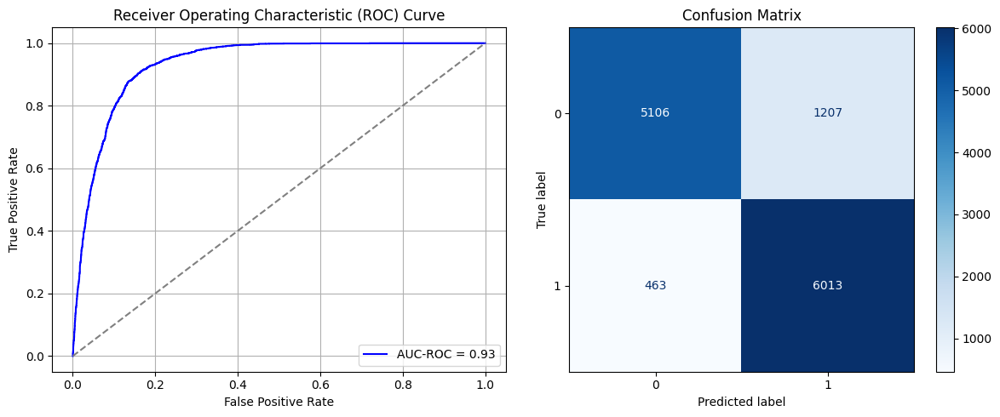

Best threshold based on F1-score: 0.5686136484146118
Time elapsed (performance): 57.17603363600006


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6425 - loss: 0.7800 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6981 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.9522
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7163 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7353 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7383 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7490 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6403 - loss: 0.7879 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6969 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.9622
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7137 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7281 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7284 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7300 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7397 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7414 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6475 - loss: 0.7808 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6989 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7138 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7222 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7316 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7356 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.7722
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7456 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7522 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.7721
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6427 - loss: 0.7865 - val_AUC: 0.0000e+00 - val_loss: 0.9807
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7049 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8366
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7170 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7280 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7382 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.7577
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7463 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8138
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7422 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.7506
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7554 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6468 - loss: 0.7824 - val_AUC: 0.0000e+00 - val_loss: 0.9355
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7040 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7396 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7286 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7416 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.9252
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7490 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6503 - loss: 0.7936 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7032 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 1.0041
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7162 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7310 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7325 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7456 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7391 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7367 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6515 - loss: 0.7784 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7019 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7194 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7260 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7190 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7439 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7418 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6581 - loss: 0.7603 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6998 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7142 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7266 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7359 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7498 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7373 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7429 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6511 - loss: 0.7775 - val_AUC: 0.0000e+00 - val_loss: 0.9334
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7069 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7148 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7225 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7433 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7351 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.7995
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7454 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7399 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.7889
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6428 - loss: 0.7820 - val_AUC: 0.0000e+00 - val_loss: 0.9484
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6902 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9503
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7104 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7222 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7274 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7436 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7462 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.7364
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6382 - loss: 0.8005 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6972 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7137 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9819
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7307 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7352 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7309 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7506 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7441 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6399 - loss: 0.7890 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6976 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7081 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7256 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7323 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7452 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.9186
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7412 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6404 - loss: 0.8109 - val_AUC: 0.0000e+00 - val_loss: 0.9978
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6940 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7154 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7323 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7398 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7471 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7488
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7487 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6357 - loss: 0.7960 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7010 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7141 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7326 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7343 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7277 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7482 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8745
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7404 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6462 - loss: 0.7871 - val_AUC: 0.0000e+00 - val_loss: 0.9391
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6930 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7229 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.7582
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7205 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7313 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7500 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7492 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7447 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6356 - loss: 0.8034 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6894 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7146 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9517
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7273 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7453 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7461 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7537 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.7537
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6556 - loss: 0.7750 - val_AUC: 0.0000e+00 - val_loss: 0.9488
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7088 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7153 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7332 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7395 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7418 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.7444
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7524 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6503 - loss: 0.7794 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7014 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.9334
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7199 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7376 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7395 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.7665
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7401 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7519 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6404 - loss: 0.7859 - val_AUC: 0.0000e+00 - val_loss: 0.9746
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6897 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7143 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8589
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7261 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7353 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.7621
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7400 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7430 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.9452
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7387 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6388 - loss: 0.8102 - val_AUC: 0.0000e+00 - val_loss: 0.9663
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6925 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7172 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9490
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7206 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9297
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7350 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7452 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7484 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.8163 - loss: 0.5137 - val_AUC: 0.8980 - val_loss: 0.4170
Epoch 2/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8981 - loss: 0.4002 - val_AUC: 0.9088 - val_loss: 0.3989
Epoch 3/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.9077 - loss: 0.3783 - val_AUC: 0.9176 - val_loss: 0.3656
Epoch 4/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9171 - loss: 0.3568 - val_AUC: 0.9167 - val_loss: 0.3603
Epoch 5/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - AUC: 0.9202 - loss: 0.3494 - val_AUC: 0.9254 - val_loss: 0.3456
Epoch 6/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.9266 - loss: 0.3348 - val_AUC: 0.9278 - val_loss: 0.3378
Epoch 7/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.9298 - loss: 0.3262 - val_AUC: 0.9292 - val_loss: 0.3340
Epoch 8/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9282 - loss: 0.3269 - val_AUC: 0.9291 - val_loss: 0.3259
Epoch 9/10
1279/1279 ━━━━━━━━━━━━━━━━

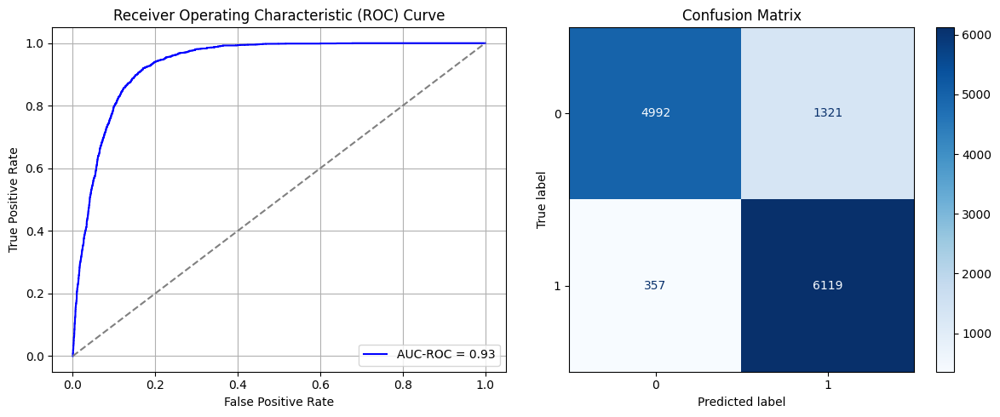

Best threshold based on F1-score: 0.6074960827827454
Time elapsed (performance): 71.15571643299995


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7078 - loss: 0.6870 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7273 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8328
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7396 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7445 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7559 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7570 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7038 - loss: 0.6902 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7231 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7437 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7353 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.7727
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7517 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7541 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7615 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7628 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7263 - loss: 0.6519 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7316 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8290
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7437 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7463 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7476 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7591 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7536 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7478 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7062 - loss: 0.6866 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7266 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7355 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7431 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7529 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8454
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7503 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7595 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7557 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7127 - loss: 0.6709 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7244 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7374 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7386 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7459 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7500 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7446 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.7701
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7613 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7051 - loss: 0.6761 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7417 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7359 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7515 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7385 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7530 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7466 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.7667
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7128 - loss: 0.6724 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7357 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7496 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.9148
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7394 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7519 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7474 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8272
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7481 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7074 - loss: 0.6716 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7386 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7394 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7448 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7465 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7442 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7541 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7569 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7149 - loss: 0.6651 - val_AUC: 0.0000e+00 - val_loss: 0.8544
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7380 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7405 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.7517
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7507 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7562 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7541 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7136 - loss: 0.6677 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7337 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7370 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7483 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7526 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7509 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.7889
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7549 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7490 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7184 - loss: 0.6649 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7381 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7361 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7655
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7446 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7524 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7645
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7534 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7496 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7538 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7085 - loss: 0.6736 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7320 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7424 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7473 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.7826
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7511 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7574 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7561 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7568 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6980 - loss: 0.6832 - val_AUC: 0.0000e+00 - val_loss: 0.7595
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7314 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7388 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7418 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.7474
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7496 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7490 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7634 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7050 - loss: 0.6816 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7249 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7336 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7507 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7468 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7632 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7150 - loss: 0.6658 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7285 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7915
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7472 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8012
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7452 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7505 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7506 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7601 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7591 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6889 - loss: 0.7004 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7314 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7470 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7470 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.7548
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7548 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7408 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7583
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7659 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7578
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7644 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7202 - loss: 0.6556 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7286 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8272
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7381 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7373 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7472 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.7702
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7527 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7516 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7703
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7491 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7078 - loss: 0.6807 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7321 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7437 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7496 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7392 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7449 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7587 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.7900
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7535 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7503
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7037 - loss: 0.6849 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7372 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7432 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7475 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8290
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7441 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7548 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7559 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7134 - loss: 0.6755 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7341 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7412 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7411 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7515 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8008
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7495 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7575 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7720
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.8004 - loss: 0.5250 - val_AUC: 0.9008 - val_loss: 0.4116
Epoch 2/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8982 - loss: 0.3990 - val_AUC: 0.9128 - val_loss: 0.3704
Epoch 3/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.9095 - loss: 0.3746 - val_AUC: 0.9167 - val_loss: 0.3618
Epoch 4/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.9153 - loss: 0.3597 - val_AUC: 0.9224 - val_loss: 0.3469
Epoch 5/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9221 - loss: 0.3452 - val_AUC: 0.9262 - val_loss: 0.3345
Epoch 6/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9247 - loss: 0.3383 - val_AUC: 0.9278 - val_loss: 0.3325
Epoch 7/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.9294 - loss: 0.3256 - val_AUC: 0.9292 - val_loss: 0.3252
Epoch 8/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.9292 - loss: 0.3242 - val_AUC: 0.9316 - val_loss: 0.3213
Epoch 9/10
1279/1279 ━━━━━━━━━━━━━━━━

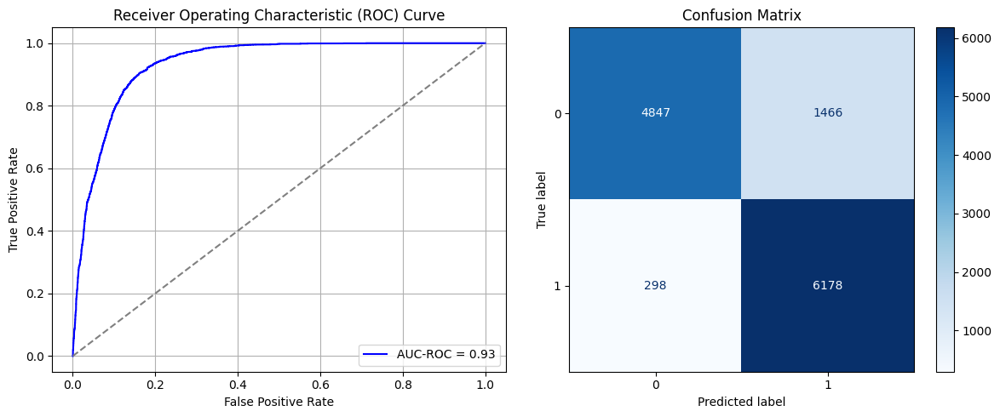

Best threshold based on F1-score: 0.6025790572166443
Time elapsed (performance): 76.83053138100013


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7210 - loss: 0.6757 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7452 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7442 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7389 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7422 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7070 - loss: 0.6874 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7149 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7442 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.9563
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7343 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7511 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7424 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7447 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7508 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7135 - loss: 0.6713 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7315 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7276 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7400 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7350 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7366 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7359 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7552
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7456 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.7834
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7192 - loss: 0.6647 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7236 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.7961
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7329 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7375 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7373 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7366 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7523 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7567 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7241 - loss: 0.6569 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7207 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7235 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8292
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7380 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7371 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7475 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7541 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7524 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7189 - loss: 0.6648 - val_AUC: 0.0000e+00 - val_loss: 0.9497
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7246 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8267
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7311 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7303 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7341 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7395 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7472 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7471 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7748
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7099 - loss: 0.6774 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7324 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7384 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7369 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7514 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.6930
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7506 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7451 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7220 - loss: 0.6531 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7266 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7244 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7499 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7396 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7168 - loss: 0.6766 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7327 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7327 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7415 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7415 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7491 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7173 - loss: 0.6658 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7145 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7281 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7466 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7441 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7474 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7359 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 9/10
258/258 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7196 - loss: 0.6629 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7183 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.7632
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7258 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7382 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7394 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7383 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7189 - loss: 0.6703 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7202 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7259 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7333 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7668
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7399 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7400 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7834
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6952 - loss: 0.7043 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7212 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.7643
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7459 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7420 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7462 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7488 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7400 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7170 - loss: 0.6659 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7313 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7238 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7336 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7367 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7418 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7400 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7435 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.7660
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7159 - loss: 0.6726 - val_AUC: 0.0000e+00 - val_loss: 0.9452
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7265 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7420 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7475 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7492 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7217 - loss: 0.6604 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7263 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7412 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7236 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.7910
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7416 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.7729
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7471 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.7492
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7276 - loss: 0.6549 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.7856
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7281 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7421 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7473 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7457 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7498 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7481 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7271 - loss: 0.6585 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7286 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7327 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7468 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7450 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7112 - loss: 0.6833 - val_AUC: 0.0000e+00 - val_loss: 0.8372
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7197 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7325 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7531 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7691
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7411 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7487 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.7533
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7113 - loss: 0.6814 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8135
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7374 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7321 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7431 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7395 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7508 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.8022 - loss: 0.5213 - val_AUC: 0.8987 - val_loss: 0.4027
Epoch 2/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.9004 - loss: 0.3954 - val_AUC: 0.9067 - val_loss: 0.3801
Epoch 3/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.9104 - loss: 0.3730 - val_AUC: 0.9159 - val_loss: 0.3618
Epoch 4/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.9187 - loss: 0.3544 - val_AUC: 0.9235 - val_loss: 0.3448
Epoch 5/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9241 - loss: 0.3404 - val_AUC: 0.9232 - val_loss: 0.3428
Epoch 6/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.9270 - loss: 0.3331 - val_AUC: 0.9280 - val_loss: 0.3307
Epoch 7/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.9278 - loss: 0.3302 - val_AUC: 0.9300 - val_loss: 0.3290
Epoch 8/10
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.9317 - loss: 0.3194 - val_AUC: 0.9317 - val_loss: 0.3186
Epoch 9/10
1279/1279 ━━━━━━━━━━━━━━━

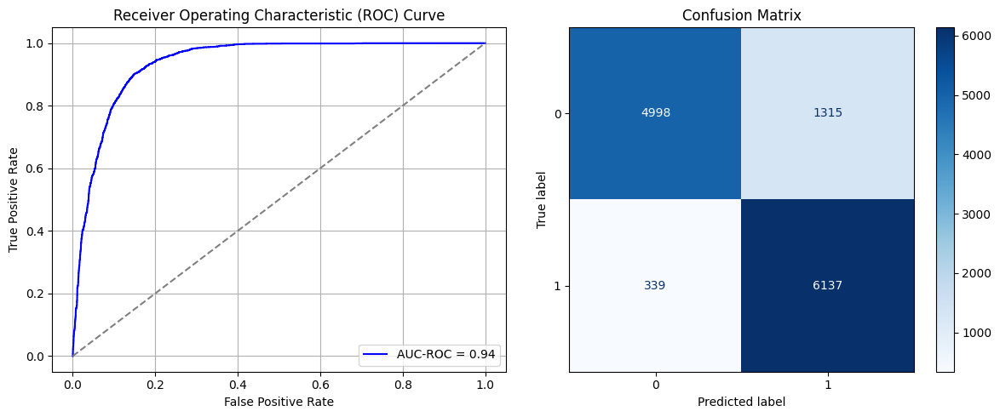

Best threshold based on F1-score: 0.5585811734199524
Time elapsed (performance): 80.98868386100003


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5627 - loss: 0.8858 - val_AUC: 0.0000e+00 - val_loss: 1.1115
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6666 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6998 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9380
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7228 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7347 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.9446
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7392 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5806 - loss: 0.8566 - val_AUC: 0.0000e+00 - val_loss: 0.9707
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6771 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6957 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7123 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9694
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7348 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7413 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - AUC: 0.5717 - loss: 0.8846 - val_AUC: 0.0000e+00 - val_loss: 1.0271
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6664 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6910 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 1.0046
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6984 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7369 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8544
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8032
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7407 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5596 - loss: 0.8963 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6672 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6973 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9228
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7180 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7248 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7443 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7461 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5741 - loss: 0.8538 - val_AUC: 0.0000e+00 - val_loss: 1.0469
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6649 - loss: 0.6270 - val_AUC: 0.0000e+00 - val_loss: 0.9844
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6949 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7199 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7247 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7444 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5687 - loss: 0.8807 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6609 - loss: 0.6298 - val_AUC: 0.0000e+00 - val_loss: 0.9843
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6990 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7340 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7321 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7516 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5753 - loss: 0.8685 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6664 - loss: 0.6206 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6989 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.9556
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7208 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9655
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7429 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7492 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.9534
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5816 - loss: 0.8574 - val_AUC: 0.0000e+00 - val_loss: 1.0374
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6695 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.9657
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6951 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.9557
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7293 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7329 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7422 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7475 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5788 - loss: 0.8731 - val_AUC: 0.0000e+00 - val_loss: 1.0629
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6595 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7080 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7300 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.9872
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7326 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7435 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.5752 - loss: 0.8579 - val_AUC: 0.0000e+00 - val_loss: 1.0156
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6795 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9304
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6968 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7462 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5628 - loss: 0.8833 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6542 - loss: 0.6309 - val_AUC: 0.0000e+00 - val_loss: 1.0768
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6922 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7216 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7320 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7313 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7437 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7449 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.9700
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5702 - loss: 0.8620 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6651 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7008 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7202 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7286 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.7876
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7421 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7448 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5727 - loss: 0.8675 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6710 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6917 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7199 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9540
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7441
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7420 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.6987
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7471 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.7856
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.5747 - loss: 0.8569 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6672 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7026 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.9535
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7317 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9610
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7450 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7390 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7528 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7592
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5753 - loss: 0.8614 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6682 - loss: 0.6226 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6926 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9430
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7404 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.9618
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7362 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9808
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7488 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.7786
Epoch 9/10
258/258 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5724 - loss: 0.8619 - val_AUC: 0.0000e+00 - val_loss: 0.9361
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6671 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6943 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7195 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7379 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7362 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7499 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.5782 - loss: 0.8670 - val_AUC: 0.0000e+00 - val_loss: 0.9419
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6599 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6933 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 1.0373
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7185 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7321 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7472 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 1.1194
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.5632 - loss: 0.8827 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6685 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.9655
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6949 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9349
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7119 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9725
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7481 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7505 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5624 - loss: 0.8792 - val_AUC: 0.0000e+00 - val_loss: 1.0077
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6682 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.9386
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7025 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.9738
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7071 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7380 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7445 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 9/10
258/258 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,361 (28.75 KB)

 Trainable params: 7,361 (28.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5568 - loss: 0.8977 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 2/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6502 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9522
Epoch 3/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7060 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 4/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7174 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 5/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 6/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7469 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.9299
Epoch 7/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 8/10
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7411 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.9519
Epoch 9/10
258/258 ━━━━━

In [49]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


In [54]:
print(ParamFit)
ParamFit.to_csv('Sy_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.201083  0.366782
1   0.204950  0.342561
2   0.204950  0.370242
3   0.218097  0.356401
4   0.245940  0.294118
..       ...       ...
95  0.197989  0.418685
96  0.159319  0.529412
97  0.139985  0.550173
98  0.197216  0.442907
99  0.201856  0.418685

[100 rows x 2 columns]


In [53]:
ParamFit['FNR'].mean()

np.float64(0.393114186851211)